In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.manifold import TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score as sil, calinski_harabasz_score as chs, silhouette_samples

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [3]:
data = pd.read_csv('C:\PCA\wine.csv')
data.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [4]:
data['Type'].values

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3], dtype=int64)

In [5]:
data.Type.unique()

array([1, 2, 3], dtype=int64)

In [6]:
data.Type.value_counts()

Type
2    71
1    59
3    48
Name: count, dtype: int64

In [7]:
# Dropping Type Feature as it is a classifier that we have three types of wines which we need to find in clustering by keeping it will affect our inferences and further analysis
data['ID'] = range(1, 179, 1)
data

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,3
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,4
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,174
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,175
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,176
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,177


In [8]:
df = data.drop('Type', axis = 1)

In [9]:
df.describe()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,89.500000
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,51.528309
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,1.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,45.250000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,89.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,133.750000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,178.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Alcohol          178 non-null    float64
 1   Malic            178 non-null    float64
 2   Ash              178 non-null    float64
 3   Alcalinity       178 non-null    float64
 4   Magnesium        178 non-null    int64  
 5   Phenols          178 non-null    float64
 6   Flavanoids       178 non-null    float64
 7   Nonflavanoids    178 non-null    float64
 8   Proanthocyanins  178 non-null    float64
 9   Color            178 non-null    float64
 10  Hue              178 non-null    float64
 11  Dilution         178 non-null    float64
 12  Proline          178 non-null    int64  
 13  ID               178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [11]:
# As a part of the Data cleansing we check the data for any missing/ na values
# null count for columns

null_count_col = df.isnull().sum().value_counts(ascending = False)
print("Null Count for Columns:\n", null_count_col)

Null Count for Columns:
 0    14
Name: count, dtype: int64


In [12]:
# null percentage for columns

null_percent_col = (df.isnull().sum() * 100 / len(df)).value_counts(ascending = False)
print("Null Percent for Columns:\n", null_percent_col)

Null Percent for Columns:
 0.0    14
Name: count, dtype: int64


In [13]:
# null count for rows

null_count_row = df.isnull().sum(axis = 1).value_counts(ascending = False)
print("Null Count for Rows:\n", null_count_row)

Null Count for Rows:
 0    178
Name: count, dtype: int64


In [14]:
null_percent_row = (df.isnull().sum(axis = 1) * 100 / len(df)).value_counts(ascending = False)
print("Null Percent for Rows:\n", null_percent_row)

Null Percent for Rows:
 0.0    178
Name: count, dtype: int64


In [15]:
# print the duplicated rows
df.duplicated().sum()

0

In [16]:
# Checking the skewness of our dataset.
df.skew()

Alcohol           -0.051482
Malic              1.039651
Ash               -0.176699
Alcalinity         0.213047
Magnesium          1.098191
Phenols            0.086639
Flavanoids         0.025344
Nonflavanoids      0.450151
Proanthocyanins    0.517137
Color              0.868585
Hue                0.021091
Dilution          -0.307285
Proline            0.767822
ID                 0.000000
dtype: float64

In [17]:
df = df.drop(['ID'], axis = 1)

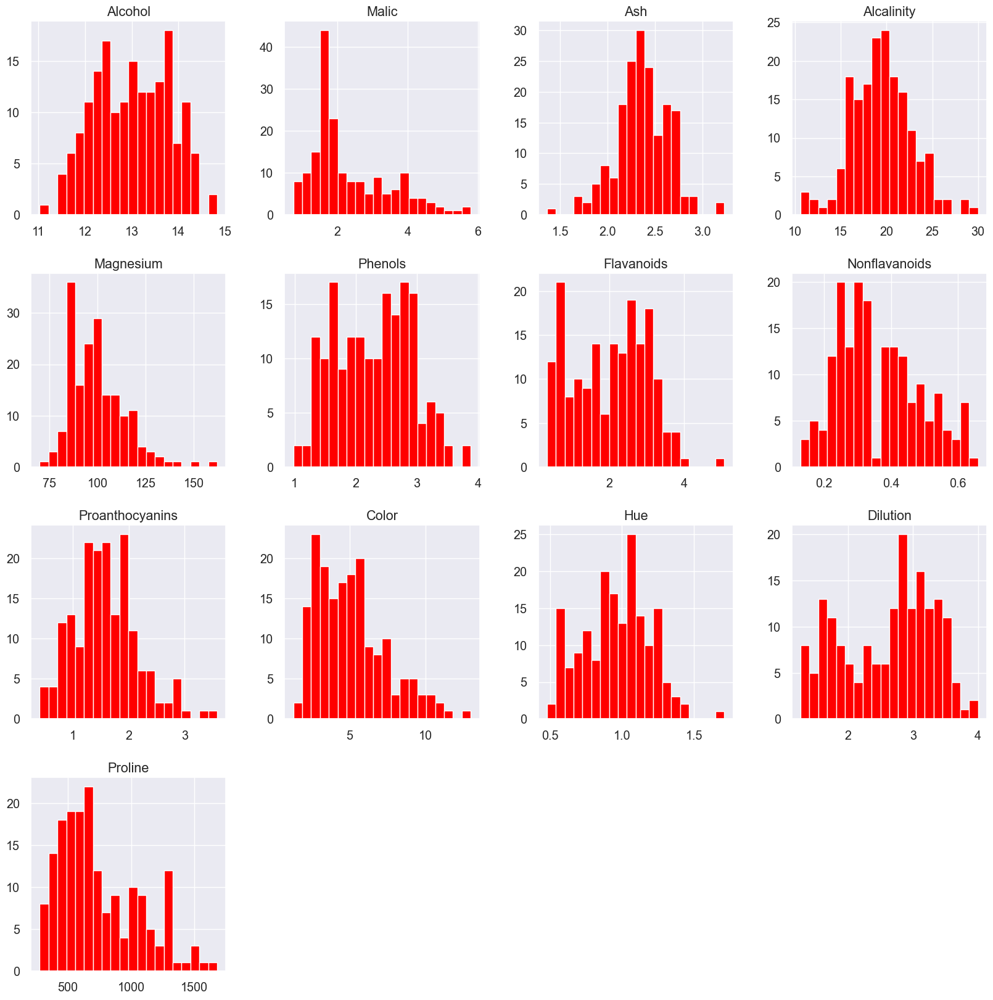

In [18]:
# Plotting the histogram of each numerical variable (in this case, all features), the main idea here is to visualize the data distribution for each feature. This method can bring fast insights as:
sns.set(style = 'dark', font_scale = 1.3, rc = {'figure.figsize':(20,20)})
ax = df.hist(bins = 20, color = 'Red')

In [19]:
df.columns

Index(['Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols',
       'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue',
       'Dilution', 'Proline'],
      dtype='object')

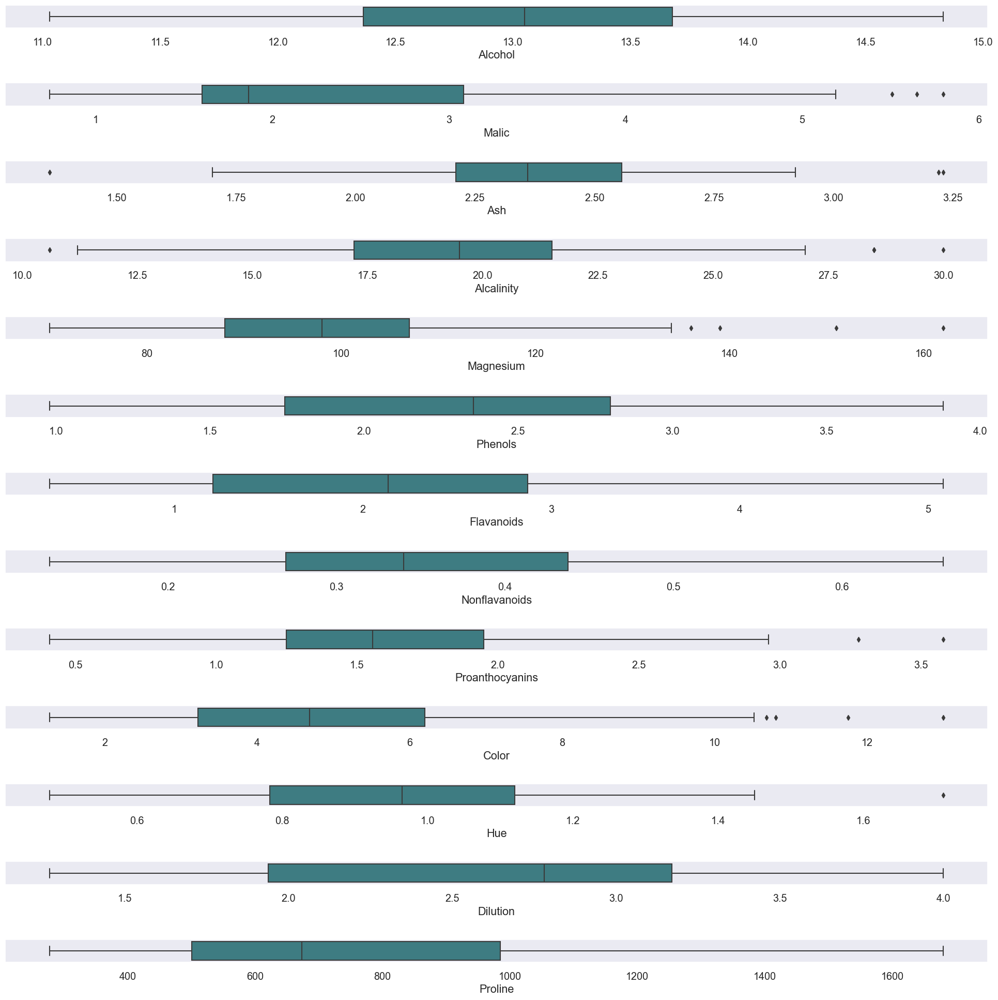

In [20]:
ot = df.copy() 
fig, axes = plt.subplots(13, 1, figsize = (20,20), sharex = False, sharey = False)
sns.boxplot(x = 'Alcohol', data = ot, palette = 'crest',ax = axes[0])
sns.boxplot(x = 'Malic', data = ot, palette = 'crest', ax = axes[1])
sns.boxplot(x = 'Ash', data = ot, palette = 'crest', ax = axes[2])
sns.boxplot(x = 'Alcalinity', data = ot, palette = 'crest', ax = axes[3])
sns.boxplot(x = 'Magnesium', data = ot, palette = 'crest', ax = axes[4])
sns.boxplot(x = 'Phenols', data = ot, palette = 'crest', ax = axes[5])
sns.boxplot(x = 'Flavanoids', data = ot, palette = 'crest', ax = axes[6])
sns.boxplot(x = 'Nonflavanoids', data = ot, palette = 'crest', ax = axes[7])
sns.boxplot(x = 'Proanthocyanins', data = ot, palette = 'crest', ax = axes[8])
sns.boxplot(x = 'Color', data = ot, palette = 'crest', ax = axes[9])
sns.boxplot(x = 'Hue', data = ot, palette = 'crest', ax = axes[10])
sns.boxplot(x = 'Dilution', data = ot, palette = 'crest', ax = axes[11])
sns.boxplot(x = 'Proline', data = ot, palette = 'crest', ax = axes[12])
plt.tight_layout(pad = 2.0)

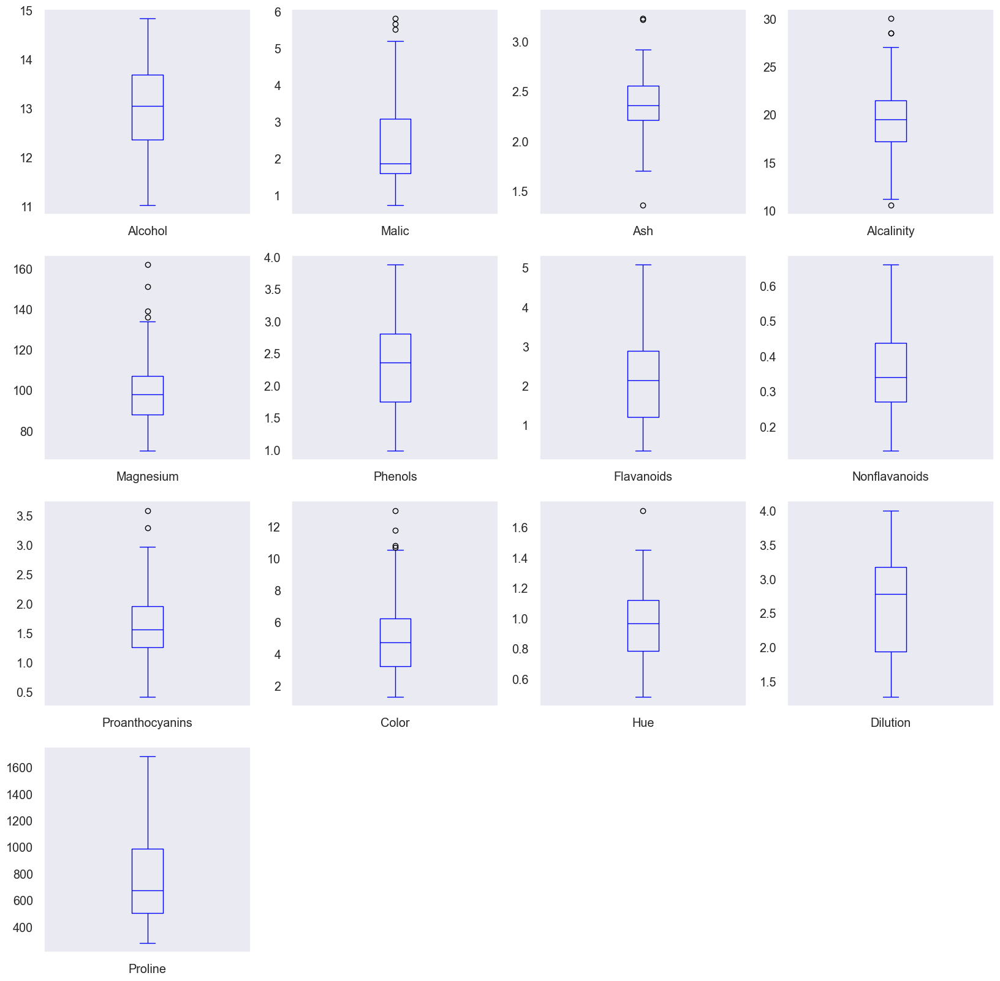

In [21]:
df.plot(kind = 'box', subplots = True, layout = (4,4), sharex = False, sharey = False, color = 'Blue')
plt.show()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\mariya

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Docume

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Docume

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Docume

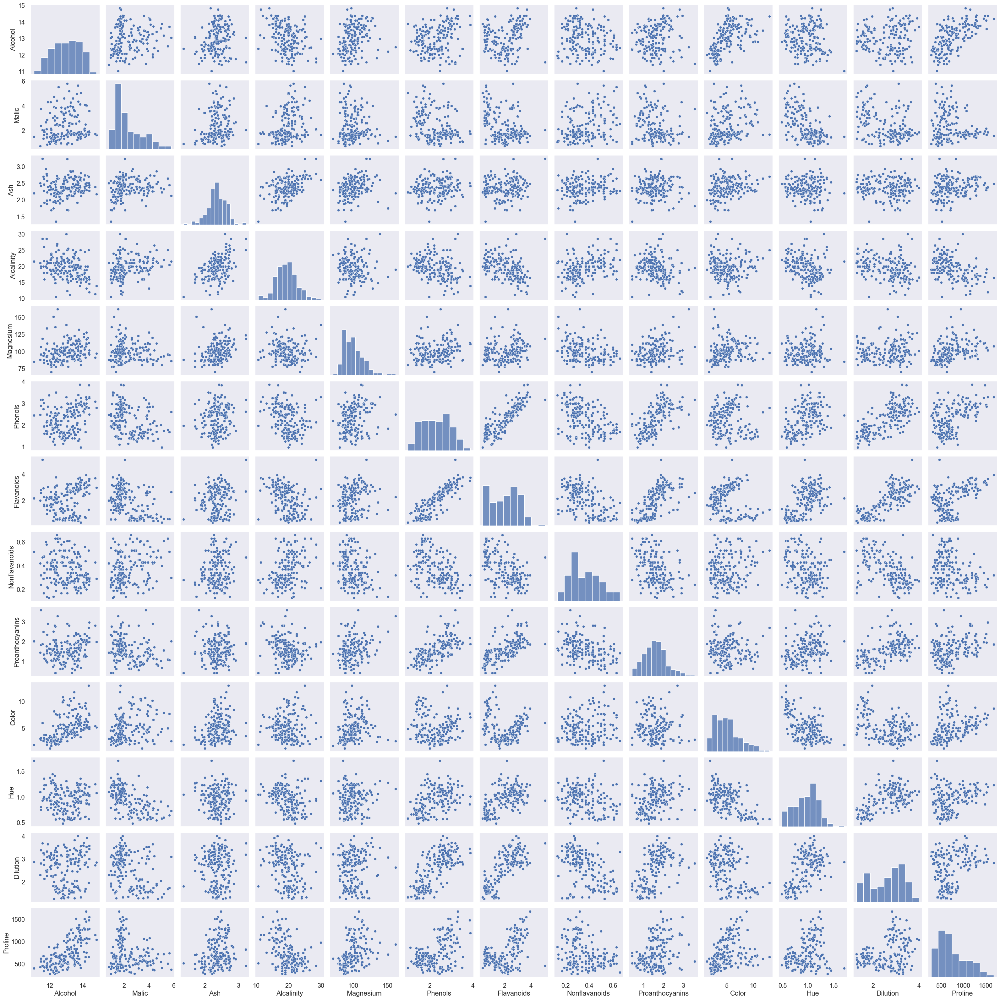

In [22]:
# Data Visualization
sns.pairplot(df, palette = 'dark')

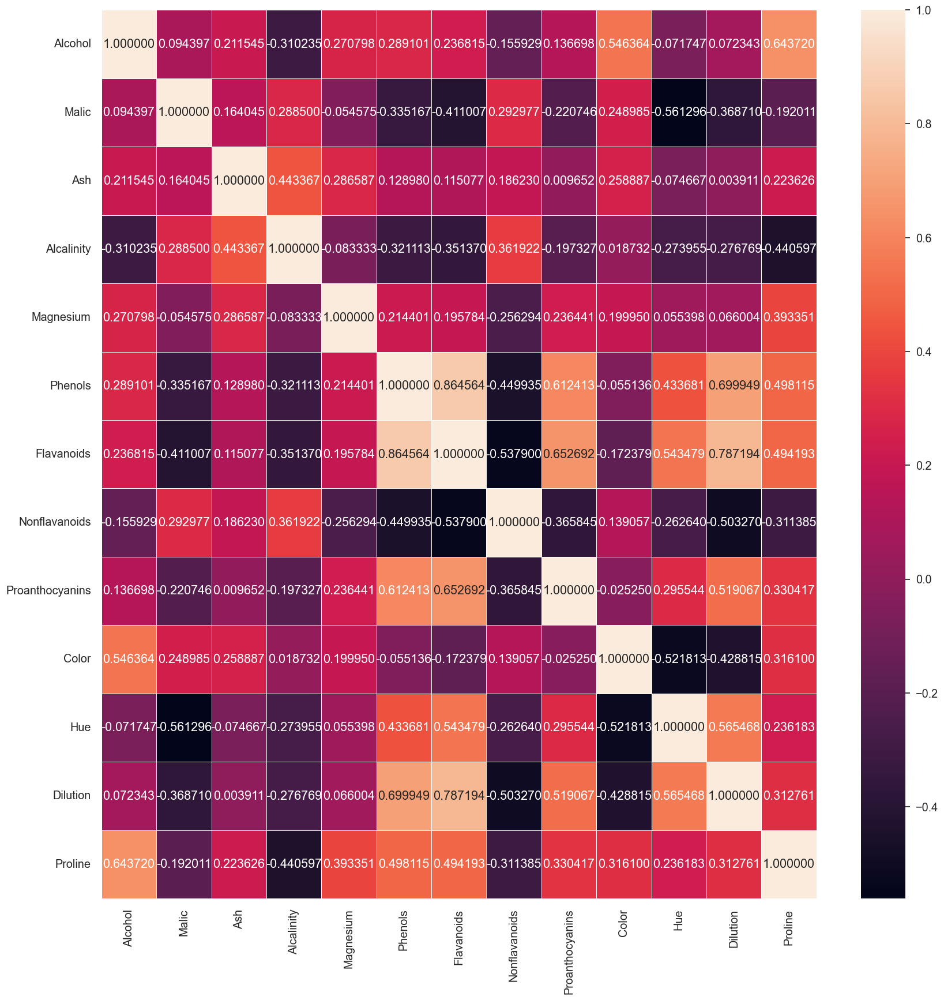

In [23]:
# Correlation heatmap
f, ax = plt.subplots(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, linewidths = .5, fmt = '01f', ax = ax)
plt.show()

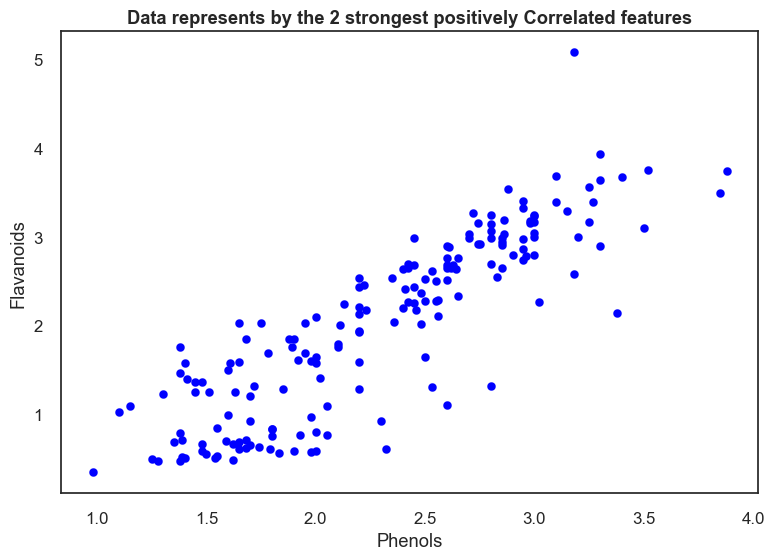

In [24]:
# Plotting frequent flying Phenols vs. Flavanoids
sns.set(style = 'white', rc = {'figure.figsize':(9,6)}, font_scale = 1.1)
plt.scatter(x = df['Phenols'], y = df['Flavanoids'], color = 'blue', lw = 0.1)
plt.xlabel('Phenols')
plt.ylabel('Flavanoids')
plt.title('Data represents by the 2 strongest positively Correlated features', fontweight = 'bold')
plt.show()

In [25]:
# Data Preprocessing
# Applying Standard Scaler on the Data
standard_scaler = StandardScaler()
std_df = standard_scaler.fit_transform(df)
std_df.shape

(178, 13)

In [26]:
# Applying MinMax Scaler on Dataset
# Using MinMax Scaler for accuracy result comparison
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()
minmax_df = minmax.fit_transform(df)
minmax_df.shape

(178, 13)

In [27]:
# PCA
pca_var = PCA()
pca_var.fit(std_df)

PCA()

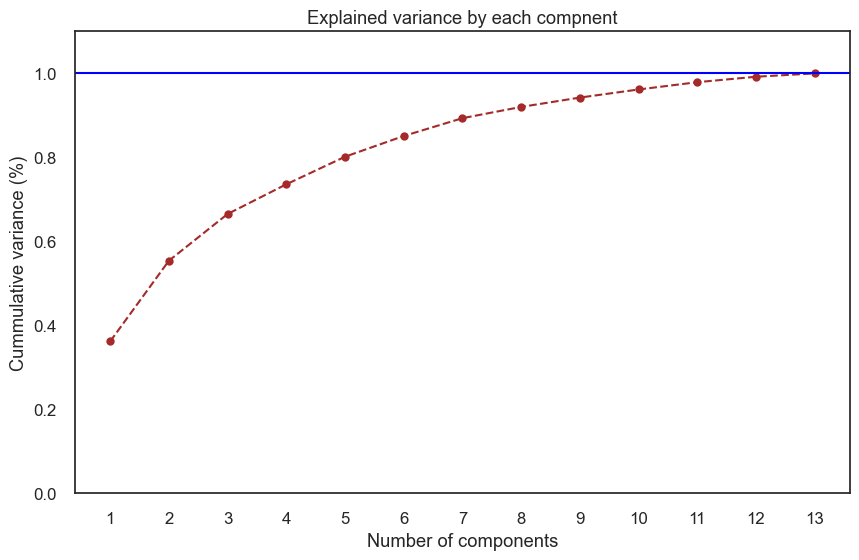

In [28]:
# Plot
plt.figure(figsize = (10,6))
xi = np.arange(1, 1+std_df.shape[1], step = 1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker = 'o', linestyle = '--', color = 'brown')

# Aesthetics
plt.ylim(0.0, 1.1)
plt.xlabel('Number of components')
plt.xticks(np.arange(1, 1+std_df.shape[1], step = 1))
plt.ylabel('Cummulative variance (%)')
plt.title('Explained variance by each compnent')
plt.axhline(y = 1, color = 'blue', linestyle = '-')
plt.gca().xaxis.grid(False)

In [29]:
# the amount of variance that each PCA explains is
var = pca_var.explained_variance_ratio_
var

array([0.36198848, 0.1920749 , 0.11123631, 0.0706903 , 0.06563294,
       0.04935823, 0.04238679, 0.02680749, 0.02222153, 0.01930019,
       0.01736836, 0.01298233, 0.00795215])

Text(0.5, 1.0, 'Explained variance by each component')

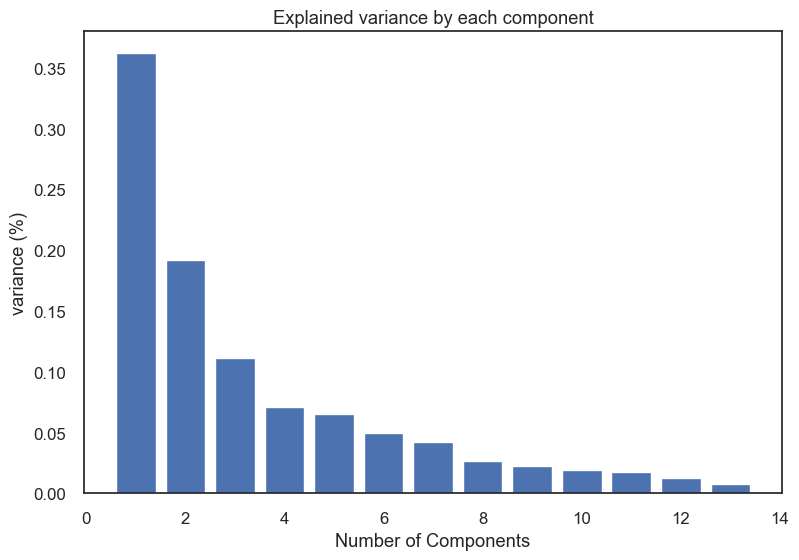

In [30]:
plt.bar(range(1, len(var)+1), var)
plt.xlabel('Number of Components')
plt.ylabel('variance (%)')
plt.title('Explained variance by each component')

In [31]:
# Cumulative Variance
var1 = np.cumsum(np.round(var,decimals = 4)*100)
var1

array([ 36.2 ,  55.41,  66.53,  73.6 ,  80.16,  85.1 ,  89.34,  92.02,
        94.24,  96.17,  97.91,  99.21, 100.01])

In [32]:
# PCA
pca = PCA(n_components = 3)
pca_std = pca.fit_transform(std_df)

# Convert to data frame
pca_std_df = pd.DataFrame(data = pca_std, columns = ['PC1','PC2','PC3'])

# Shape and preview
print(pca_std_df.shape)
pca_std_df.head()

(178, 3)


,PC1,PC2,PC3
0,3.316751,-1.443463,-0.165739
1,2.209465,0.333393,-2.026457
2,2.516740,-1.031151,0.982819
3,3.757066,-2.756372,-0.176192
4,1.008908,-0.869831,2.026688


Text(0, 0.5, 'PC2')

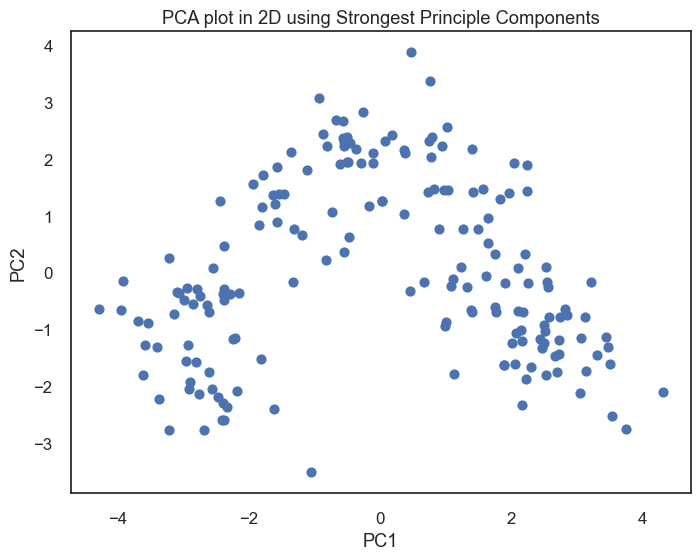

In [33]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(pca_std_df.iloc[:,0], pca_std_df.iloc[:,1], s = 40)

# Aesthetics
plt.title('PCA plot in 2D using Strongest Principle Components')
plt.xlabel('PC1')
plt.ylabel('PC2')

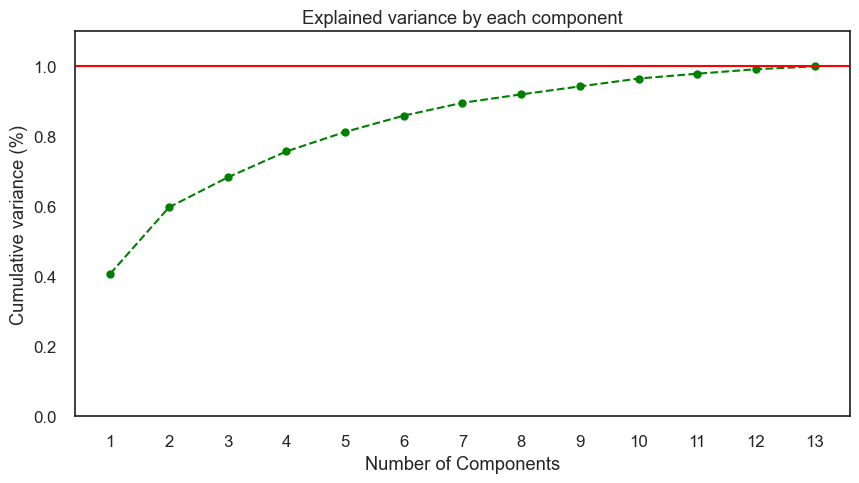

In [34]:
# PCA
pca_var = PCA()
pca_var.fit(minmax_df)

# Plot
plt.figure(figsize = (10,5))
xi = np.arange(1, 1+minmax_df.shape[1], step = 1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker = 'o', linestyle = '--', color = 'Green')

# Aesthetics
plt.ylim(0.0, 1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+minmax_df.shape[1], step = 1))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y = 1, color = 'Red', linestyle = '-')
plt.gca().xaxis.grid(False)

In [35]:
# The amount of variance that each PCA explains is
var = pca_var.explained_variance_ratio_
var

array([0.40749485, 0.18970352, 0.08561671, 0.07426678, 0.05565301,
       0.04658837, 0.03663929, 0.02408789, 0.02274371, 0.02250965,
       0.01381292, 0.01273236, 0.00815095])

Text(0.5, 1.0, 'Explained variance by each component')

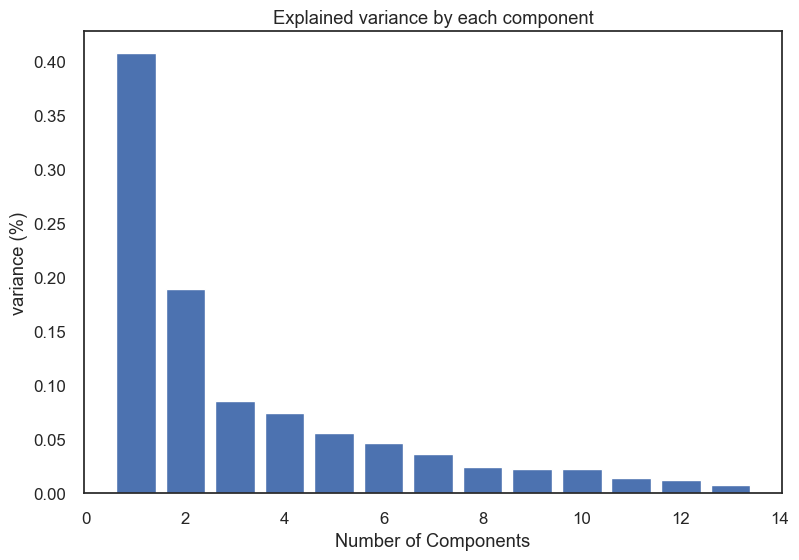

In [36]:
plt.bar(range(1, len(var)+1), var)
plt.xlabel('Number of Components')
plt.ylabel('variance (%)')
plt.title('Explained variance by each component')

In [37]:
# Cumulative Variance
var1 = np.cumsum(np.round(var, decimals = 4)*100)
var1

array([ 40.75,  59.72,  68.28,  75.71,  81.28,  85.94,  89.6 ,  92.01,
        94.28,  96.53,  97.91,  99.18, 100.  ])

In [38]:
# PCA
pca = PCA(n_components = 3)
pca_minmax = pca.fit_transform(minmax_df)

# Convert to data frame
pca_minmax_df = pd.DataFrame(data = pca_minmax, columns = ['PC1','PC2','PC3'])

# Shape and preview
print(pca_minmax_df.shape)
pca_minmax_df.head()

(178, 3)


,PC1,PC2,PC3
0,-0.706336,-0.253193,0.024093
1,-0.484977,-0.008823,-0.280482
2,-0.521172,-0.189187,0.196217
3,-0.821644,-0.580906,0.081110
4,-0.202546,-0.059467,0.300240


Text(0, 0.5, 'PC2')

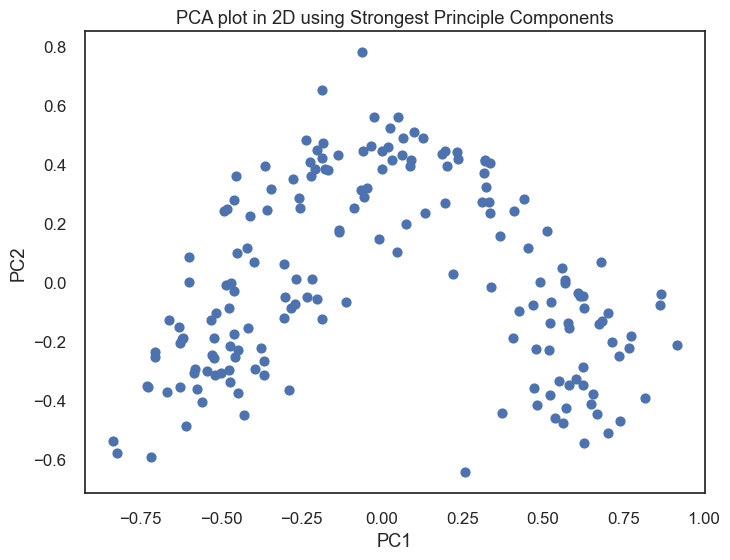

In [39]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], s = 40)

# Aesthetics
plt.title('PCA plot in 2D using Strongest Principle Components')
plt.xlabel('PC1')
plt.ylabel('PC2')

In [40]:
# Elbow Method for Determining Cluster Amount on PCA Standard Scaled Dataset
inertia = []
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 15, max_iter = 500, random_state = 17)
    kmeans.fit(pca_std_df)
    inertia.append(kmeans.inertia_)

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 12%|██████████▌                                                                         | 1/8 [00:15<01:46, 15.27s/it]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 25%|█████████████████████                                                               | 2/8 [00:16<00:43,  7.27s/it]C:\Users\mariyam qureshi\OneD

In [41]:
silhouette = {}
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 15, max_iter = 500, random_state = 17)
    kmeans.fit(pca_std_df)
    silhouette[i] = sil(pca_std_df, kmeans.labels_, metric = 'euclidean')

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 12%|██████████▌                                                                         | 1/8 [00:01<00:13,  1.89s/it]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 25%|█████████████████████                                                               | 2/8 [00:03<00:11,  1.84s/it]C:\Users\mariyam qureshi\OneD

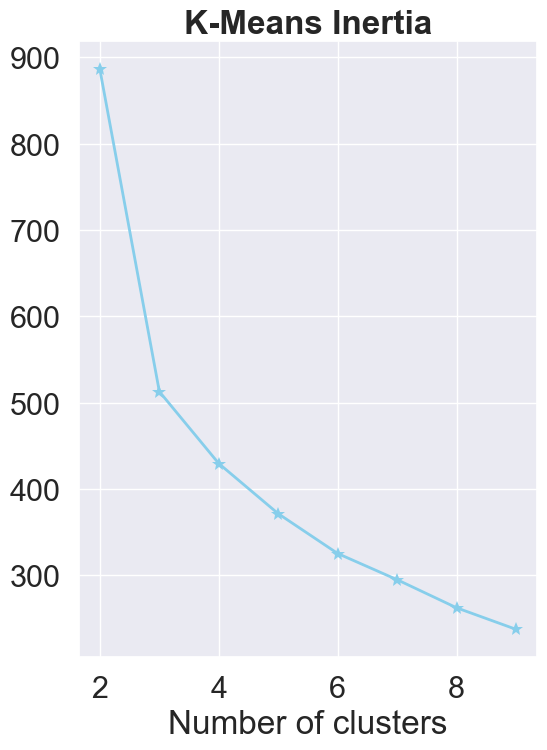

In [42]:
sns.set(style = "darkgrid", rc = {'figure.figsize':(13,8)}, font_scale = 2)
plt.subplot(1,2,1)
plt.plot(range(2, len(inertia)+2), inertia, marker = "*", lw = 2, color = "skyblue", ms = 10)
plt.xlabel("Number of clusters")
plt.title("K-Means Inertia", fontweight = 'bold')
plt.show()

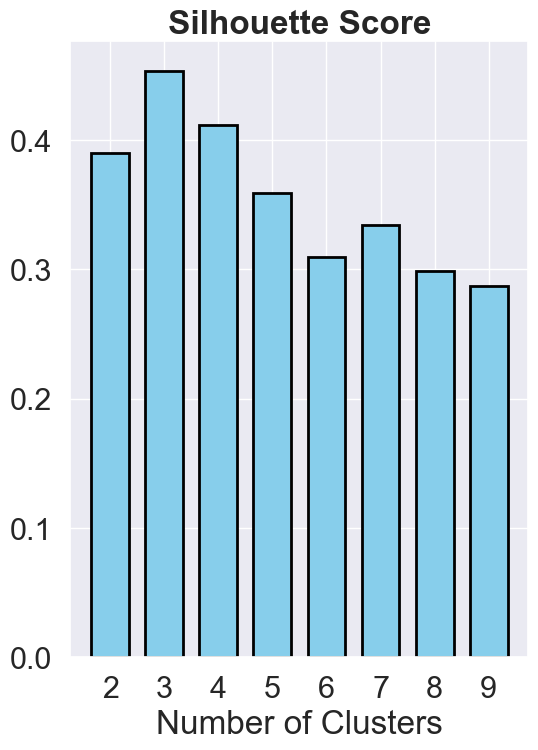

In [43]:
plt.subplot(1,2,2)
plt.bar(range(len(silhouette)), list(silhouette.values()), align = 'center', width = .7, edgecolor = "black", lw = 2, color = "skyblue")
plt.xticks(range(len(silhouette)), list(silhouette.keys()))
plt.xlabel("Number of Clusters")
plt.title("Silhouette Score", fontweight = 'bold')
plt.show()

In [44]:
from sklearn.metrics import silhouette_score
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
s_scores = [] # silhouette scores

for n in n_clusters:
    KM_est = KMeans(n_clusters = n, init = 'k-means++').fit(pca_std_df)
    clusters_inertia.append(KM_est.inertia_) # data for the elbow method
    silhouette_avg = silhouette_score(pca_std_df, KM_est.labels_)
    s_scores.append(silhouette_avg) # data for the silhouette score method

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

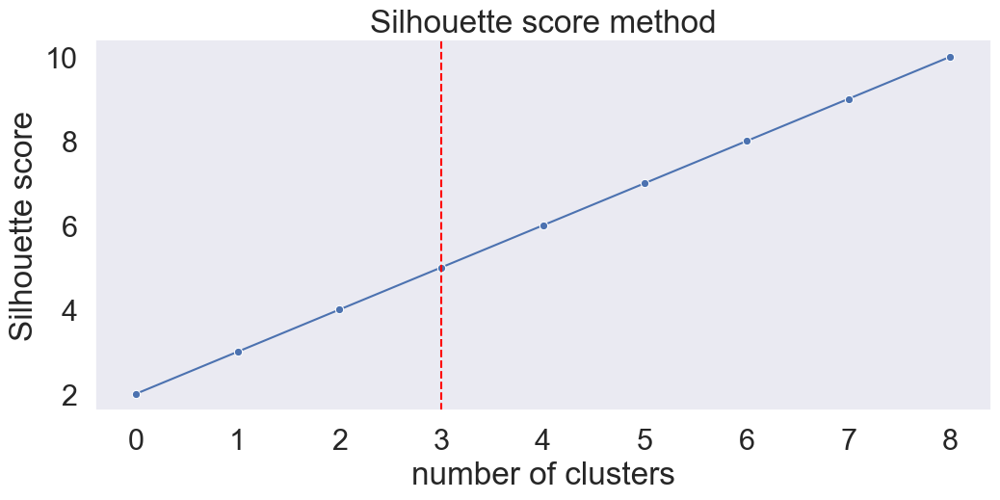

In [45]:
fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(n_clusters, marker = 'o', ax = ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls = "--", c = "red")
plt.grid()
plt.show()

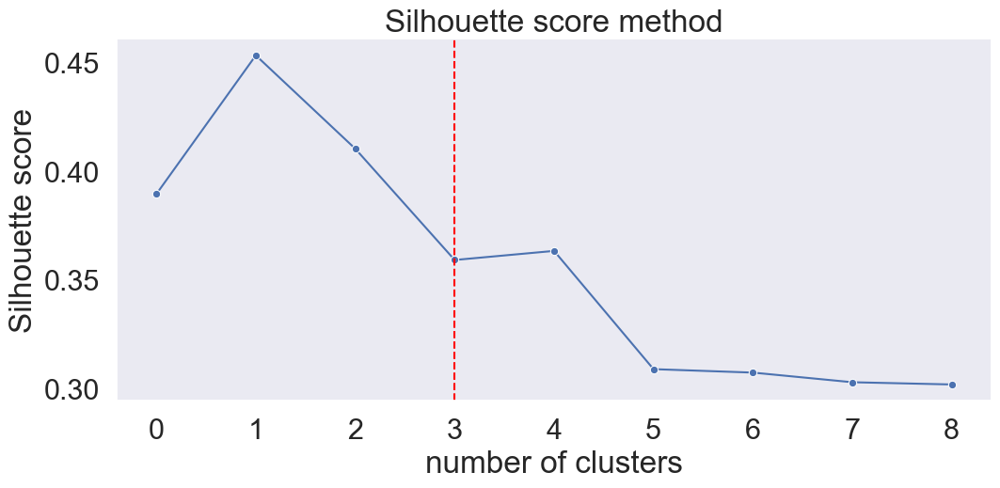

In [46]:
fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(s_scores, marker = 'o', ax = ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls = "--", c = "red")
plt.grid()
plt.show()

Elbow Plot for Standard Scaler data


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

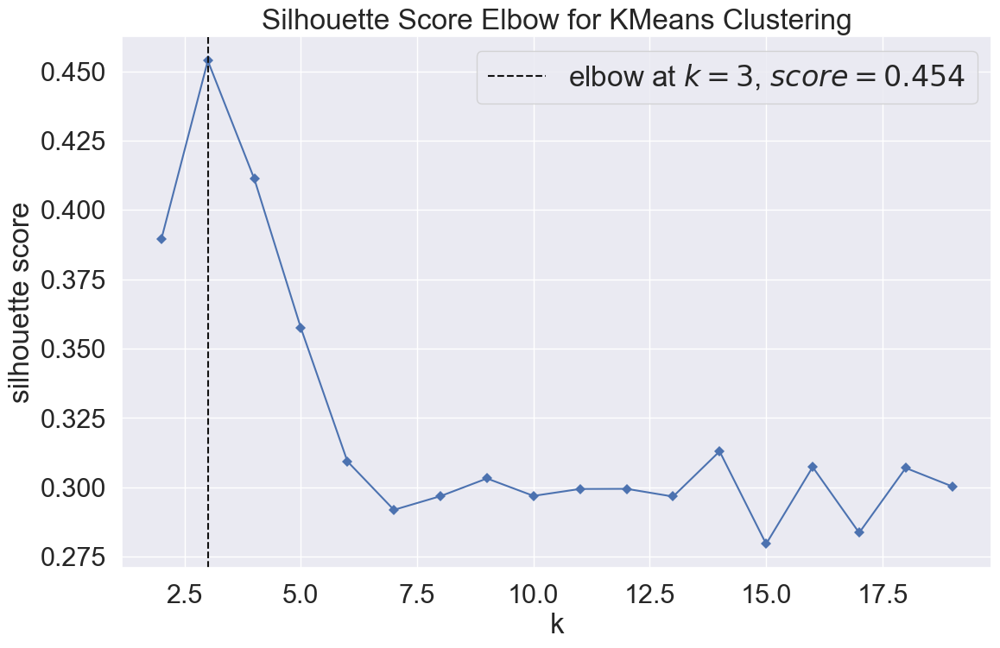

In [47]:
# Instantiate a scikit-learn K-Means model. we will check for two diff hyperparameters value effect.
model = KMeans(random_state = 10, max_iter = 500, init = 'k-means++')

# Instantiate the KElbowVisualizer with the number of clusters and the metric
visualizer = KElbowVisualizer(model, k = (2,20), metric = 'silhouette', timings = False)
# Fit the data and visualize
print('Elbow Plot for Standard Scaler data')
visualizer.fit(pca_std_df)    
visualizer.show()
plt.show()

In [48]:
# With the elbow method, the ideal number of clusters to use was 6.
# We will also use the Silhouette score to determine an optimal number.

clust_list = [2,3,4,5,6,7,8,9]

#  Silhouette score for stadardScaler applied on data.

for n_clusters in clust_list:
    clusterer1 = KMeans(n_clusters = n_clusters, random_state = 0)
    cluster_labels1 = clusterer1.fit_predict(pca_std_df)
    sil_score1 = sil(pca_std_df, cluster_labels1)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", sil_score1)

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.38938813089003294


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.4537999848257617


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.4113050656681102


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.37881272120277343


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.30793358557030553


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.30802581590159767


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.29629373216471544


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.3006514085498634


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.38938813089003294


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.4537999848257617


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.4113050656681102


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.37881272120277343


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.30793358557030553


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.30802581590159767


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.29629373216471544


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.3006514085498634


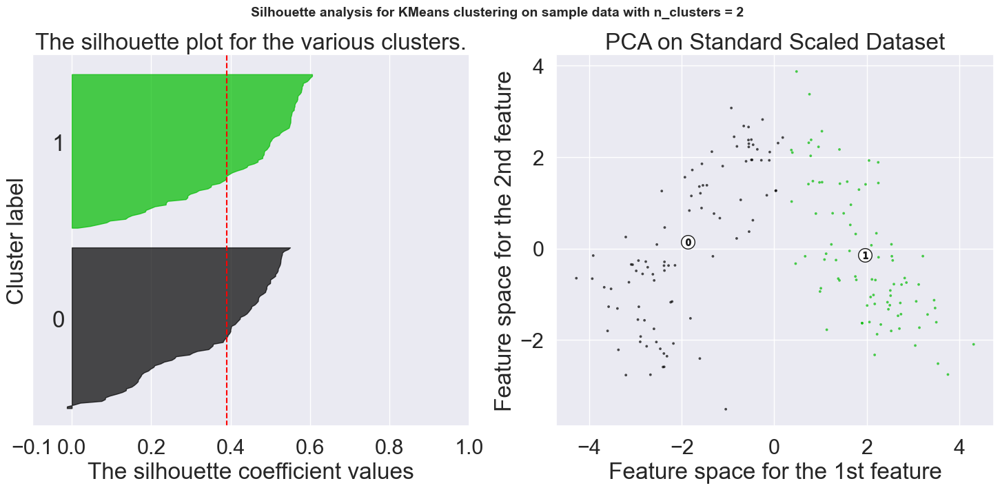

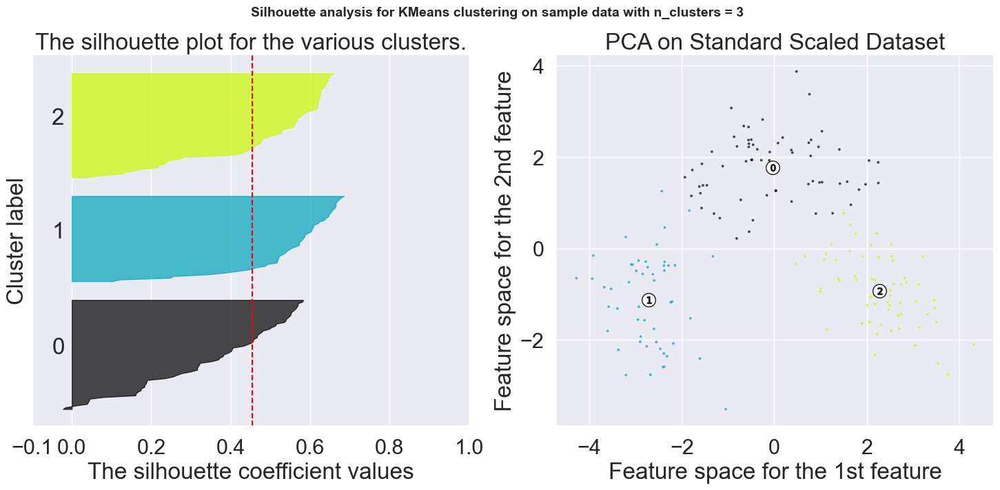

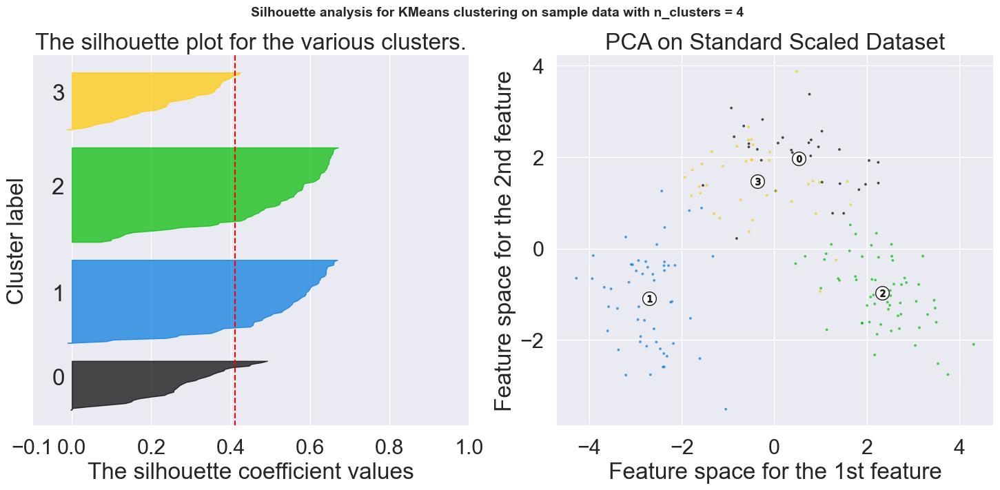

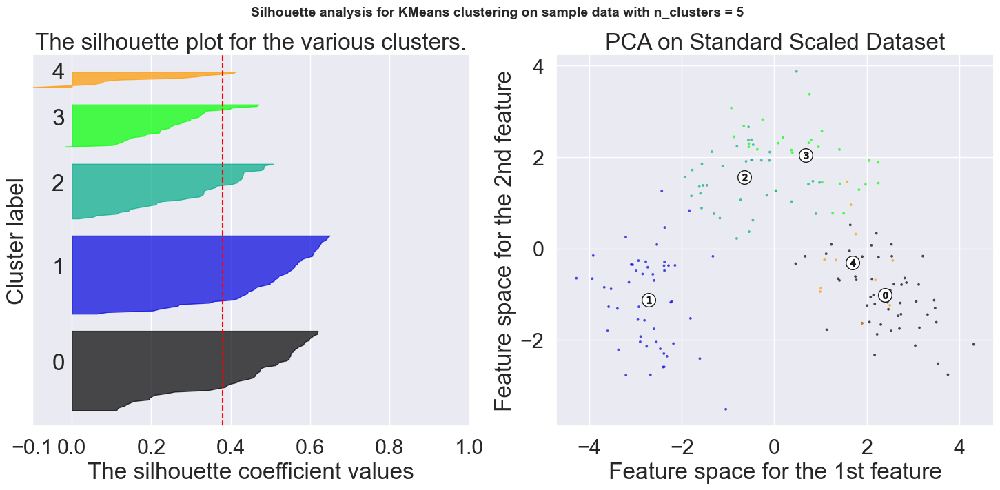

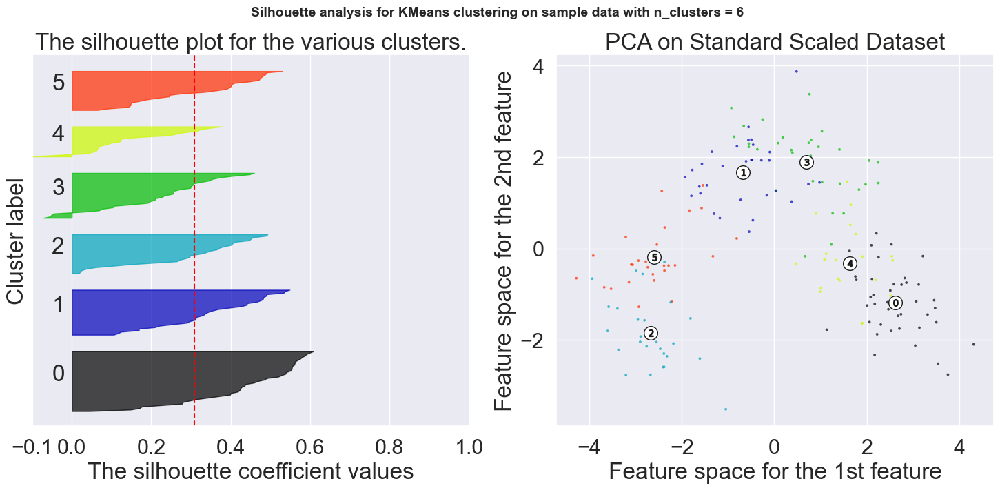

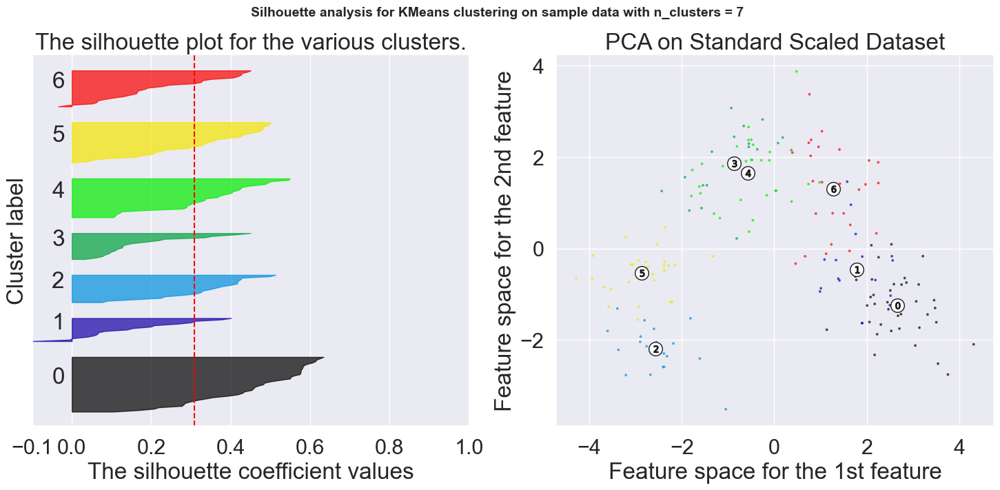

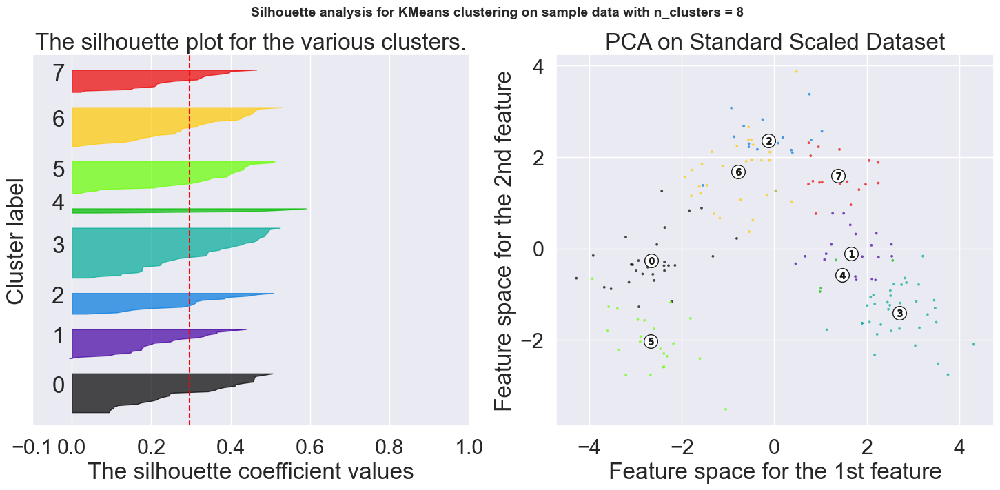

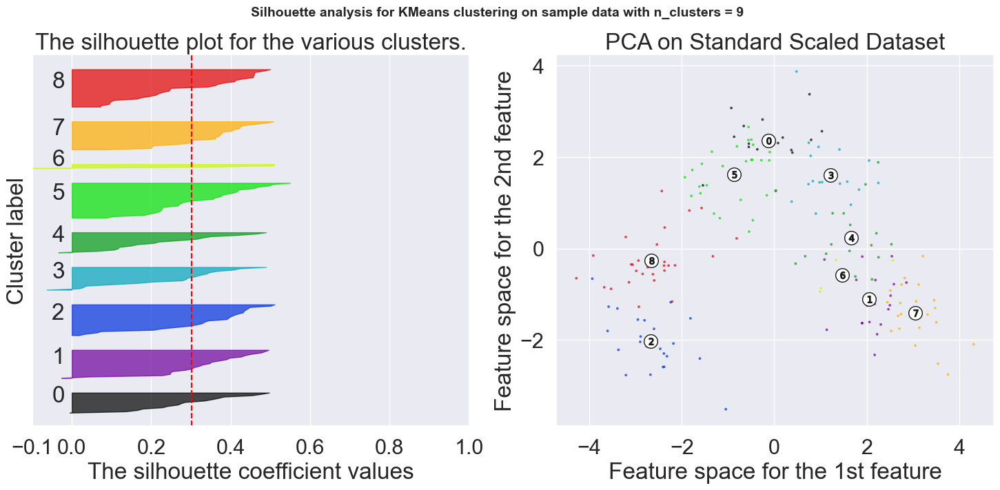

In [49]:
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_std_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters = n_clusters, random_state = 0)
    cluster_labels = clusterer.fit_predict(pca_std_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = sil(pca_std_df, cluster_labels)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_std_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor = color, edgecolor = color, alpha = 0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = silhouette_avg, color = "red", linestyle = "--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_std_df.iloc[:,0], pca_std_df.iloc[:, 1], marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:,0], centers[:,1], marker='o', c = "white", alpha = 1, s = 200, edgecolor = 'k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')
        ax2.set_title("PCA on Standard Scaled Dataset")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters), fontsize = 14, fontweight = 'bold')

plt.show()

In [50]:
# we have found good number of cluster = 3
# model building using cluster numbers = 3

model_kmeans = KMeans(n_clusters = 3, random_state = 0, init = 'k-means++')
y_predict_kmeans = model_kmeans.fit_predict(pca_std_df)
y_predict_kmeans.shape

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(178,)

In [51]:
# these are nothing but cluster labels...

y_predict_kmeans

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [52]:
model_kmeans.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [53]:
# cluster centres associated with each lables

model_kmeans.cluster_centers_

array([[-3.69566084e-02,  1.77223945e+00,  1.86138728e-01],
       [-2.72003575e+00, -1.12565126e+00, -2.39093241e-01],
       [ 2.27619360e+00, -9.32054027e-01,  1.52803156e-03]])

In [54]:
# within-cluster sum of squared
# The lower values of inertia are better and zero is optimal.
# Inertia is the sum of squared error for each cluster. 
# Therefore the smaller the inertia the denser the cluster(closer together all the points are)

model_kmeans.inertia_

513.0564645910769

In [55]:
#Assign clusters to the data set
data['Kmeans_label'] = model_kmeans.labels_

In [56]:
# Group data by Clusters (K=6)
data.groupby('Kmeans_label').agg(['mean'])

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Kmeans_label,,,,,,,,,,,,,,,
0,2.000000,12.250923,1.897385,2.231231,20.063077,92.738462,2.247692,2.050000,0.357692,1.624154,2.973077,1.062708,2.803385,510.169231,95.200000
1,2.941176,13.134118,3.307255,2.417647,21.241176,98.666667,1.683922,0.818824,0.451961,1.145882,7.234706,0.691961,1.696667,619.058824,150.607843
2,1.048387,13.676774,1.997903,2.466290,17.462903,107.967742,2.847581,3.003226,0.292097,1.922097,5.453548,1.065484,3.163387,1100.225806,33.258065


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


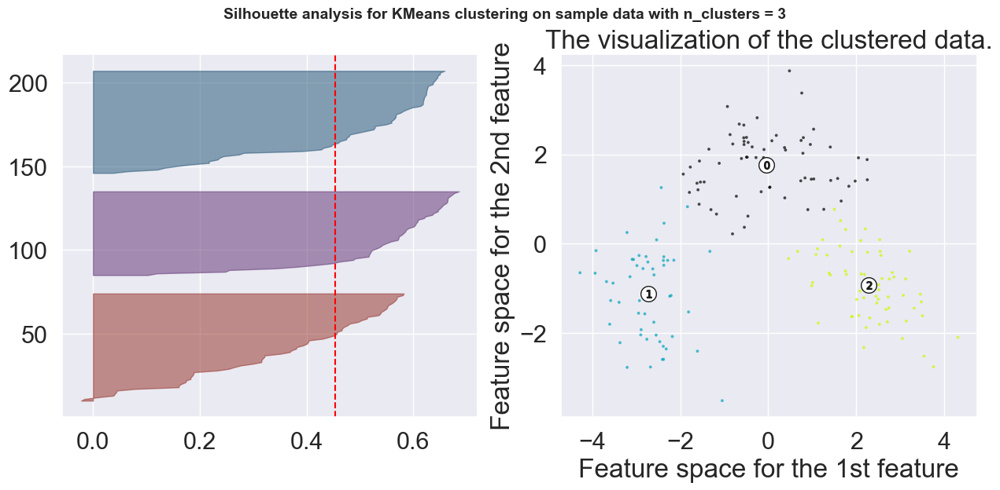

In [57]:
from yellowbrick.cluster import SilhouetteVisualizer
fig,(ax1,ax2) = plt.subplots(1,2,sharey = False)
fig.set_size_inches(15,6)

sil_visualizer1 = SilhouetteVisualizer(model_kmeans, ax = ax1, colors = ['#922B21','#5B2C6F','#1B4F72'])
sil_visualizer1.fit(pca_std_df)

# 2nd Plot showing the actual clusters formed

import matplotlib.cm as cm
colors1 = cm.nipy_spectral(model_kmeans.labels_.astype(float) / 3) # 3 is number of clusters
ax2.scatter(pca_std_df.iloc[:, 0], pca_std_df.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7, c = colors1, edgecolor = 'k')

# Labeling the clusters
centers1 = model_kmeans.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers1[:, 0], centers1[:, 1], marker = 'o',c = "white", alpha = 1, s = 200, edgecolor = 'k')

for i, c in enumerate(centers1):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')
    ax2.set_title(label ="The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % 3),fontsize = 14, fontweight = 'bold')

#sil_visualizer1.show()
plt.show()

In [58]:
inertia = []
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 15, max_iter = 500, random_state = 17)
    kmeans.fit(pca_minmax_df)
    inertia.append(kmeans.inertia_)

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 12%|██████████▌                                                                         | 1/8 [00:01<00:12,  1.72s/it]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 25%|█████████████████████                                                               | 2/8 [00:03<00:10,  1.72s/it]C:\Users\mariyam qureshi\OneD

In [59]:
silhouette = {}
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 15, max_iter = 500, random_state = 17)
    kmeans.fit(pca_minmax_df)
    silhouette[i] = sil(pca_minmax_df, kmeans.labels_, metric = 'euclidean')

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 12%|██████████▌                                                                         | 1/8 [00:01<00:12,  1.78s/it]C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
 25%|█████████████████████                                                               | 2/8 [00:03<00:10,  1.76s/it]C:\Users\mariyam qureshi\OneD

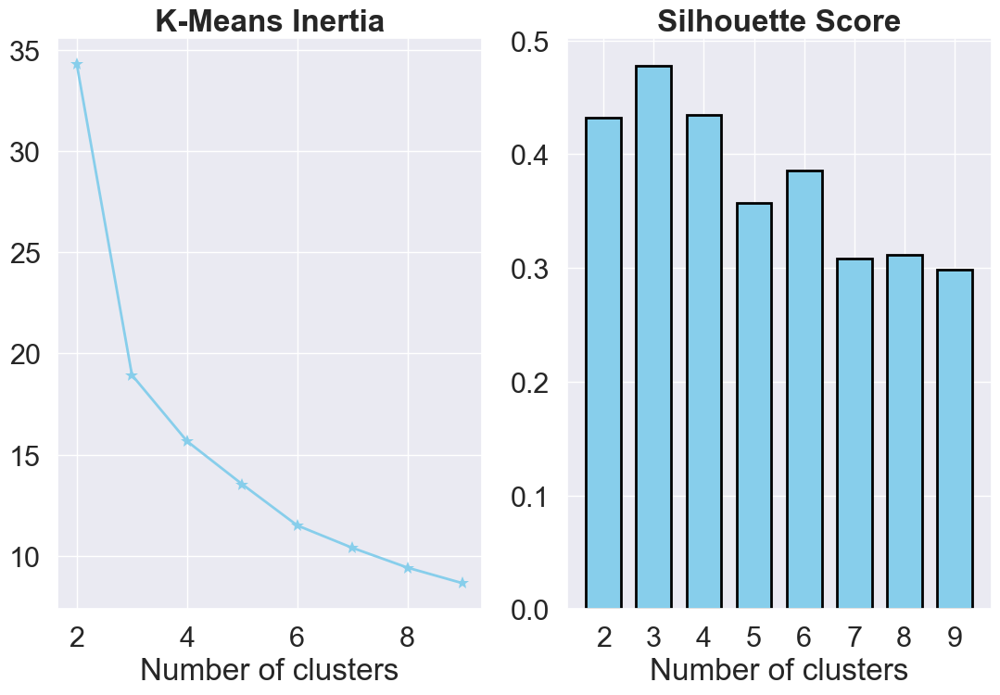

In [60]:
sns.set(style = "darkgrid", rc = {'figure.figsize':(13,8)}, font_scale = 2)

plt.subplot(1,2,1)
plt.plot(range(2,len(inertia)+2), inertia, marker = "*", lw = 2, color = "skyblue", ms = 10)
plt.xlabel("Number of clusters")
plt.title("K-Means Inertia", fontweight = 'bold')

plt.subplot(1,2,2)
plt.bar(range(len(silhouette)), list(silhouette.values()), align = 'center', width = .7, edgecolor = "black", lw = 2, color = "skyblue" )
plt.xticks(range(len(silhouette)), list(silhouette.keys()))
plt.xlabel("Number of clusters")
plt.title("Silhouette Score", fontweight = 'bold')
plt.show()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

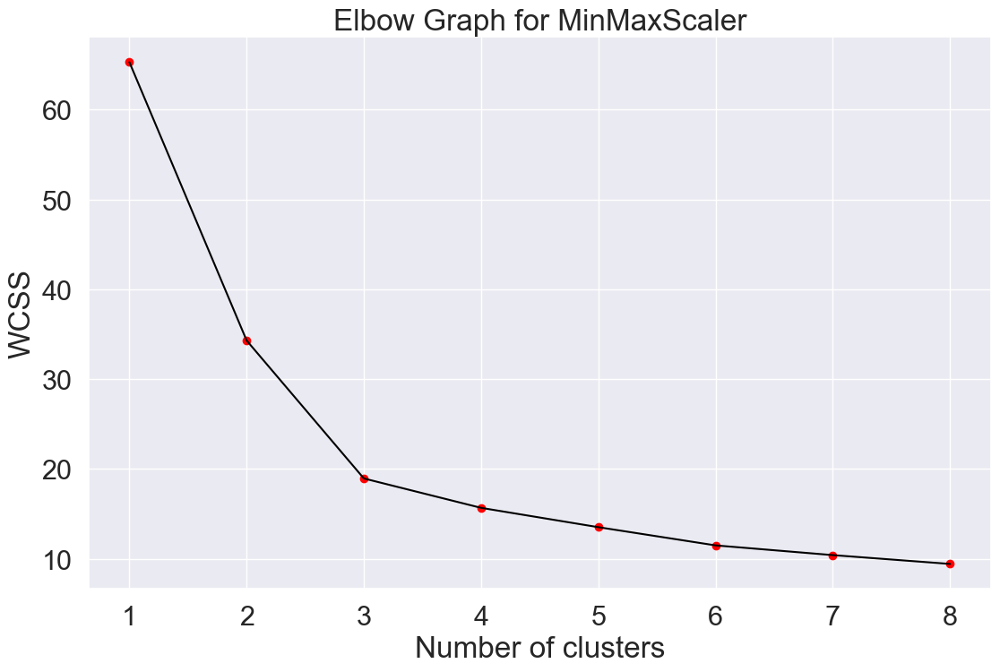

In [61]:
wcss = []
for i in range (1,9):
    kmeans = KMeans(n_clusters = i, random_state = 2)
    kmeans.fit(pca_minmax_df)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
plt.plot(range(1,9),wcss,color = 'black')
plt.scatter(range(1,9),wcss,color = 'red')
plt.title('Elbow Graph for MinMaxScaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

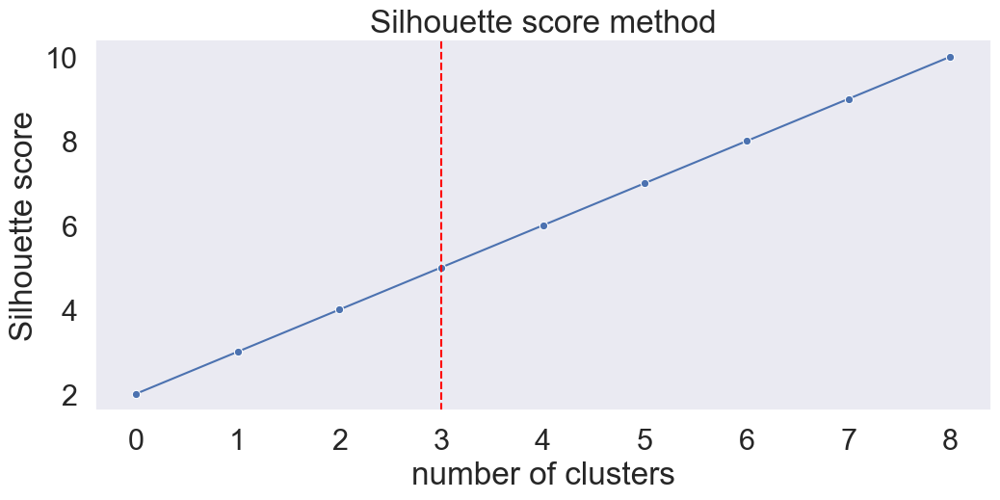

In [62]:
from sklearn.metrics import silhouette_score
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
s_scores = [] # silhouette scores

for n in n_clusters:
    KM_est = KMeans(n_clusters = n, init = 'k-means++').fit(pca_minmax_df)
    clusters_inertia.append(KM_est.inertia_)    # data for the elbow method
    silhouette_avg = silhouette_score(pca_minmax_df, KM_est.labels_)
    s_scores.append(silhouette_avg) # data for the silhouette score method

fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(n_clusters, marker = 'o', ax = ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls = "--", c = "red")
plt.grid()
plt.show()

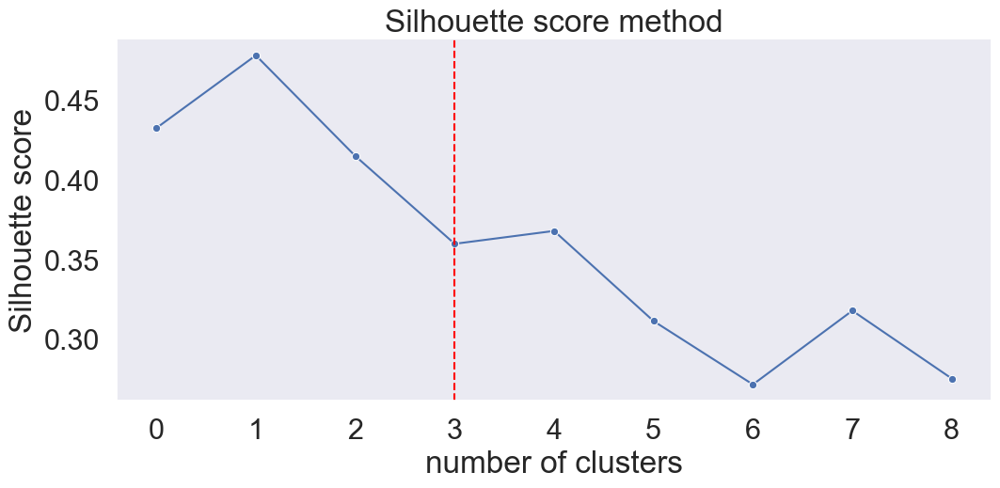

In [63]:
fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(s_scores, marker = 'o', ax = ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls = "--", c = "red")
plt.grid()
plt.show()

Elbow Plot for MinMaxScaler data


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarnin

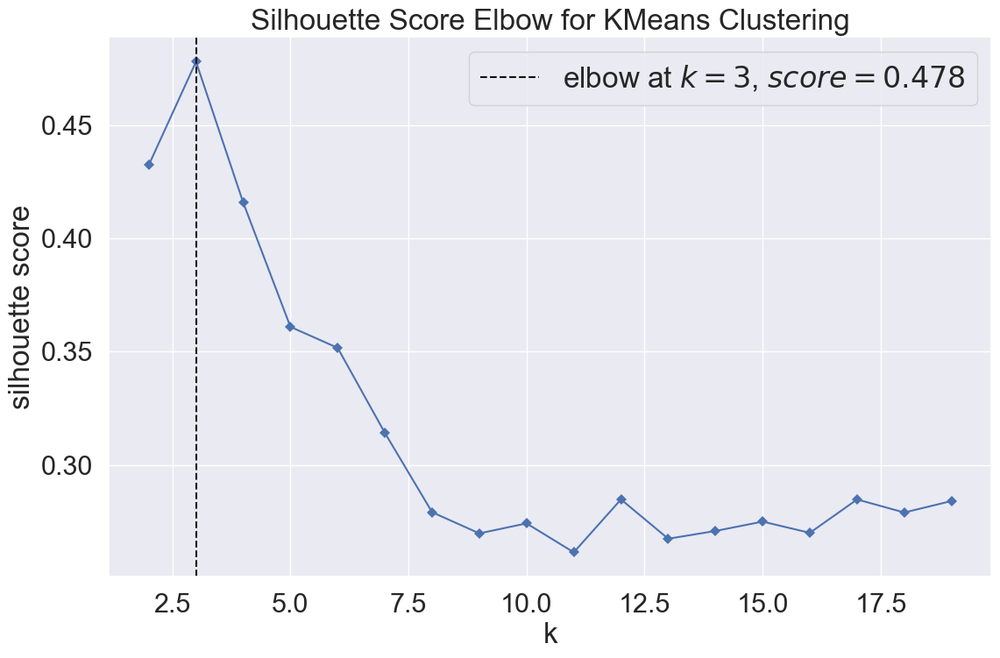

In [64]:
# Instantiate a scikit-learn K-Means model. we will check for two diff hyperparameters value effect.
model = KMeans(random_state = 10, max_iter = 500, init = 'k-means++')

# Instantiate the KElbowVisualizer with the number of clusters and the metric
visualizer = KElbowVisualizer(model, k = (2,20), metric = 'silhouette', timings = False)
# Fit the data and visualize
print('Elbow Plot for MinMaxScaler data')
visualizer.fit(pca_minmax_df)    
visualizer.show()
plt.show()

In [65]:
#any With the elbow method, the ideal number of clusters to use was 6.
# We will also use the Silhouette score to determine an optimal number.

clust_list = [2,3,4,5,6,7,8,9]

#  Silhouette score for MinMaxScaler Applied on data .

for n_clusters in clust_list:
    clusterer1 = KMeans(n_clusters = n_clusters, random_state = 0)
    cluster_labels1 = clusterer1.fit_predict(pca_minmax_df)
    sil_score1 = sil(pca_minmax_df, cluster_labels1)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", sil_score1)

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.43235189362905235


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.47796626568347655


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.4260084778800526


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.39888218931478314


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.3839012953547209


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.31579634363930376


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.3036056979192335


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.2708149565511004


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.43235189362905235


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.47796626568347655


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.41575332025151435


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.36092693521020547


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.35166921640378057


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.3141318477838442


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.2791346975772908


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.26979673003272153


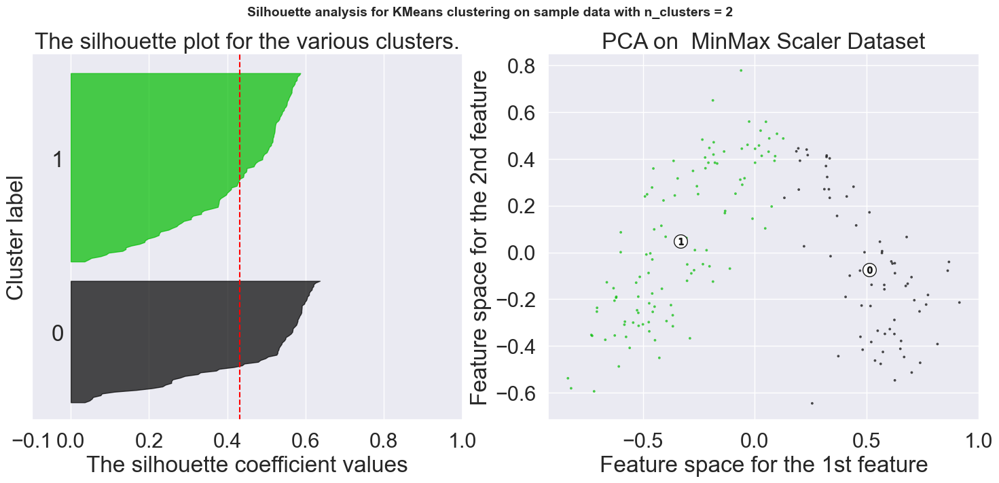

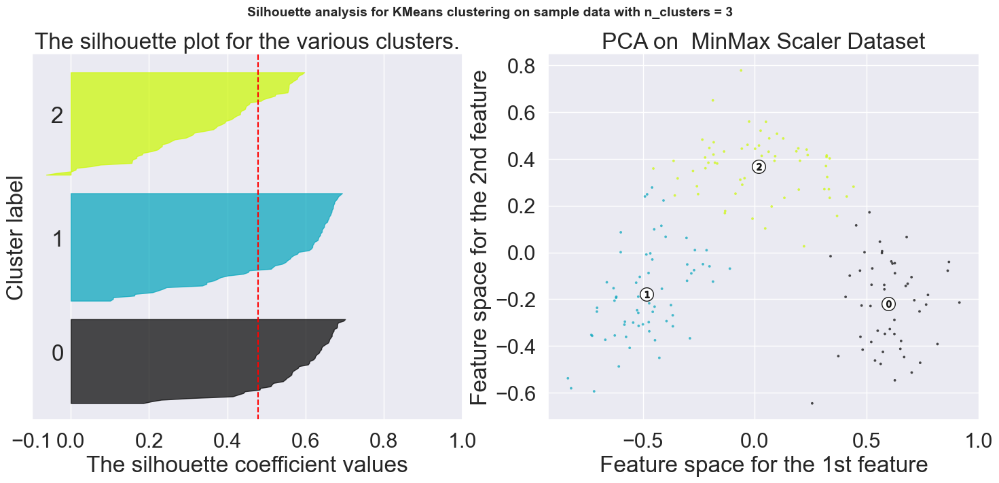

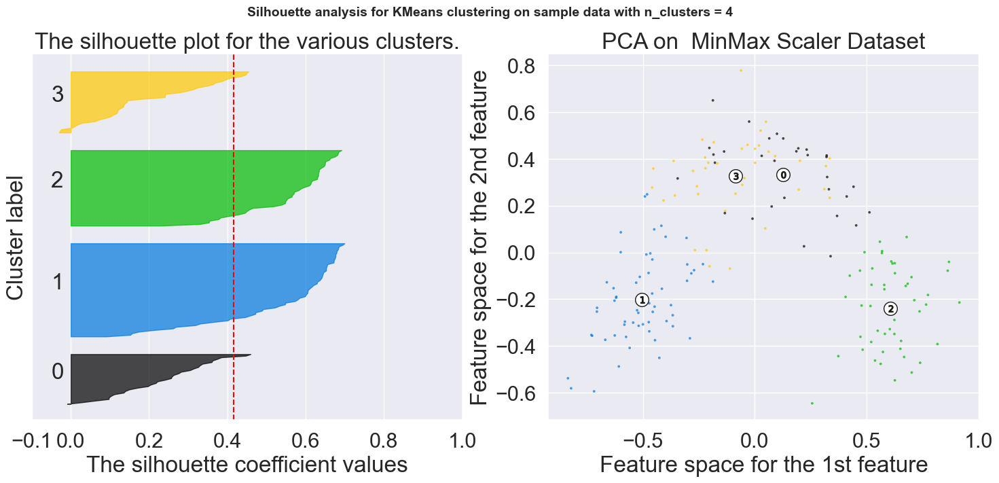

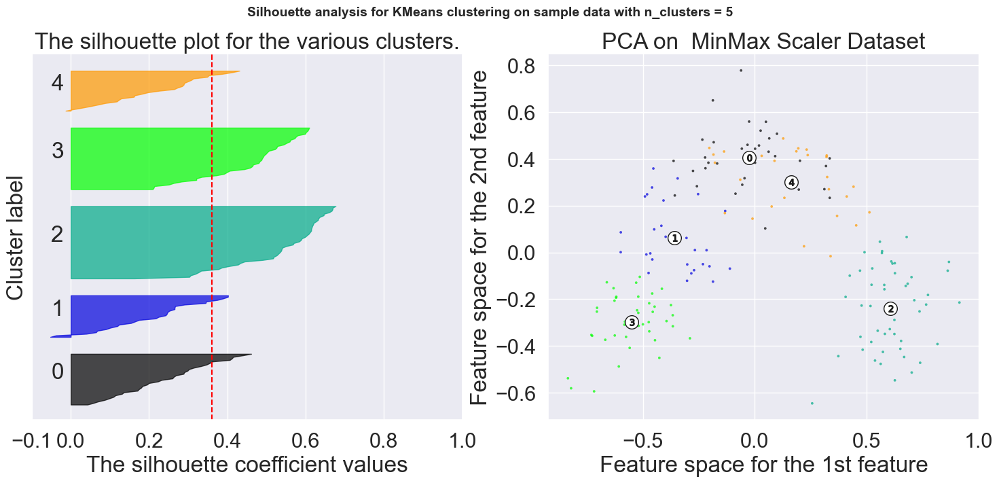

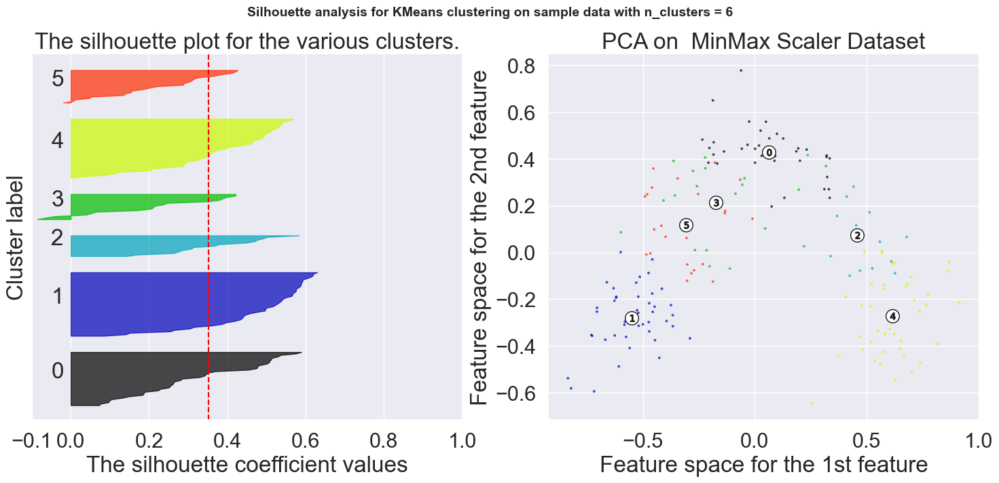

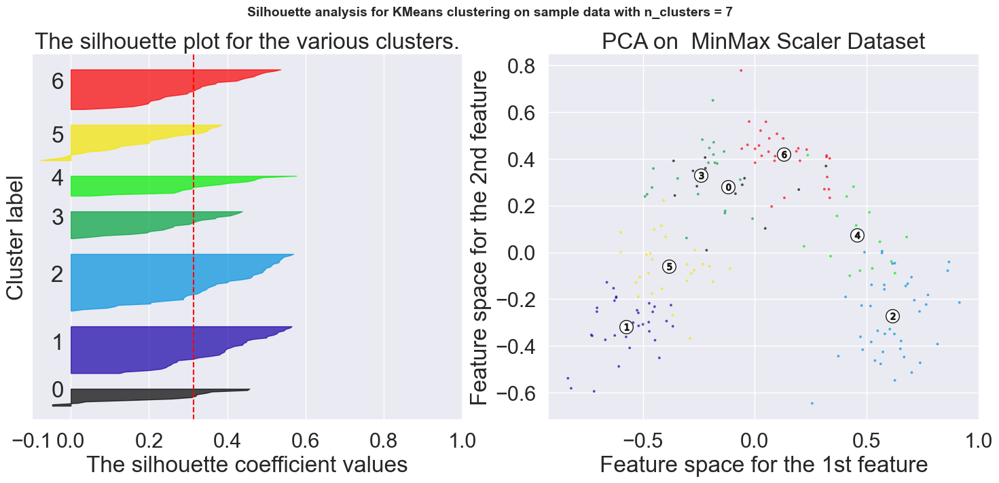

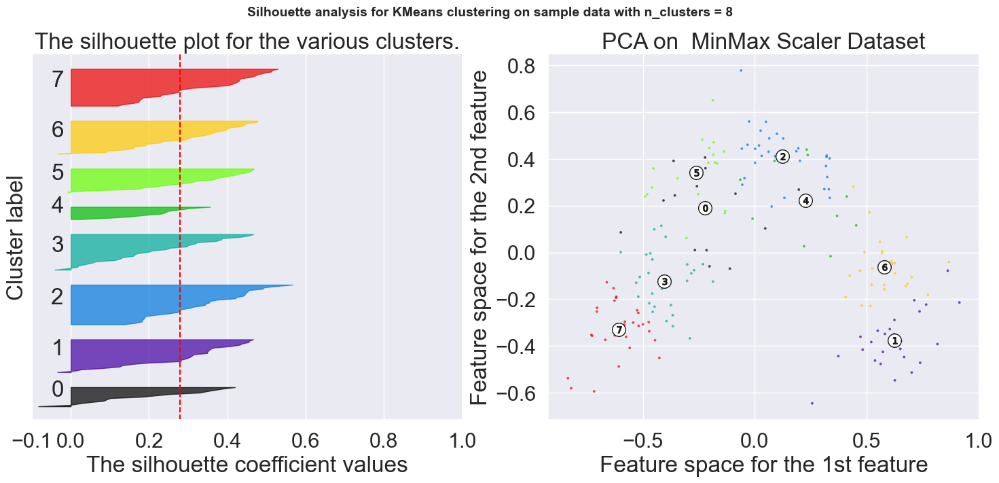

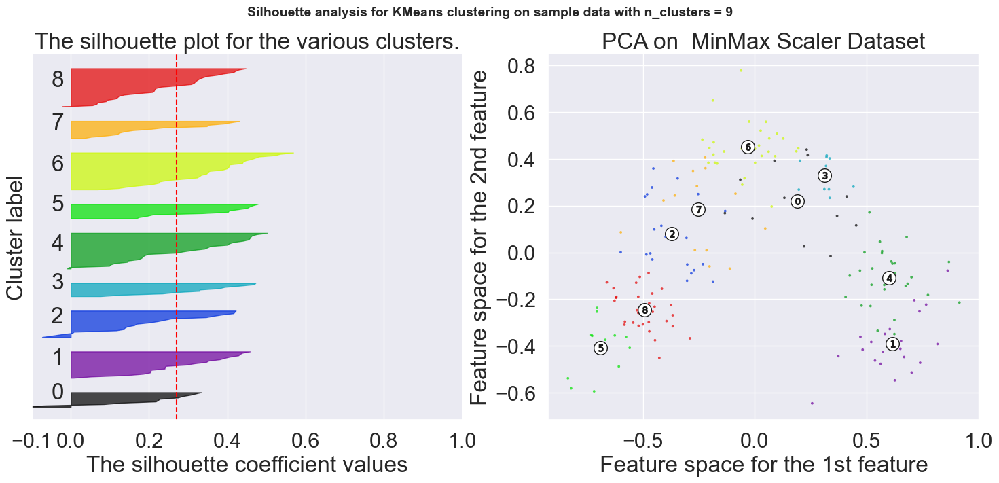

In [66]:
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_minmax_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(pca_minmax_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = sil(pca_minmax_df, cluster_labels)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_minmax_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor = color, edgecolor = color, alpha = 0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = silhouette_avg, color = "red", linestyle = "--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:,0], centers[:,1], marker = 'o', c = "white", alpha = 1, s = 200, edgecolor = 'k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')
        ax2.set_title("PCA on  MinMax Scaler Dataset")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters), fontsize = 14, fontweight = 'bold')

plt.show()

In [67]:
# we have found good number of cluster = 3
# model building using cluster numbers = 3

model_kmeans = KMeans(n_clusters = 3, random_state = 0, init = 'k-means++')
y_predict_kmeans = model_kmeans.fit_predict(pca_minmax_df)
y_predict_kmeans.shape

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


(178,)

In [68]:
# these are nothing but cluster labels...
y_predict_kmeans

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [69]:
model_kmeans.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [70]:
# cluster centres associated with each lables
model_kmeans.cluster_centers_

array([[ 0.59750634, -0.21895939, -0.01057291],
       [-0.48503975, -0.17742871, -0.0046045 ],
       [ 0.01701227,  0.36612572,  0.01352436]])

In [71]:
model_kmeans.inertia_

18.938260830466433

In [72]:
#Assign clusters to the data set

df['Kmeans_label'] = model_kmeans.labels_

In [73]:
# Group data by Clusters (K=3)
df.groupby('Kmeans_label').agg(['mean'])

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Kmeans_label,,,,,,,,,,,,,
0,13.134118,3.307255,2.417647,21.241176,98.666667,1.683922,0.818824,0.451961,1.145882,7.234706,0.691961,1.696667,619.058824
1,13.656923,1.946154,2.437692,17.441538,106.584615,2.864615,2.970000,0.284308,1.923846,5.361692,1.071385,3.148923,1080.107692
2,12.202742,1.946774,2.249839,20.211290,93.451613,2.200806,2.038710,0.369032,1.607903,2.949355,1.056387,2.801129,502.709677


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


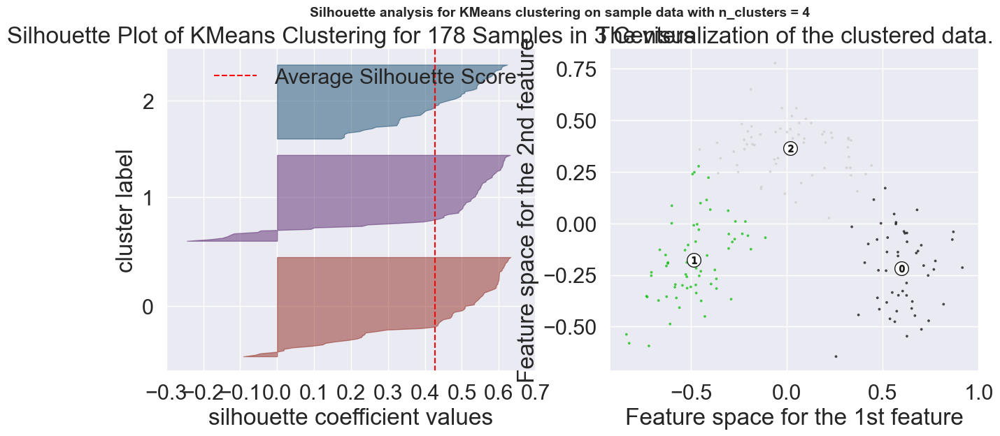

In [74]:
from yellowbrick.cluster import SilhouetteVisualizer

fig,(ax1,ax2) = plt.subplots(1,2,sharey = False)
fig.set_size_inches(15,6)

sil_visualizer1 = SilhouetteVisualizer(model_kmeans,ax = ax1, colors = ['#922B21','#5B2C6F','#1B4F72'])
sil_visualizer1.fit(pca_std_df)

# 2nd Plot showing the actual clusters formed

import matplotlib.cm as cm
colors1 = cm.nipy_spectral(model_kmeans.labels_.astype(float) / 2) # 3 is number of clusters
ax2.scatter(pca_minmax_df.iloc[:, 0], pca_minmax_df.iloc[:, 1], marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors1, edgecolor = 'k')

# Labeling the clusters
centers1 = model_kmeans.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers1[:, 0], centers1[:, 1], marker = 'o',c = "white", alpha = 1, s = 200, edgecolor = 'k')

for i, c in enumerate(centers1):
    ax2.scatter(c[0], c[1], marker = '$%d$' % i, alpha = 1,s = 50, edgecolor = 'k')
    ax2.set_title(label ="The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % 4),fontsize = 14, fontweight = 'bold')

sil_visualizer1.show()
plt.show()

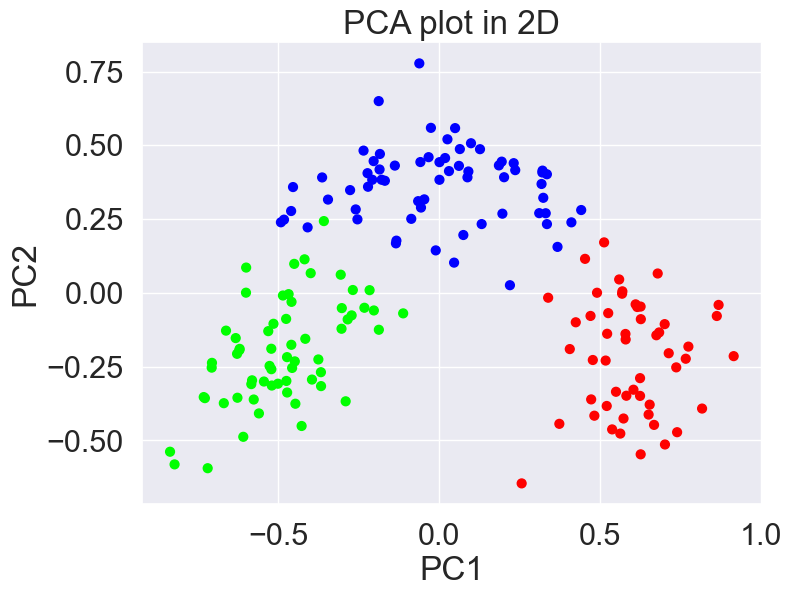

In [75]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = data['Kmeans_label'], cmap = "brg", s = 40)

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.p

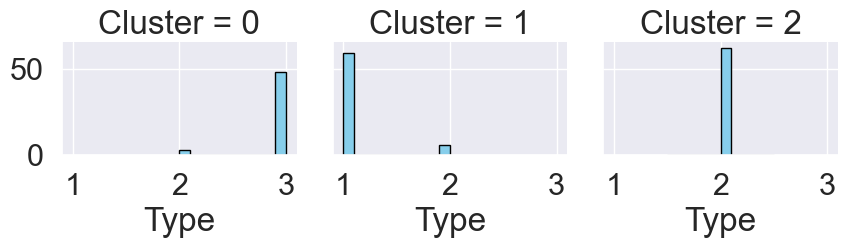

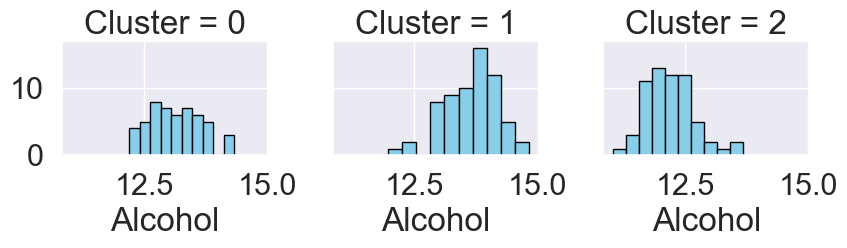

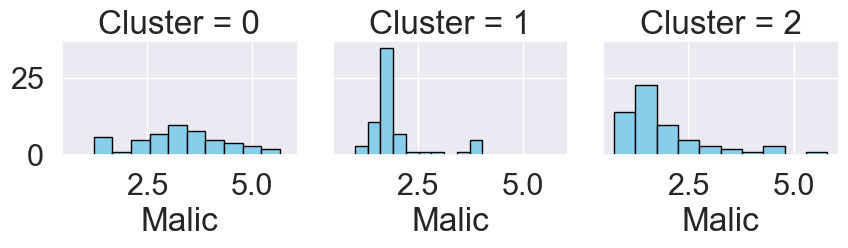

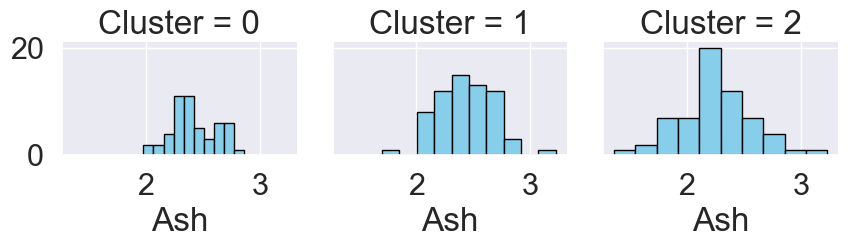

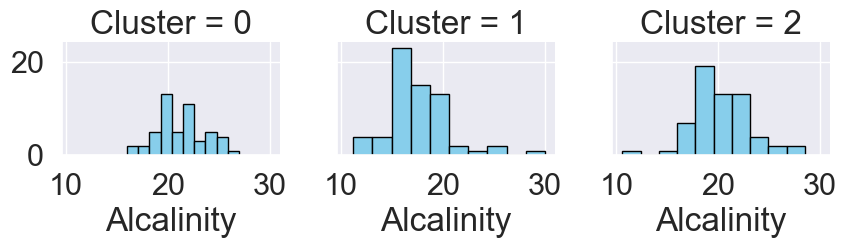

...

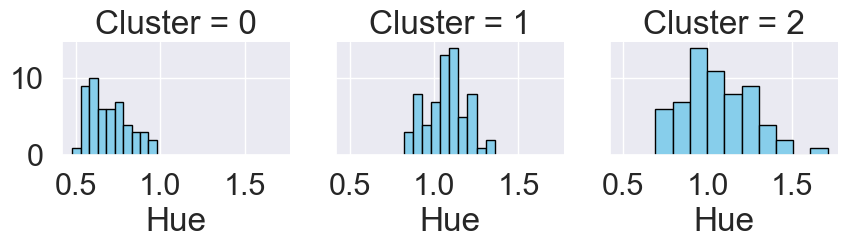

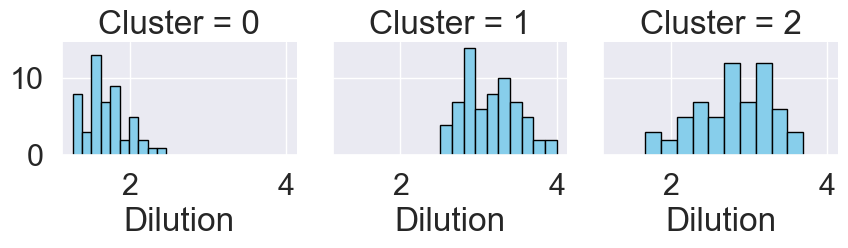

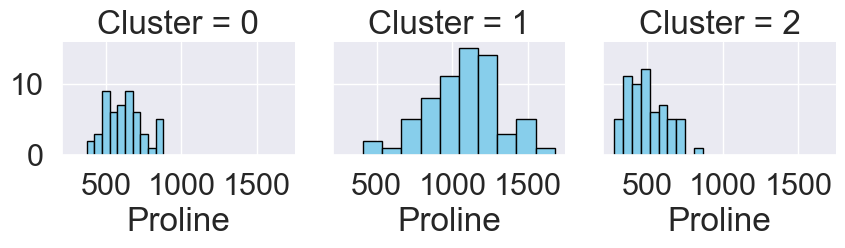

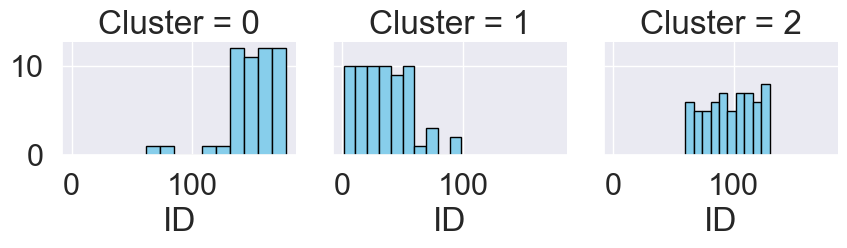

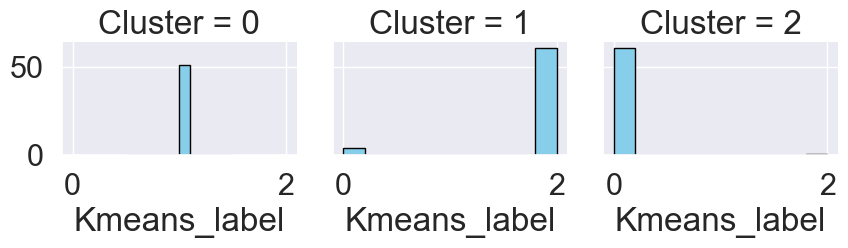

In [76]:
df1 = data.copy()
df1['Cluster'] = model_kmeans.labels_

aux = df1.columns.tolist()
aux[0:len(aux)-1]

sns.set(style = "darkgrid", rc = {'figure.figsize':(13,8)}, font_scale = 2)

for cluster in aux[0:len(aux)-1]:
    grid = sns.FacetGrid(df1, col = "Cluster")
    grid.map(plt.hist, cluster, color = "skyblue", lw = 1, edgecolor = "black")

In [77]:
# Sorting elements based on cluster label assigned and taking average for insights.

cluster1 = pd.DataFrame(df1.loc[df1.Cluster == 0].mean(),columns = ['Cluster1_avg'])
cluster2 = pd.DataFrame(df1.loc[df1.Cluster == 1].mean(),columns = ['Cluster2_avg'])
cluster3 = pd.DataFrame(df1.loc[df1.Cluster == 2].mean(),columns = ['Cluster2_avg'])

In [78]:
avg_df = pd.concat([cluster1,cluster2,cluster3],axis=1)
avg_df

,Cluster1_avg,Cluster2_avg,Cluster2_avg
Type,2.941176,1.092308,2.000000
Alcohol,13.134118,13.656923,12.202742
Malic,3.307255,1.946154,1.946774
Ash,2.417647,2.437692,2.249839
Alcalinity,21.241176,17.441538,20.211290
Magnesium,98.666667,106.584615,93.451613
Phenols,1.683922,2.864615,2.200806
Flavanoids,0.818824,2.970000,2.038710
Nonflavanoids,0.451961,0.284308,0.369032
Proanthocyanins,1.145882,1.923846,1.607903


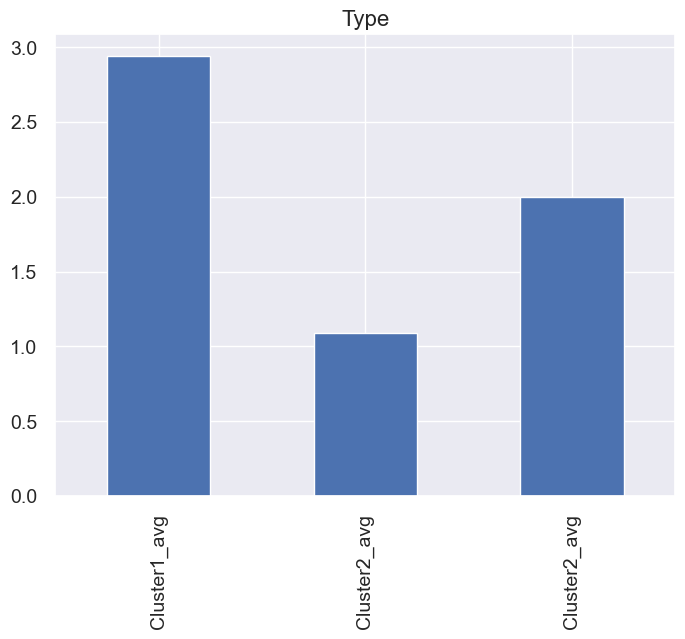

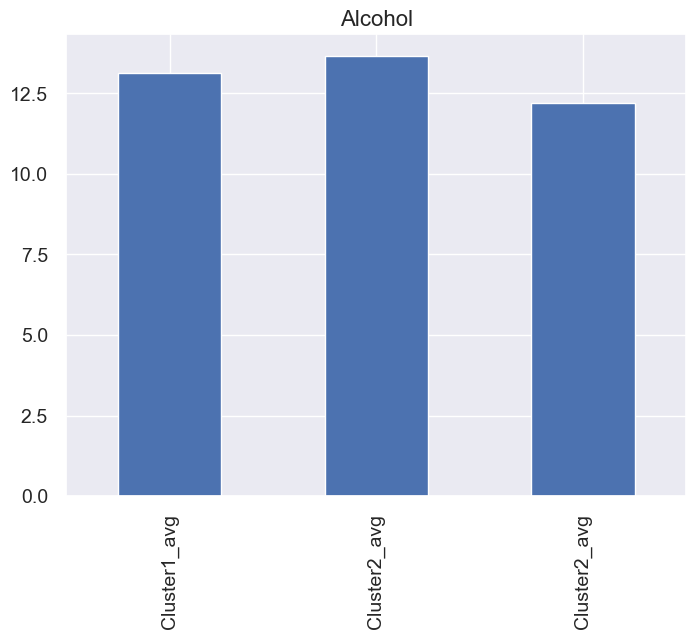

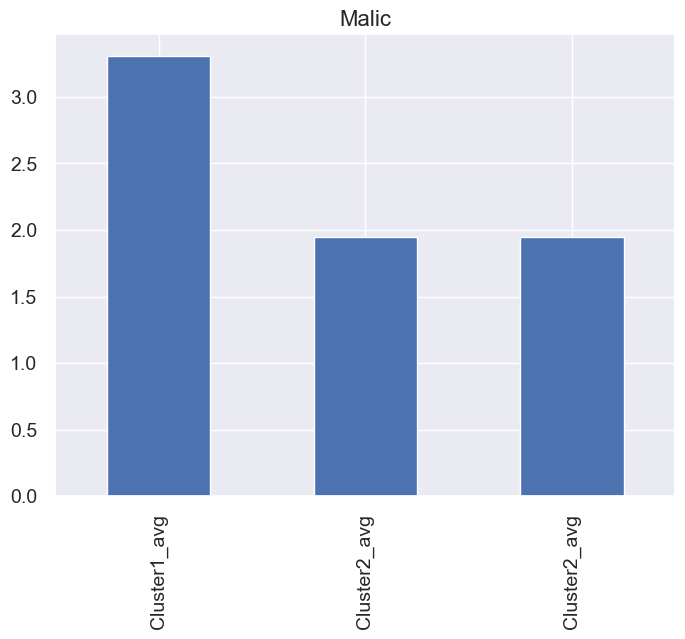

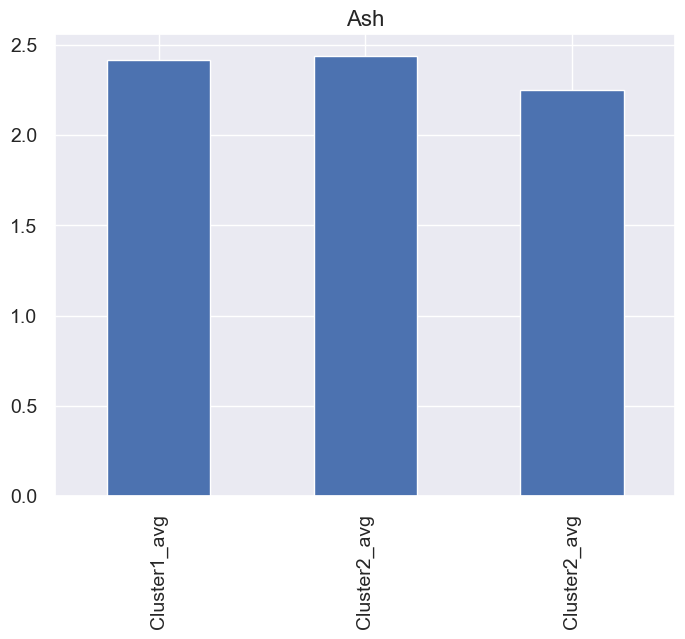

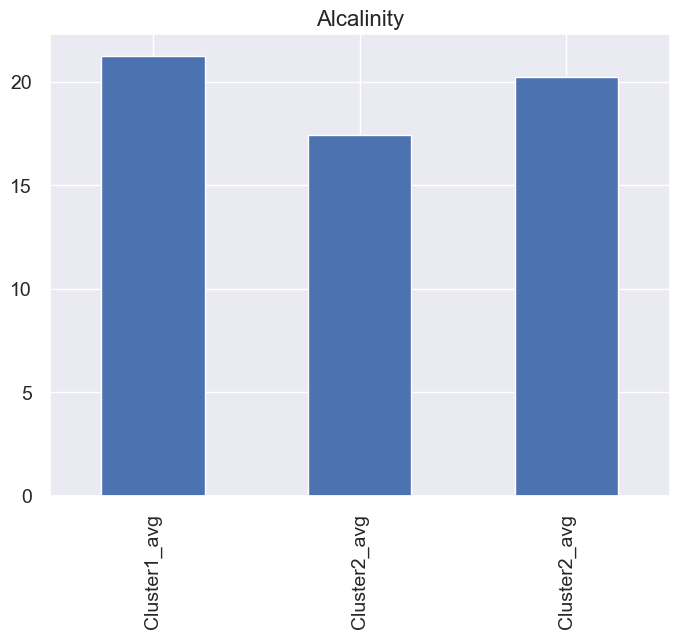

...

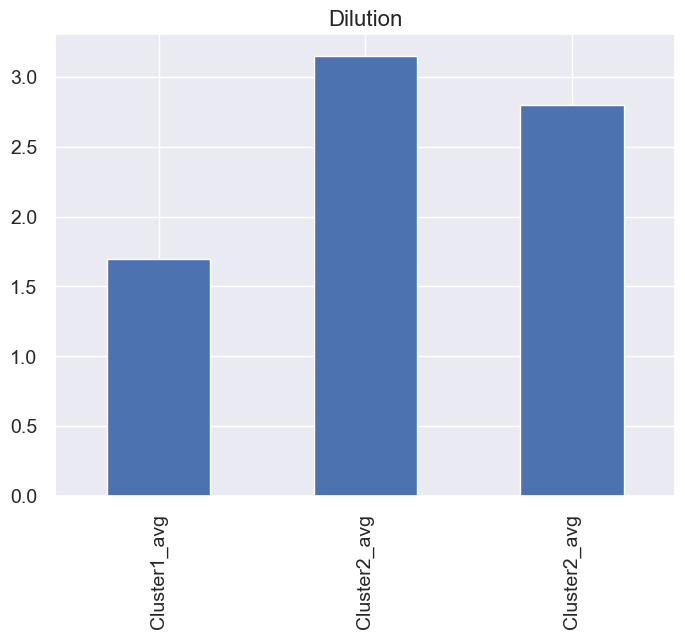

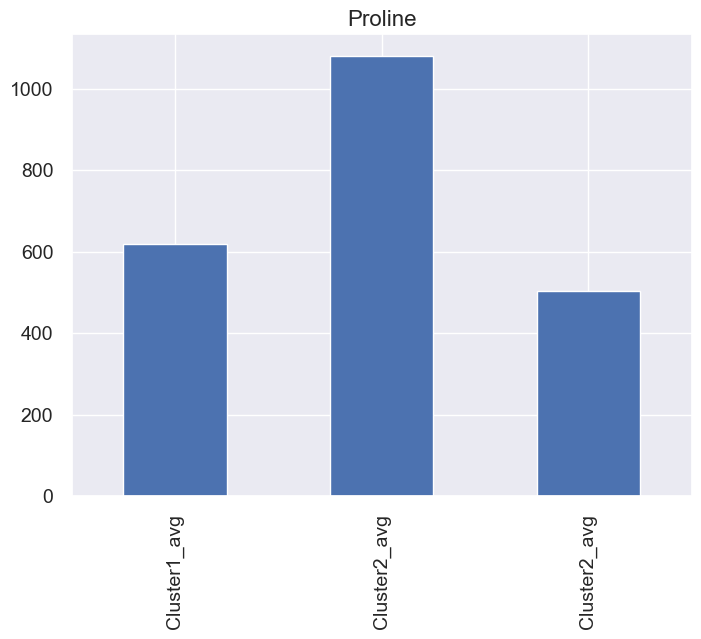

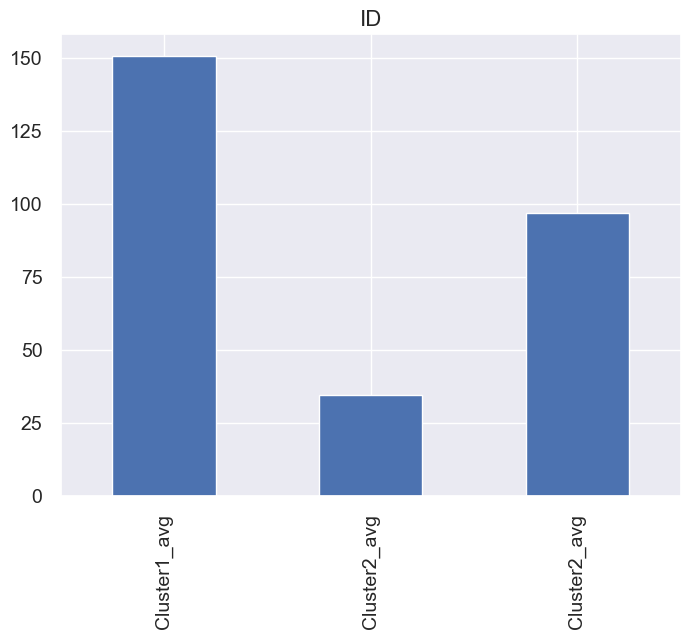

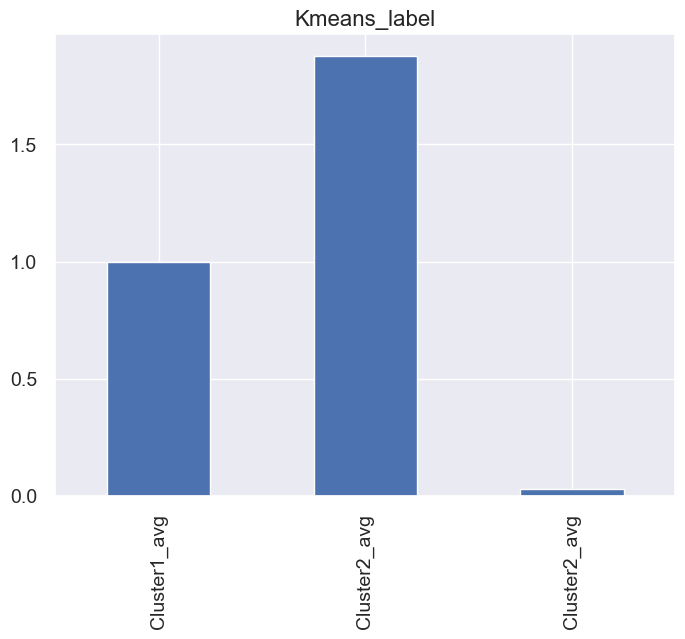

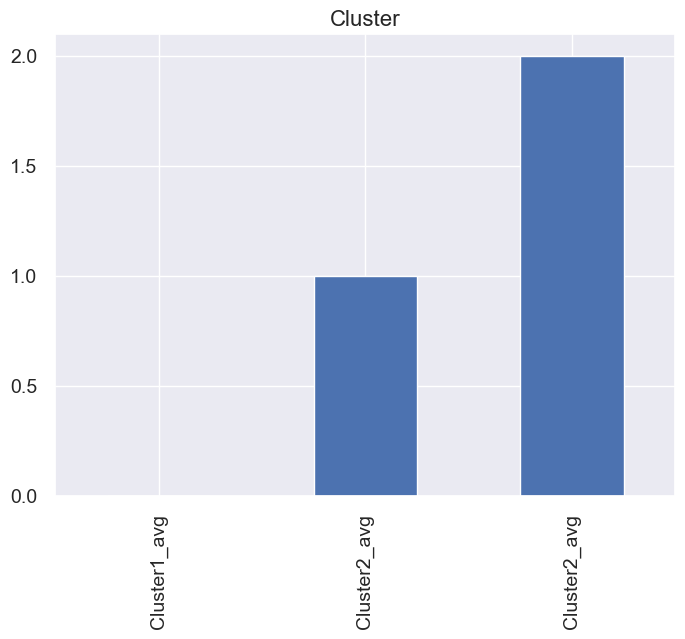

In [79]:
# Extract and plot one Column data .xs method
for i , row in avg_df.iterrows():
    fig = plt.subplots(figsize = (8,6))
    j = avg_df.xs(i ,axis = 0)
    plt.title(i, fontsize = 16, fontweight = 20)
    j.plot(kind = 'bar',fontsize = 14)
    plt.show()
    print()

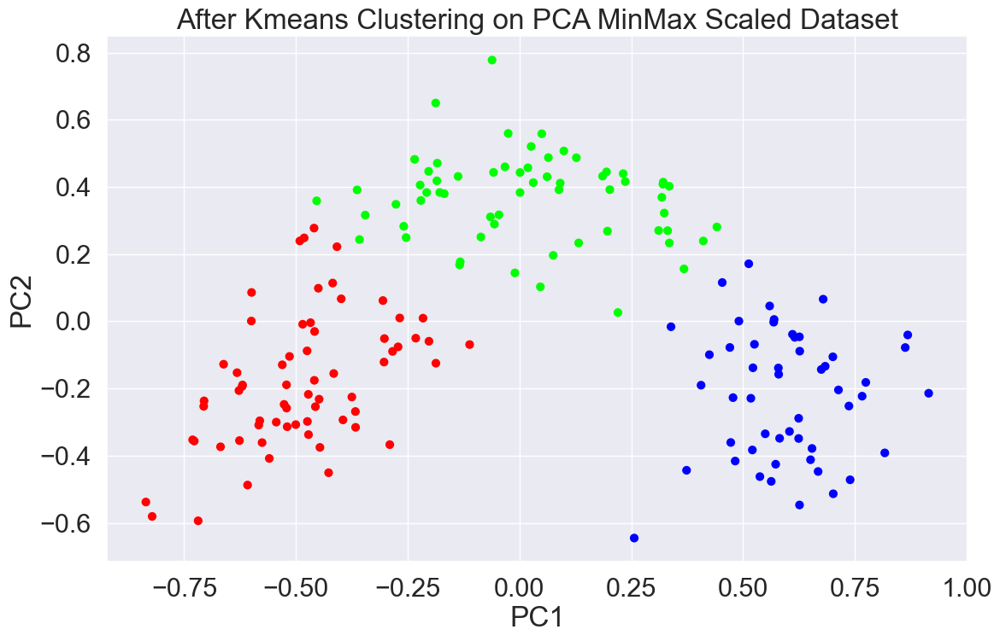

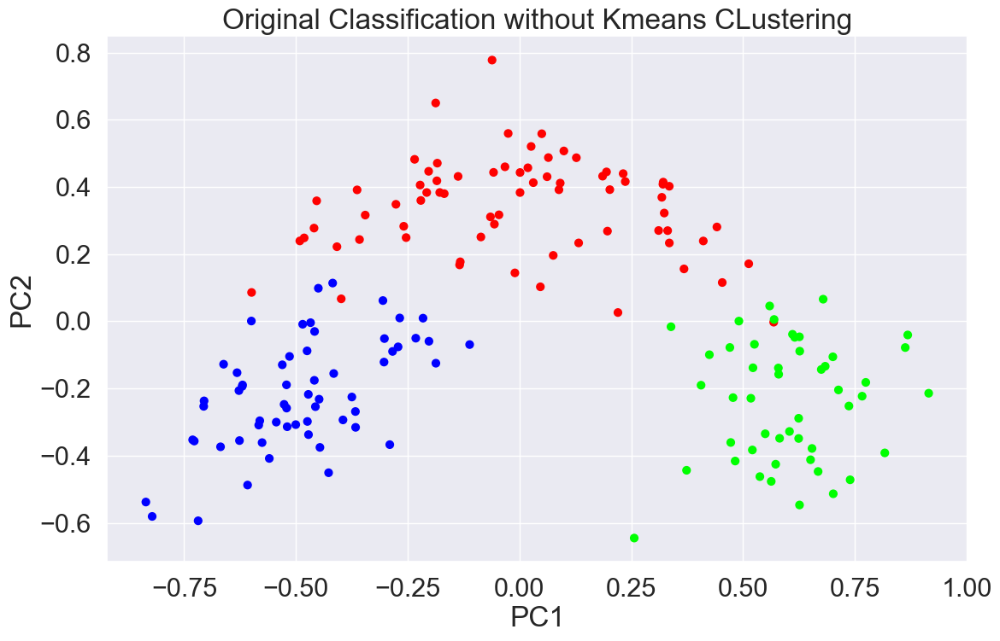

In [80]:
# Comparing Kmeans Clusters with the Original Classified Dataset using "Type" Feature
# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = df['Kmeans_label'], cmap = "brg", s = 40)

# Aesthetics
plt.title('After Kmeans Clustering on PCA MinMax Scaled Dataset')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = data['Type'], cmap = "brg", s = 40)

# Aesthetics
plt.title('Original Classification without Kmeans CLustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [81]:
# Group data by Clusters (K=3)
display('After Applying PCA and Kmens CLustering on Dataset',df.groupby('Kmeans_label').agg(['mean']),'Original Classified Dataset',data.groupby('Type').agg(['mean']))

'After Applying PCA and Kmens CLustering on Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Kmeans_label,,,,,,,,,,,,,
0,13.134118,3.307255,2.417647,21.241176,98.666667,1.683922,0.818824,0.451961,1.145882,7.234706,0.691961,1.696667,619.058824
1,13.656923,1.946154,2.437692,17.441538,106.584615,2.864615,2.970000,0.284308,1.923846,5.361692,1.071385,3.148923,1080.107692
2,12.202742,1.946774,2.249839,20.211290,93.451613,2.200806,2.038710,0.369032,1.607903,2.949355,1.056387,2.801129,502.709677


'Original Classified Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Type,,,,,,,,,,,,,,,
1,13.744746,2.010678,2.455593,17.037288,106.338983,2.840169,2.982373,0.290000,1.899322,5.528305,1.062034,3.157797,1115.711864,30.0,2.000000
2,12.278732,1.932676,2.244789,20.238028,94.549296,2.258873,2.080845,0.363662,1.630282,3.086620,1.056282,2.785352,519.507042,95.0,0.126761
3,13.153750,3.333750,2.437083,21.416667,99.312500,1.678750,0.781458,0.447500,1.153542,7.396250,0.682708,1.683542,629.895833,154.5,1.000000


In [82]:
# t-SNE
tsne = TSNE(n_components = 2)
X_tsne = tsne.fit_transform(minmax_df)

# Convert to data frame
tsne_df = pd.DataFrame(data = X_tsne, columns = ['tsne comp. 1', 'tsne comp. 2'])

# Shape and preview
print(tsne_df.shape)
tsne_df.head()

(178, 2)


,tsne comp. 1,tsne comp. 2
0,-0.965290,-14.211520
1,-2.973821,-10.952298
2,-4.635813,-13.652807
3,-4.019512,-16.200016
4,-6.107762,-8.684161


Text(0, 0.5, 'tsne component 2')

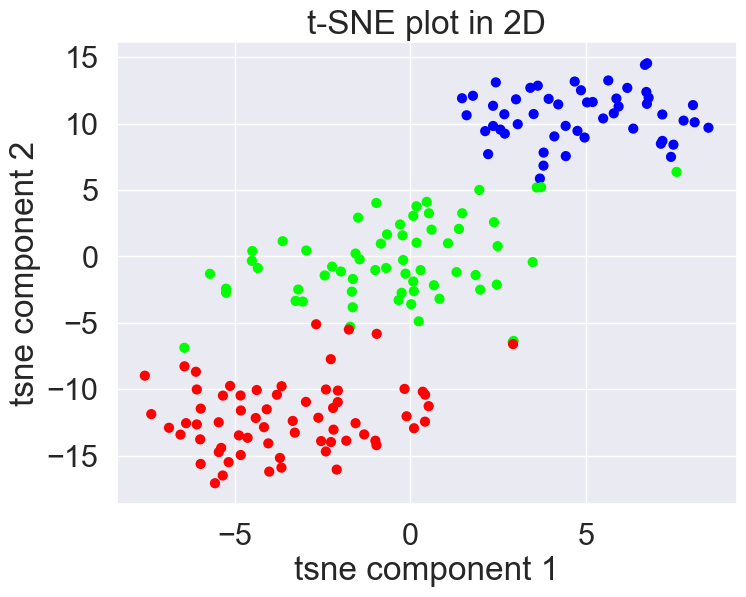

In [83]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(tsne_df.iloc[:,0], tsne_df.iloc[:,1], c = df['Kmeans_label'], cmap = "brg", s = 40)

# Aesthetics
plt.title('t-SNE plot in 2D')
plt.xlabel('tsne component 1')
plt.ylabel('tsne component 2')

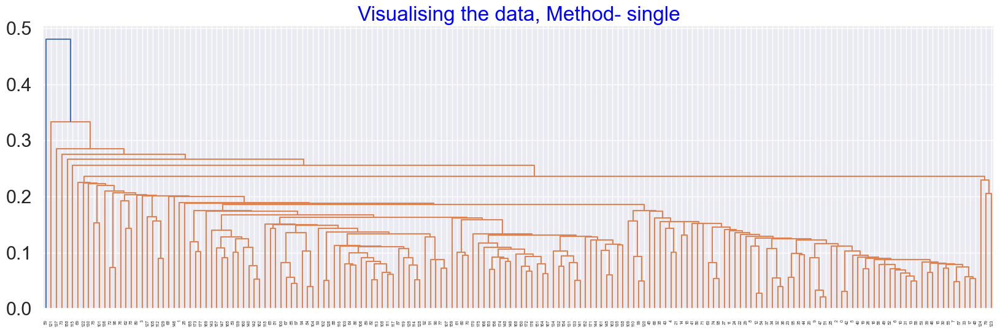

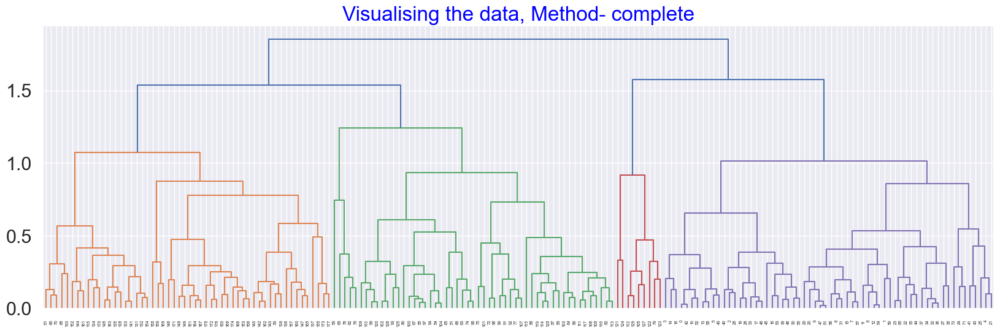

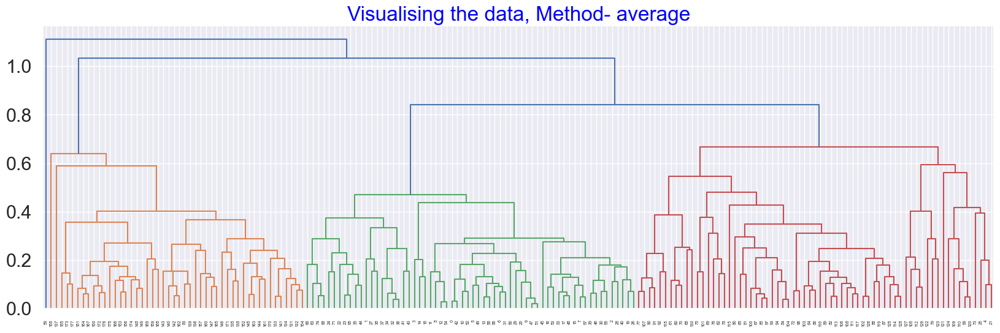

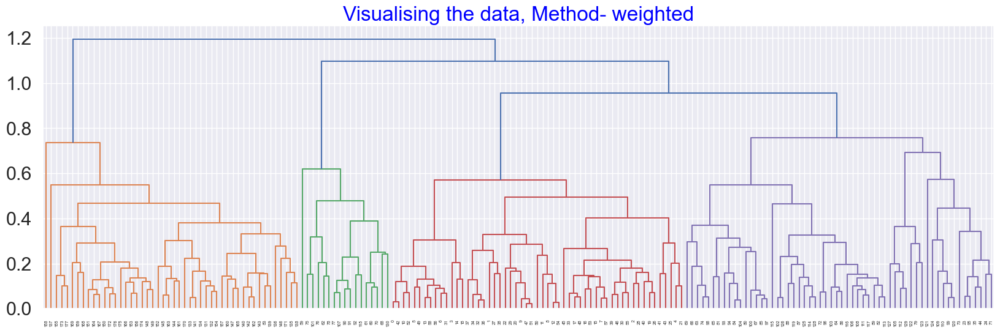

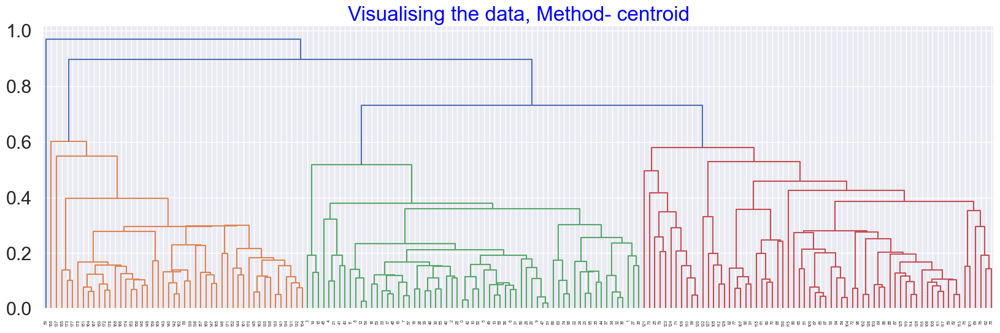

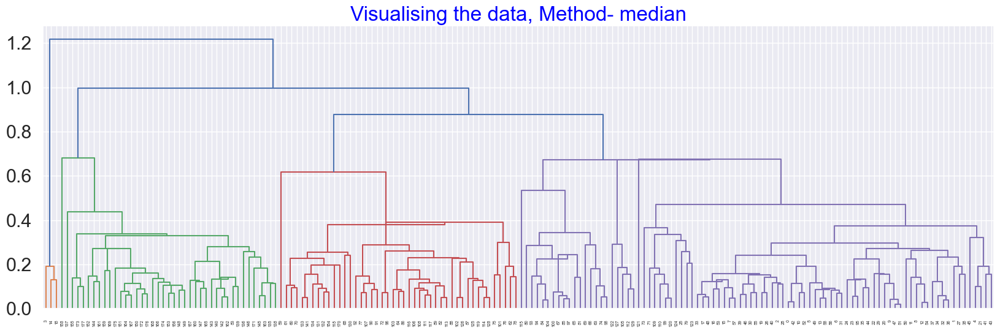

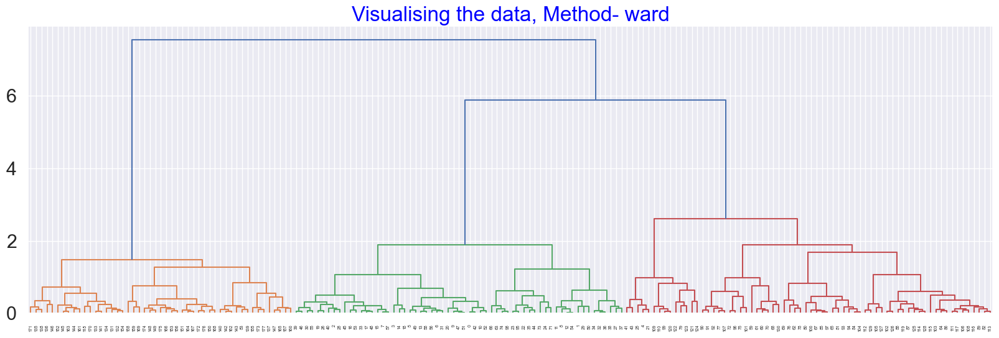

In [84]:
# Applying Dendrogram on data. Or you may apply it on Standardized/normalized indepedent variable data.
# Here diffrent linkage method from hyperparameter is used to see diff between methods for understanding. 
# Ward method is commanly used since it is simpler to visualize understanding.
# Find number of cluster's using color coding of dendrogram. Each color indicates one cluster.

for methods in ['single','complete','average','weighted','centroid','median','ward']: 
    plt.figure(figsize = (20, 6)) 
    
    dict = {'fontsize':24,'fontweight' :16, 'color' : 'blue'}
    
    plt.title('Visualising the data, Method- {}'.format(methods),fontdict = dict) 
    Dendrogram1 = sch.dendrogram(sch.linkage(pca_minmax_df, method = methods,optimal_ordering = False))

In [85]:
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n_clusters,linkage = linkages) # by default it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(pca_minmax_df)
        silhouette_score1 = sil(pca_minmax_df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.4276175866144028
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.3385358273079748
For n_clusters = 2 The average silhouette_score with linkage- average : 0.26571303050122885
For n_clusters = 2 The average silhouette_score with linkage- single : 0.26571303050122885

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.4596281708499888
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.2800601589658388
For n_clusters = 3 The average silhouette_score with linkage- average : 0.39054474828492275
For n_clusters = 3 The average silhouette_score with linkage- single : 0.14206633532594215

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.42381275627339543
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.445101756583814
For n_clusters = 4 The average silhouette_score with linkage- average : 0.44723850921169306


In [86]:
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["complete", "average", "single"]:
        for affinities in ["euclidean", "l1", "l2","manhattan", "cosine"]:
            hie_cluster1 = AgglomerativeClustering(n_clusters = n_clusters, affinity = affinities, linkage = linkages) # by default it takes linkage 'ward'
            hie_labels1 = hie_cluster1.fit_predict(pca_minmax_df)
            silhouette_score1 = sil(pca_minmax_df, hie_labels1)
            print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages,"and Affinity-",affinities,':',silhouette_score1)
        print()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.3385358273079748
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l1 : 0.37076539413903803
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l2 : 0.3385358273079748
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.37076539413903803
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- cosine : 0.3951343007029965

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- euclidean : 0.26571303050122885
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l1 : 0.4276175866144028
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l2 : 0.26571303050122885
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- manhattan : 0.427

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.445101756583814
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- l1 : 0.4128188397565742
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- l2 : 0.445101756583814
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.4128188397565742
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- cosine : 0.4111391422534525

For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- euclidean : 0.44723850921169306
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- l1 : 0.45472973778414066
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- l2 : 0.44723850921169306
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- manhattan : 0.454729

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 4 The average silhouette_score with linkage- single and Affinity- cosine : -0.12756290385037145

For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.4162897251524476
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- l1 : 0.4114241903370434
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- l2 : 0.4162897251524476
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.4114241903370434
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- cosine : 0.37873488424286617

For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- euclidean : 0.4308322131648259
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- l1 : 0.4203741980545537
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- l2 : 0.4308322

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 6 The average silhouette_score with linkage- complete and Affinity- l2 : 0.346212424879303
For n_clusters = 6 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.3377495088944783
For n_clusters = 6 The average silhouette_score with linkage- complete and Affinity- cosine : 0.34612685223640943

For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- euclidean : 0.3776367510991955
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- l1 : 0.40625249381833584
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- l2 : 0.3776367510991955
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- manhattan : 0.40625249381833584
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- cosine : 0.36631797167904834

For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- euclidean : -0.2

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 7 The average silhouette_score with linkage- complete and Affinity- l2 : 0.2199895547842981
For n_clusters = 7 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.28280409650196453
For n_clusters = 7 The average silhouette_score with linkage- complete and Affinity- cosine : 0.28853512102106404

For n_clusters = 7 The average silhouette_score with linkage- average and Affinity- euclidean : 0.34275816169199497
For n_clusters = 7 The average silhouette_score with linkage- average and Affinity- l1 : 0.3320269556347125
For n_clusters = 7 The average silhouette_score with linkage- average and Affinity- l2 : 0.34275816169199497
For n_clusters = 7 The average silhouette_score with linkage- average and Affinity- manhattan : 0.3320269556347125
For n_clusters = 7 The average silhouette_score with linkage- average and Affinity- cosine : 0.34297703199791424

For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- euclidean : -0

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 8 The average silhouette_score with linkage- average and Affinity- euclidean : 0.3182445027333517
For n_clusters = 8 The average silhouette_score with linkage- average and Affinity- l1 : 0.26124629116655923
For n_clusters = 8 The average silhouette_score with linkage- average and Affinity- l2 : 0.3182445027333517
For n_clusters = 8 The average silhouette_score with linkage- average and Affinity- manhattan : 0.26124629116655923
For n_clusters = 8 The average silhouette_score with linkage- average and Affinity- cosine : 0.26807025343381646

For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- euclidean : -0.30306798786317535
For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- l1 : -0.31388730564570366
For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- l2 : -0.30306798786317535
For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- manhattan : -0.313887

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

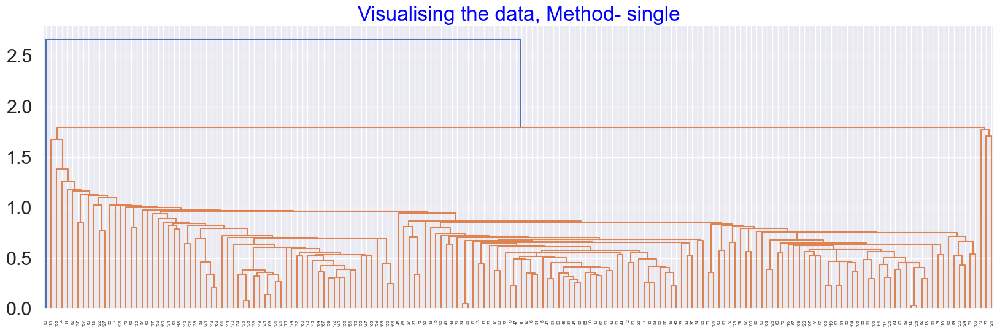

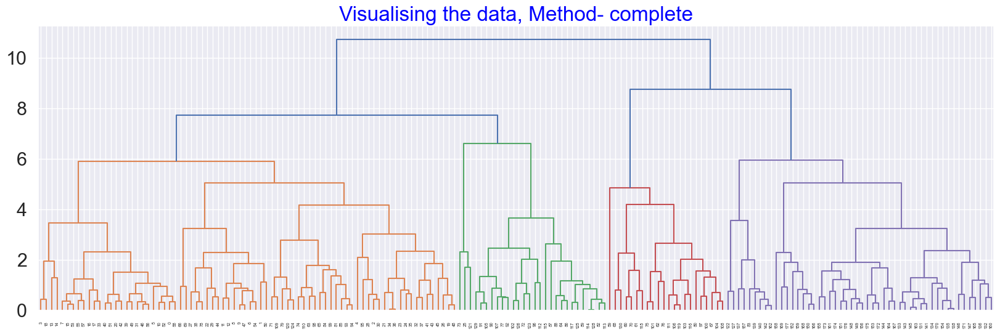

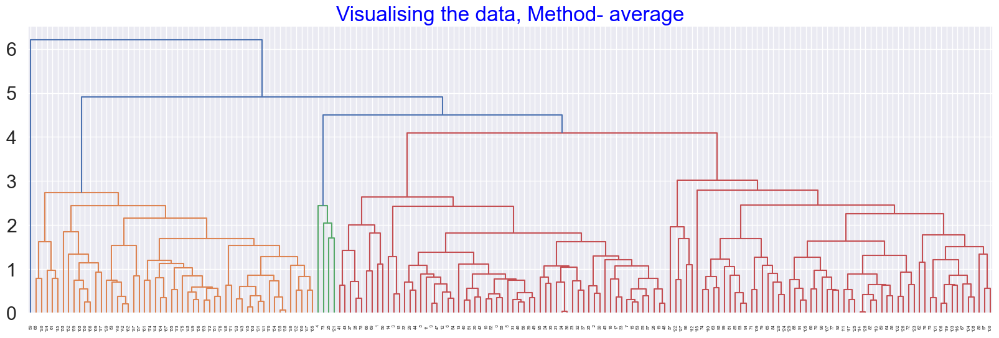

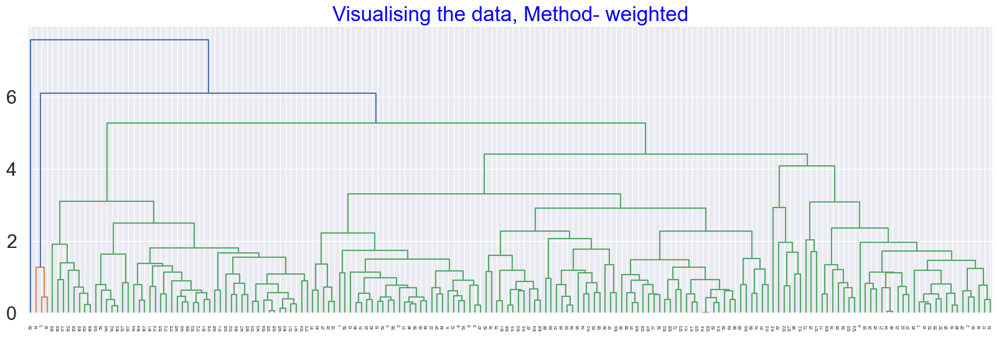

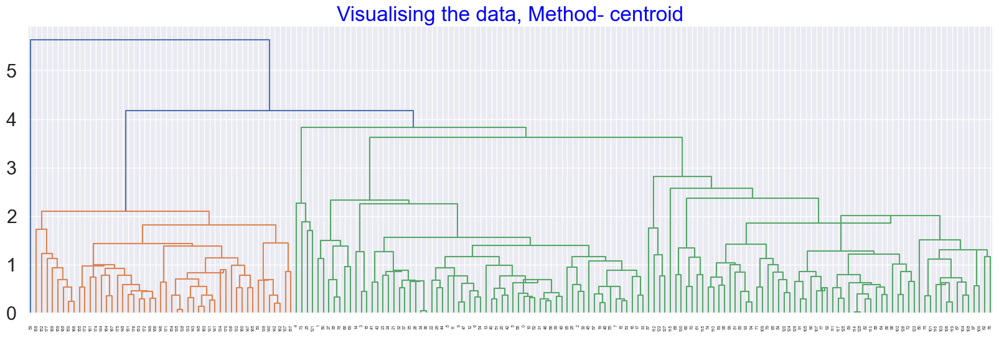

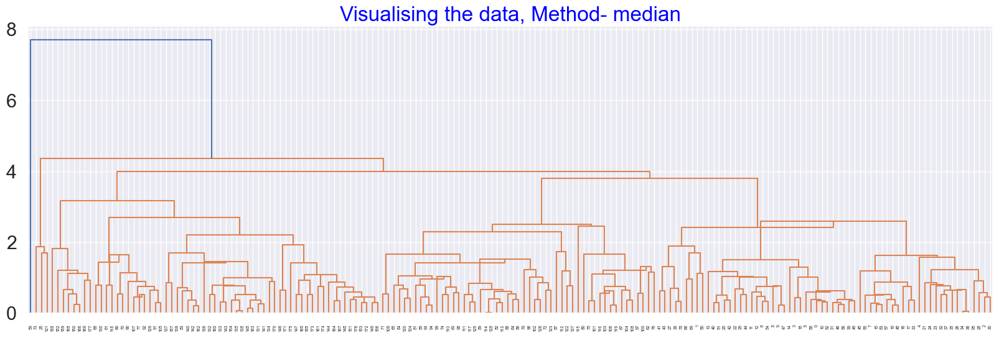

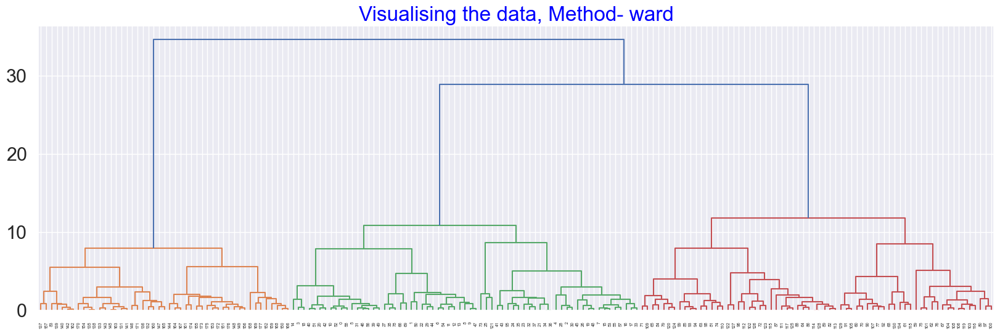

In [87]:
# Applying Dendrogram on data. Or you may apply it on Standardized/normalized indepedent variable data.
# Here diffrent linkage method from hyperparameter is used to see diff between methods for understanding. 
# Ward method is commanly used since it is simpler to visualize understanding.
# Find number of cluster's using color coding of dendrogram. Each color indicates one cluster.

for methods in ['single','complete','average','weighted','centroid','median','ward']: 
    plt.figure(figsize = (20, 6)) 
    
    dict = {'fontsize':24,'fontweight' :16, 'color' : 'blue'}
    
    plt.title('Visualising the data, Method- {}'.format(methods), fontdict = dict) 
    Dendrogram1 = sch.dendrogram(sch.linkage(pca_std_df, method = methods, optimal_ordering = False))

In [88]:
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n_clusters, linkage = linkages) # by default it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(pca_std_df)
        silhouette_score1 = sil(pca_std_df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.395090372250754
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.3254686544245087
For n_clusters = 2 The average silhouette_score with linkage- average : 0.363106730510414
For n_clusters = 2 The average silhouette_score with linkage- single : 0.363106730510414

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.44594921980629704
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.2875008935160635
For n_clusters = 3 The average silhouette_score with linkage- average : 0.3867254520074774
For n_clusters = 3 The average silhouette_score with linkage- single : 0.2166287164412576

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.38195690348144407
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.35784842685673063
For n_clusters = 4 The average silhouette_score with linkage- average : 0.32173131311197717
For 

In [89]:
# Applying Different Linkages using Different Distance Methods
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["complete", "average", "single"]:
        for affinities in ["euclidean", "l1", "l2","manhattan", "cosine"]:
            hie_cluster1 = AgglomerativeClustering(n_clusters = n_clusters, affinity = affinities, linkage = linkages) # by default it takes linkage 'ward'
            hie_labels1 = hie_cluster1.fit_predict(pca_std_df)
            silhouette_score1 = sil(pca_std_df, hie_labels1)
            print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages,"and Affinity-",affinities,':',silhouette_score1)
        print()

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.3254686544245087


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l1 : 0.38619767389930293
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l2 : 0.3254686544245087
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.38619767389930293
For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- cosine : 0.3326300750899873

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- euclidean : 0.363106730510414
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l1 : 0.363106730510414
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l2 : 0.363106730510414
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- manhattan : 0.363106730510414
For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- cosine : 0.3861976738993

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.35784842685673063
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- l1 : 0.3678672944255002
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- l2 : 0.35784842685673063
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.3678672944255002
For n_clusters = 4 The average silhouette_score with linkage- complete and Affinity- cosine : 0.3861088892516037

For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- euclidean : 0.32173131311197717
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- l1 : 0.44607254342028296
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- l2 : 0.32173131311197717
For n_clusters = 4 The average silhouette_score with linkage- average and Affinity- manhattan : 0.44

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- l1 : 0.27389162159790836
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- l2 : 0.35584479879635356
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.27389162159790836
For n_clusters = 5 The average silhouette_score with linkage- complete and Affinity- cosine : 0.3466678851578335

For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- euclidean : 0.4465449278023583
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- l1 : 0.4465449278023583
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- l2 : 0.4465449278023583
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- manhattan : 0.4465449278023583
For n_clusters = 5 The average silhouette_score with linkage- average and Affinity- cosine : 0.36871459

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- l1 : 0.400288081305462
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- l2 : 0.39074628143794893
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- manhattan : 0.400288081305462
For n_clusters = 6 The average silhouette_score with linkage- average and Affinity- cosine : 0.3554065617172251

For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- euclidean : 0.004864737334294195
For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- l1 : -0.10467596115575185
For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- l2 : 0.004864737334294195
For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- manhattan : -0.10467596115575185
For n_clusters = 6 The average silhouette_score with linkage- single and Affinity- cosine : 0.0544778972167

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- euclidean : -0.10255716440985196
For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- l1 : -0.23430206934794132
For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- l2 : -0.10255716440985196
For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- manhattan : -0.23430206934794132
For n_clusters = 7 The average silhouette_score with linkage- single and Affinity- cosine : -0.1006374301116391

For n_clusters = 8 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.26754968363921144
For n_clusters = 8 The average silhouette_score with linkage- complete and Affinity- l1 : 0.20328791339441987
For n_clusters = 8 The average silhouette_score with linkage- complete and Affinity- l2 : 0.26754968363921144
For n_clusters = 8 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.2

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sk

For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- manhattan : -0.2704189998086683
For n_clusters = 8 The average silhouette_score with linkage- single and Affinity- cosine : -0.10122162500404952



C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [90]:
# Run Hierarchical Clustering.(Agglomerative Clustering) For PCA on Standard Scaled Data
agg_clustering = AgglomerativeClustering(n_clusters = 4, linkage = 'complete', affinity = 'l1')
y_pred_hie = agg_clustering.fit_predict(pca_std_df)
print(y_pred_hie.shape)
y_pred_hie

(178,)


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 2, 0, 2, 0,
       0, 2, 1, 0, 1, 0, 2, 3, 0, 2, 2, 1, 0, 0, 2, 2, 2, 1, 0, 2, 2, 2,
       1, 2, 1, 1, 1, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 1, 2, 1, 2, 0,
       0, 2, 1, 2, 2, 2, 2, 2, 1, 2, 0, 3, 1, 2, 0, 2, 2, 1, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [91]:
# Cluster numbers

agg_clustering.n_clusters_

4

In [92]:
# Clustering Score

(sil(pca_std_df, agg_clustering.labels_)*100).round(3)

36.787

In [93]:
# Putting Cluster lables into original dataset And analysis of the same
# Concating Labels with main dataset copy

df['Hierarchical_labels'] = agg_clustering.labels_
df.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label,Hierarchical_labels
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1,3


In [94]:
df.groupby('Hierarchical_labels').agg(['mean'])

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,13.437260,1.978630,2.393151,17.341096,105.219178,2.831507,2.914247,0.282466,2.006575,5.096986,1.062603,3.119726,1011.767123,1.150685
1,12.941538,3.076615,2.418462,21.215385,97.538462,1.706154,0.986769,0.465846,1.182154,6.314462,0.756400,1.854615,604.584615,0.430769
2,12.254167,1.752500,2.150556,20.019444,89.805556,2.195000,1.971944,0.332500,1.452500,2.793611,1.091111,2.868611,465.972222,2.000000
3,12.710000,2.090000,2.980000,26.125000,125.000000,2.977500,3.335000,0.385000,1.892500,4.312500,1.102500,3.330000,753.750000,1.250000


In [96]:
print(df.columns)


Index(['Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols',
       'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue',
       'Dilution', 'Proline', 'Kmeans_label', 'Hierarchical_labels'],
      dtype='object')


In [98]:
print(df.head())  # View the first few rows of the DataFrame


   Alcohol  Malic   Ash  Alcalinity  Magnesium  Phenols  Flavanoids  \
0    14.23   1.71  2.43        15.6        127     2.80        3.06   
1    13.20   1.78  2.14        11.2        100     2.65        2.76   
2    13.16   2.36  2.67        18.6        101     2.80        3.24   
3    14.37   1.95  2.50        16.8        113     3.85        3.49   
4    13.24   2.59  2.87        21.0        118     2.80        2.69   

   Nonflavanoids  Proanthocyanins  Color   Hue  Dilution  Proline  \
0           0.28             2.29   5.64  1.04      3.92     1065   
1           0.26             1.28   4.38  1.05      3.40     1050   
2           0.30             2.81   5.68  1.03      3.17     1185   
3           0.24             2.18   7.80  0.86      3.45     1480   
4           0.39             1.82   4.32  1.04      2.93      735   

   Kmeans_label  Hierarchical_labels  
0             1                    0  
1             1                    0  
2             1                    0  
3 

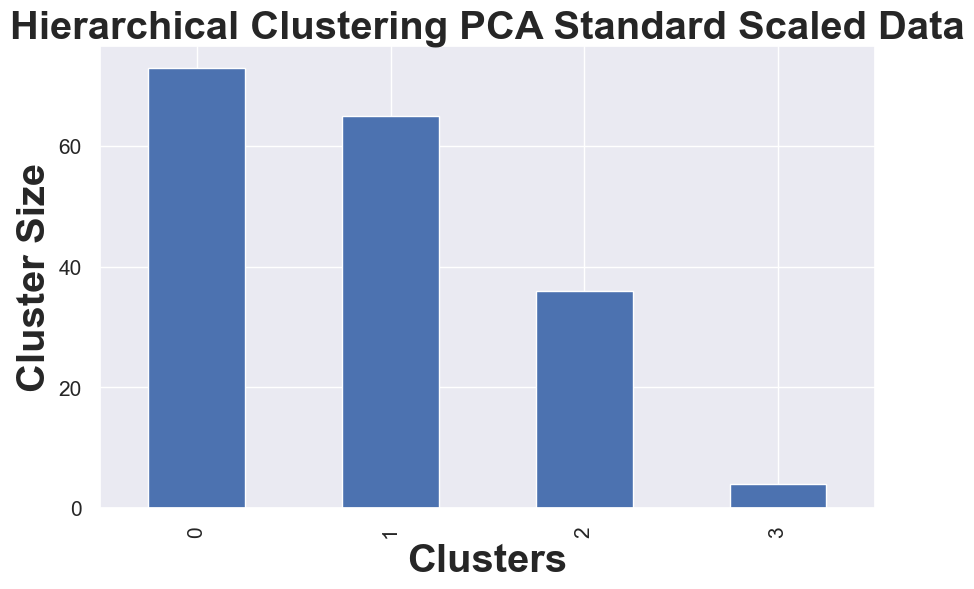

In [99]:
import matplotlib.pyplot as plt

# Assuming you have a column 'Hierarchical_labels' in your DataFrame
# You can replace 'df' with the name of your actual DataFrame

# Create a bar plot to visualize the number of rows in each cluster
fig, ax = plt.subplots(figsize=(10, 6))
df.groupby(['Hierarchical_labels']).size().plot(kind='bar')

# Customize the plot
plt.ylabel('Cluster Size')
plt.title('Hierarchical Clustering PCA Standard Scaled Data', fontsize='large', fontweight='bold')
ax.set_xlabel('Clusters', fontsize='large', fontweight='bold')
ax.set_ylabel('Cluster Size', fontsize='large', fontweight='bold')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

# Show the plot
plt.show()


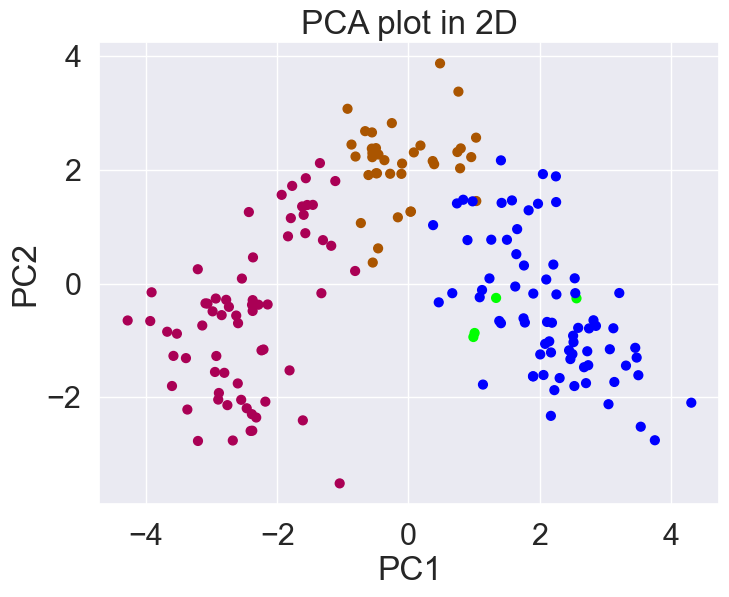

In [100]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(pca_std_df.iloc[:,0], pca_std_df.iloc[:,1], c = df['Hierarchical_labels'], cmap = "brg", s = 40)

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

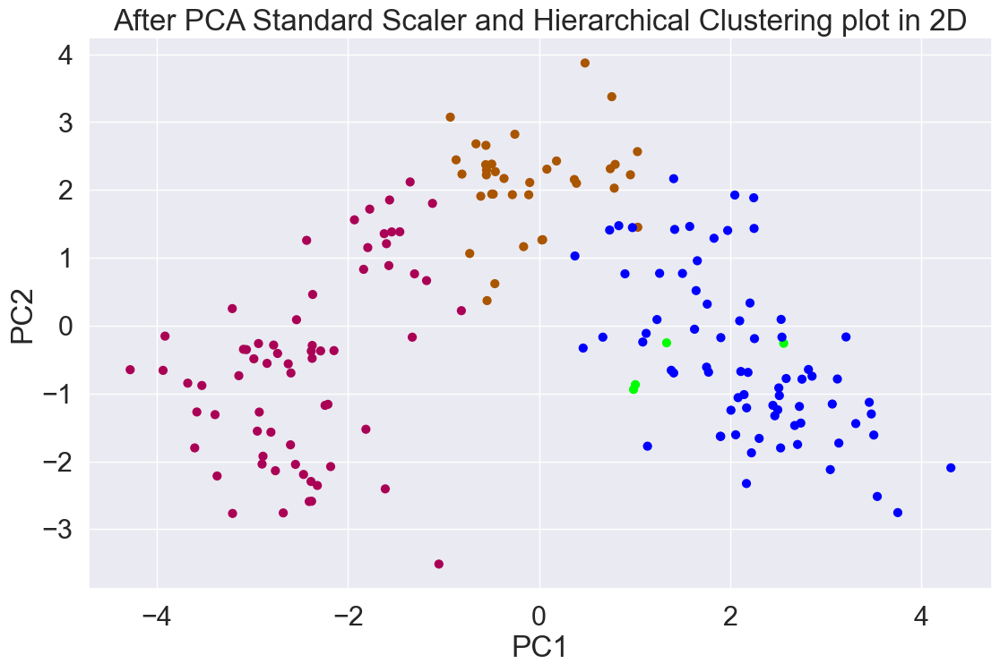

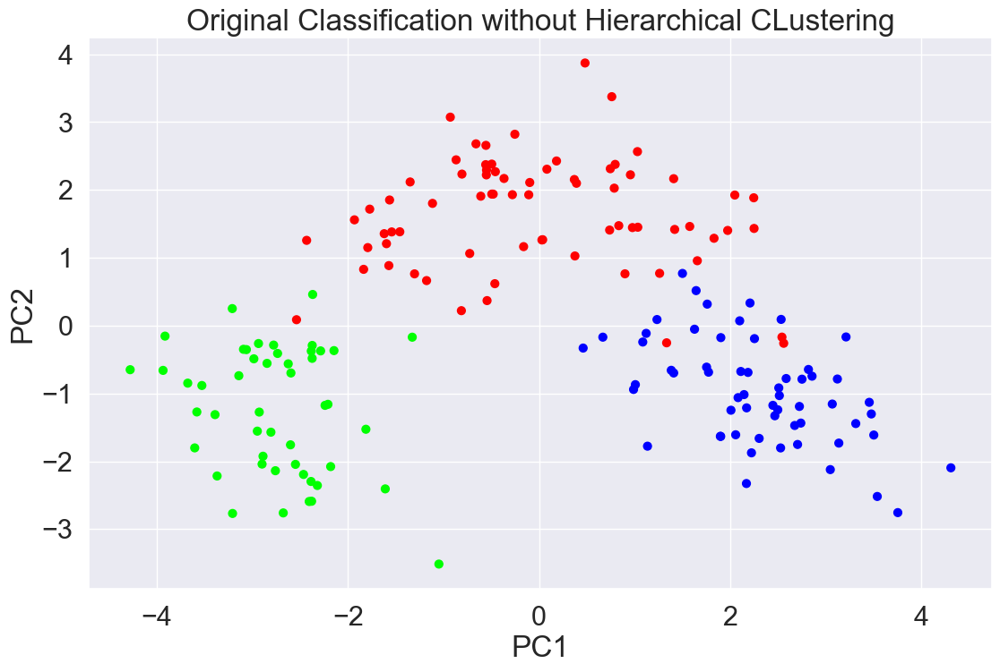

In [101]:
# Comparing Hierarchical Clusters with the Original Classified Dataset using "Type" Feature
# Scatterplot
plt.scatter(pca_std_df.iloc[:,0], pca_std_df.iloc[:,1], c = df['Hierarchical_labels'], cmap = "brg", s = 40)

# Aesthetics
plt.title('After PCA Standard Scaler and Hierarchical Clustering plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

# Scatterplot
plt.scatter(pca_std_df.iloc[:,0], pca_std_df.iloc[:,1], c = data['Type'], cmap = "brg", s = 40)

# Aesthetics
plt.title('Original Classification without Hierarchical CLustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [102]:
# Group data by Clusters (Clusters=4)
display('After Applying Hierarchical Clustering on PCA Standard Scaled Dataset',df.groupby('Hierarchical_labels').agg(['mean']),'Original Classified Dataset',data.groupby('Type').agg(['mean']))

'After Applying Hierarchical Clustering on PCA Standard Scaled Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,13.437260,1.978630,2.393151,17.341096,105.219178,2.831507,2.914247,0.282466,2.006575,5.096986,1.062603,3.119726,1011.767123,1.150685
1,12.941538,3.076615,2.418462,21.215385,97.538462,1.706154,0.986769,0.465846,1.182154,6.314462,0.756400,1.854615,604.584615,0.430769
2,12.254167,1.752500,2.150556,20.019444,89.805556,2.195000,1.971944,0.332500,1.452500,2.793611,1.091111,2.868611,465.972222,2.000000
3,12.710000,2.090000,2.980000,26.125000,125.000000,2.977500,3.335000,0.385000,1.892500,4.312500,1.102500,3.330000,753.750000,1.250000


'Original Classified Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Type,,,,,,,,,,,,,,,
1,13.744746,2.010678,2.455593,17.037288,106.338983,2.840169,2.982373,0.290000,1.899322,5.528305,1.062034,3.157797,1115.711864,30.0,2.000000
2,12.278732,1.932676,2.244789,20.238028,94.549296,2.258873,2.080845,0.363662,1.630282,3.086620,1.056282,2.785352,519.507042,95.0,0.126761
3,13.153750,3.333750,2.437083,21.416667,99.312500,1.678750,0.781458,0.447500,1.153542,7.396250,0.682708,1.683542,629.895833,154.5,1.000000


In [103]:
# Run Hierarchical Clustering.(Agglomerative Clustering) For PCA on MinMaxScaled Data
agg_clustering = AgglomerativeClustering(n_clusters = 3, linkage = 'average', affinity = 'l2')
y_pred_hie = agg_clustering.fit_predict(pca_minmax_df)
print(y_pred_hie.shape)
y_pred_hie

(178,)


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2], dtype=int64)

In [104]:
# Cluster numbers

agg_clustering.n_clusters_

3

In [105]:
# Clustering Score

(sil(pca_minmax_df, agg_clustering.labels_)*100).round(3)

39.054

In [106]:
# Putting Cluster lables into original dataset And analysis of the same
# Concating Labels with main dataset copy

df['Hierarchical_labels'] = agg_clustering.labels_
df.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label,Hierarchical_labels
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1,0


In [107]:
df.groupby('Hierarchical_labels').agg(['mean'])

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,12.947054,1.956589,2.348062,18.813953,100.279070,2.525814,2.502248,0.327519,1.757442,4.206744,1.058341,2.957597,793.077519,1.449612
1,12.370000,0.940000,1.360000,10.600000,88.000000,1.980000,0.570000,0.280000,0.420000,1.950000,1.050000,1.820000,520.000000,2.000000
2,13.157708,3.386042,2.437083,21.510417,98.541667,1.681667,0.788542,0.455833,1.167708,7.410833,0.684375,1.698542,627.500000,0.000000


In [108]:
# Print the column names to identify the correct one for IDs
print(df.columns)



Index(['Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols',
       'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue',
       'Dilution', 'Proline', 'Kmeans_label', 'Hierarchical_labels'],
      dtype='object')


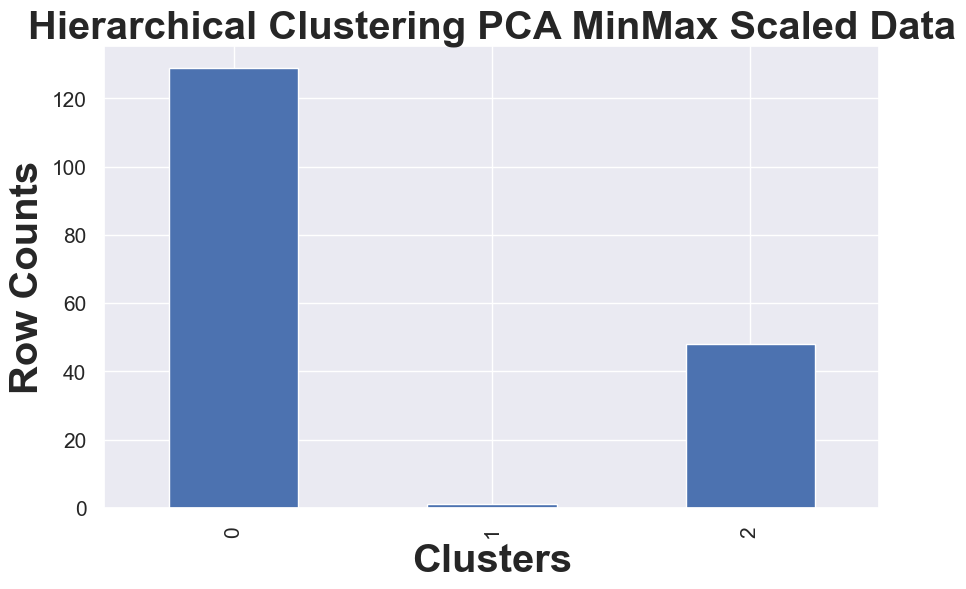

In [109]:
import matplotlib.pyplot as plt

# Plotting barplot to visualize the number of rows in each cluster
fig, ax = plt.subplots(figsize=(10, 6))
cluster_counts = df.groupby(['Hierarchical_labels']).size()
cluster_counts.plot(kind='bar')

ax.set_xlabel('Clusters', fontsize='large', fontweight='bold')
ax.set_ylabel('Row Counts', fontsize='large', fontweight='bold')

plt.title('Hierarchical Clustering PCA MinMax Scaled Data', fontsize='large', fontweight='bold')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()


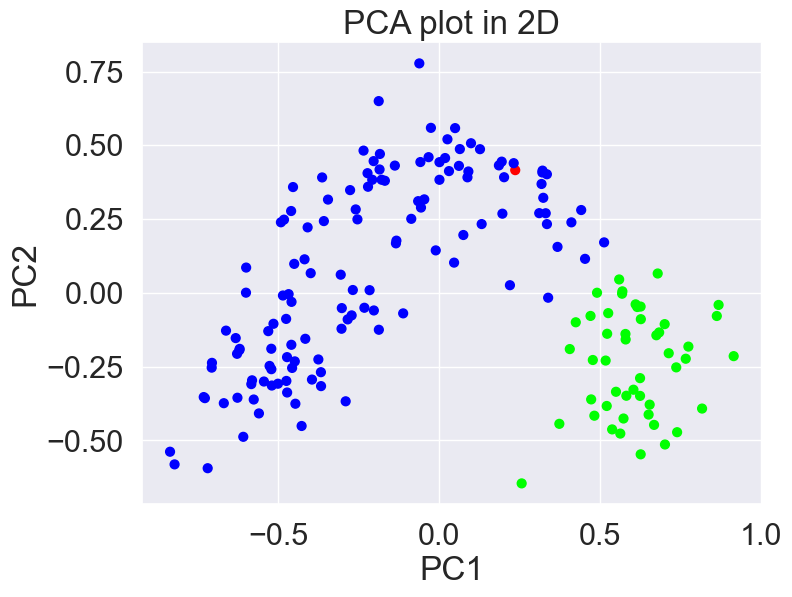

In [110]:
# Figure size
plt.figure(figsize = (8,6))

# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = df['Hierarchical_labels'], cmap = "brg", s = 40)

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.p

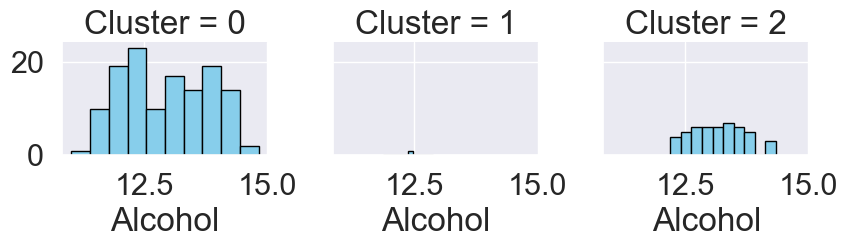

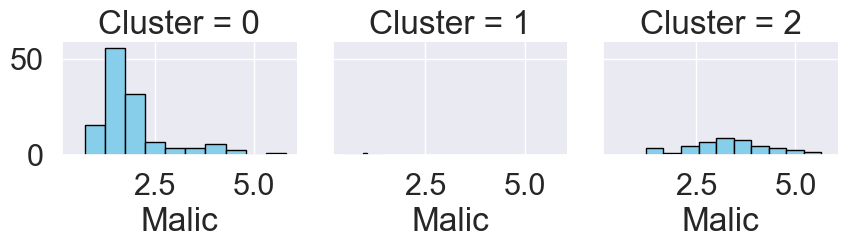

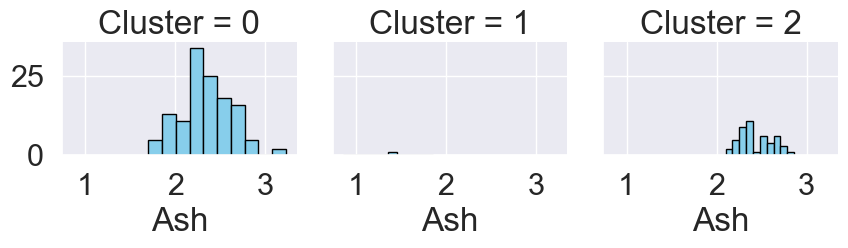

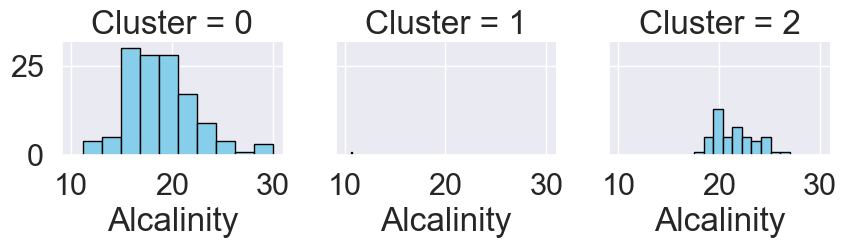

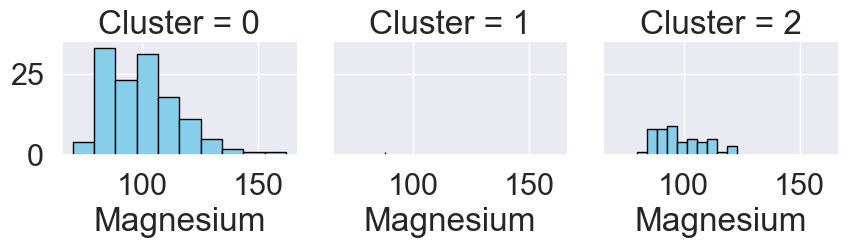

...

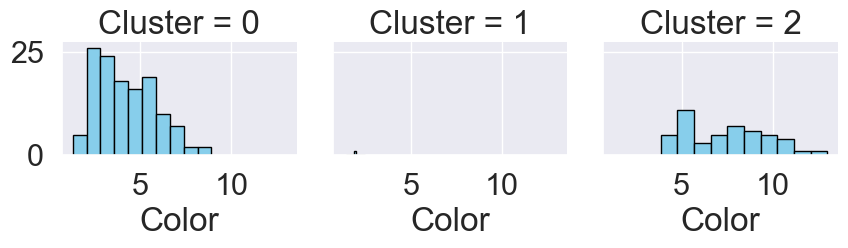

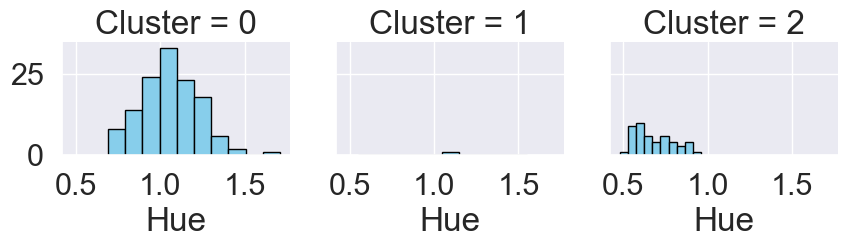

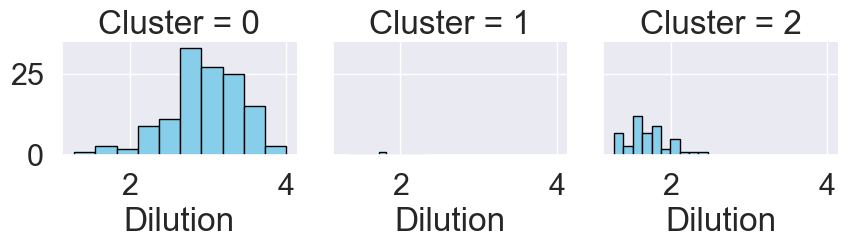

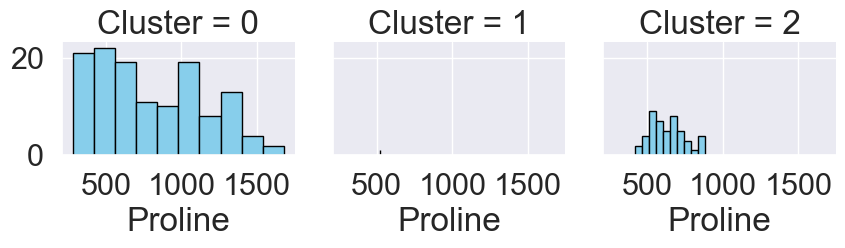

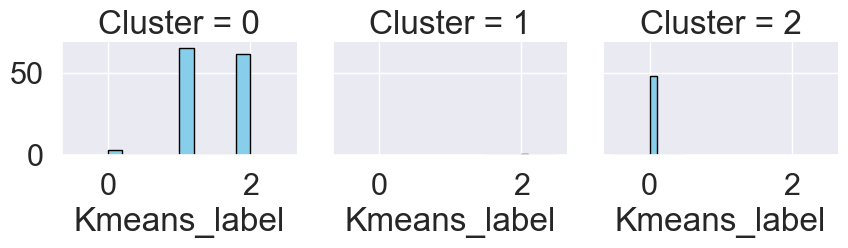

In [111]:
df1 = df.copy()
df1.rename({"Hierarchical_labels":'Cluster'}, axis = 1,inplace = True)

aux = df1.columns.tolist()
aux[0:len(aux)-1]

sns.set(style = "darkgrid", rc = {'figure.figsize':(13,8)}, font_scale = 2)

for cluster in aux[0:len(aux)-1]:
    grid = sns.FacetGrid(df1, col = "Cluster")
    grid.map(plt.hist, cluster, color = "skyblue", lw = 1, edgecolor = "black")

In [112]:
# Sorting elements based on cluster label assigned and taking average for insights.

cluster1 = pd.DataFrame(df1.loc[df1.Cluster == 0].mean(),columns = ['Cluster1_avg'])
cluster2 = pd.DataFrame(df1.loc[df1.Cluster == 1].mean(),columns = ['Cluster2_avg'])
cluster3 = pd.DataFrame(df1.loc[df1.Cluster == 2].mean(),columns = ['Cluster2_avg'])

In [113]:
avg_df = pd.concat([cluster1,cluster2,cluster3], axis = 1)
avg_df

,Cluster1_avg,Cluster2_avg,Cluster2_avg
Alcohol,12.947054,12.37,13.157708
Malic,1.956589,0.94,3.386042
Ash,2.348062,1.36,2.437083
Alcalinity,18.813953,10.60,21.510417
Magnesium,100.279070,88.00,98.541667
Phenols,2.525814,1.98,1.681667
Flavanoids,2.502248,0.57,0.788542
Nonflavanoids,0.327519,0.28,0.455833
Proanthocyanins,1.757442,0.42,1.167708
Color,4.206744,1.95,7.410833


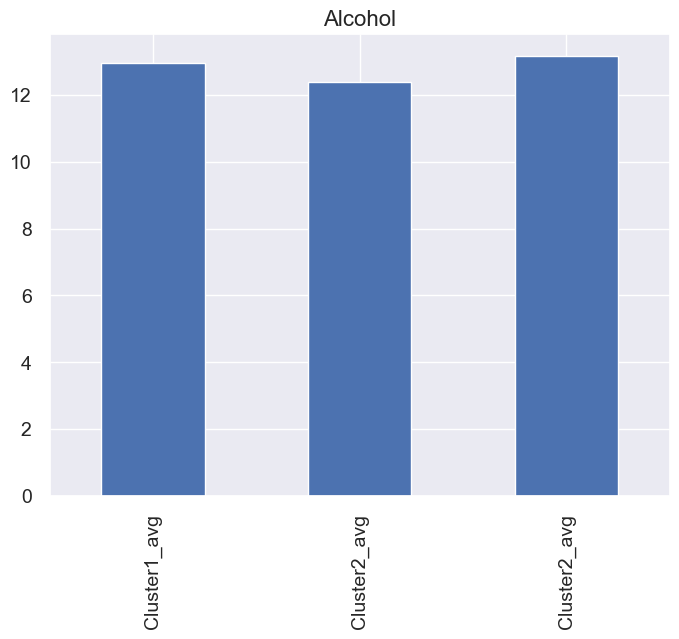

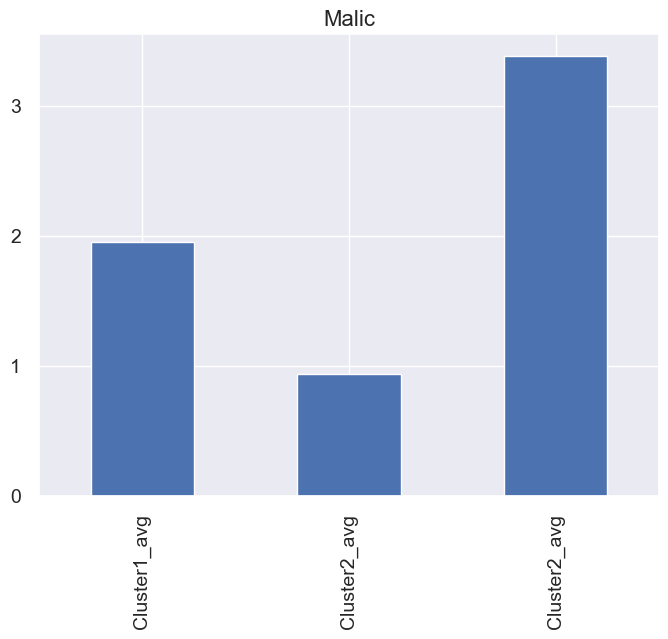

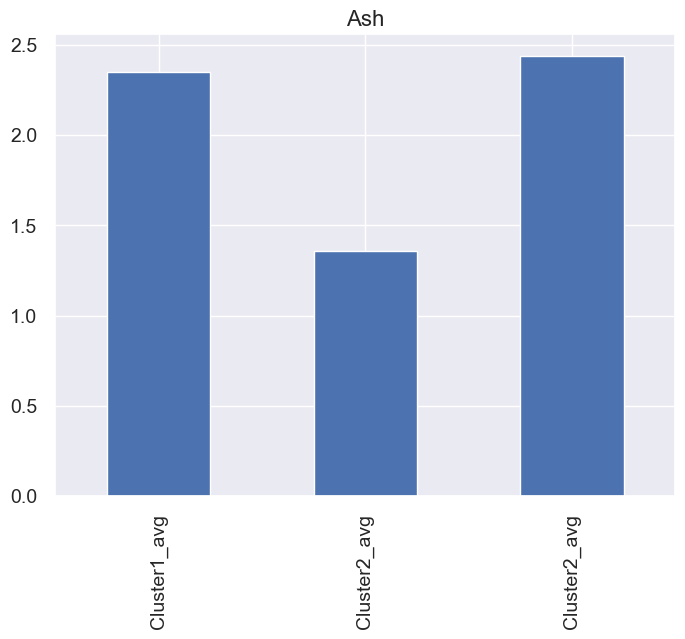

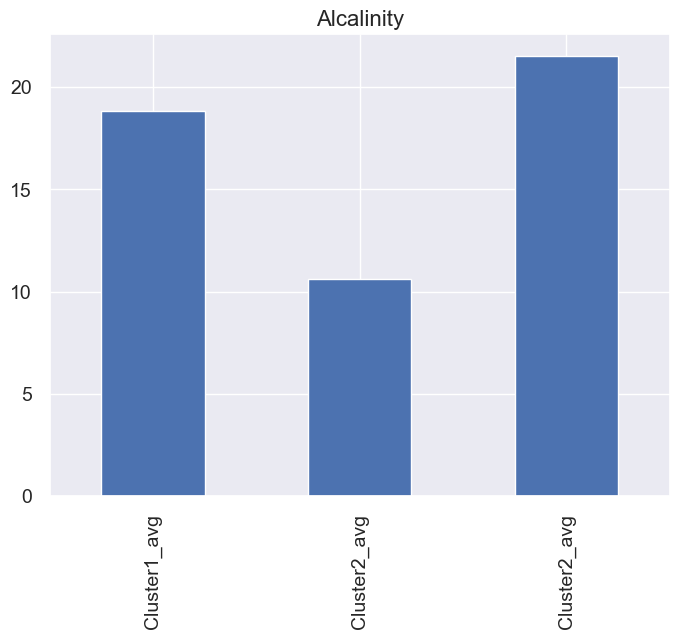

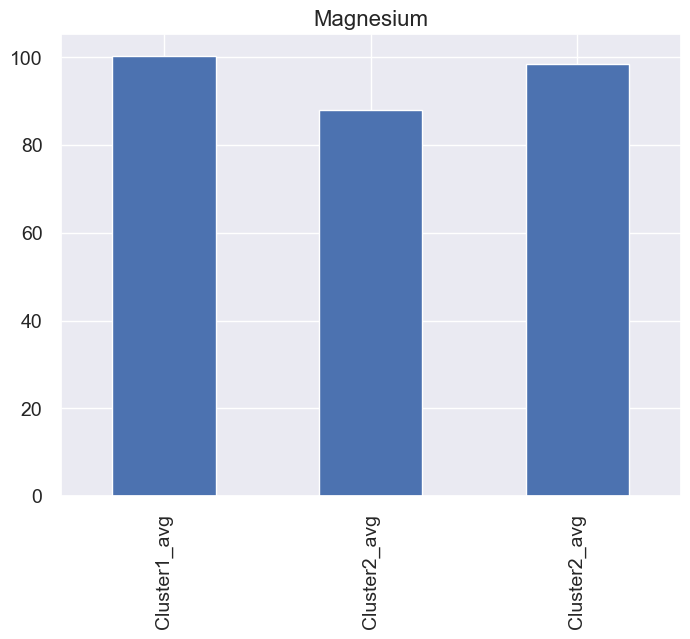

...

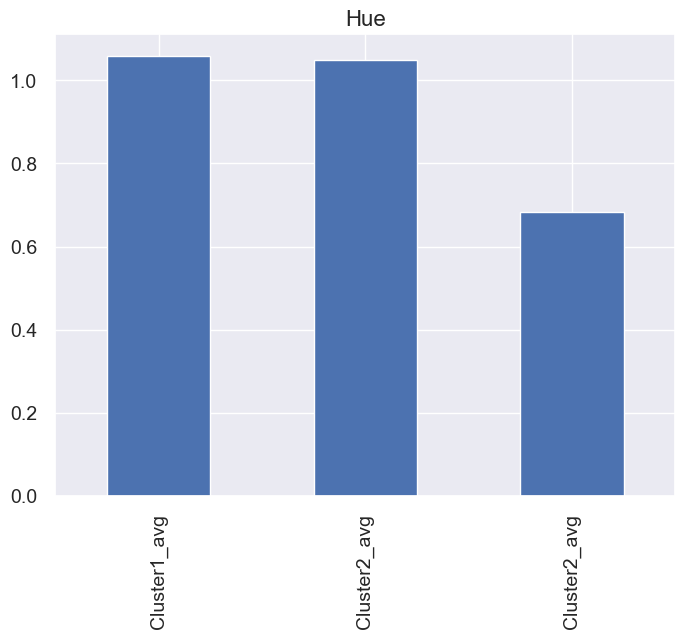

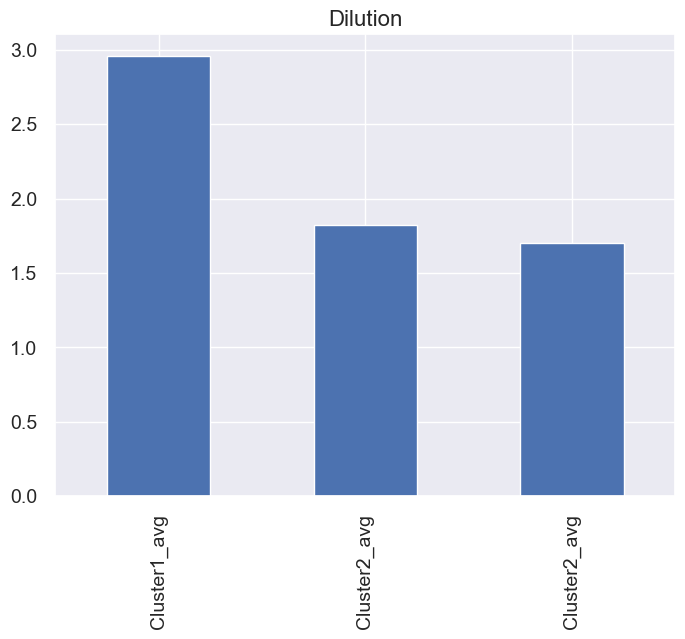

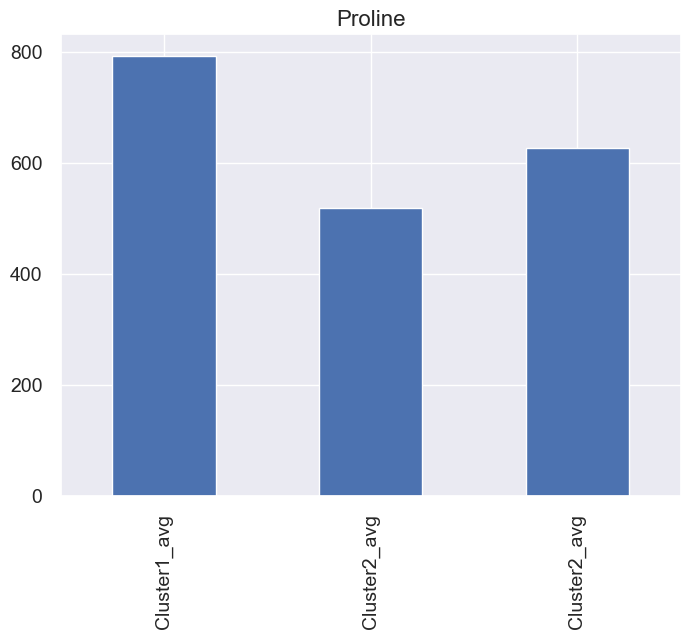

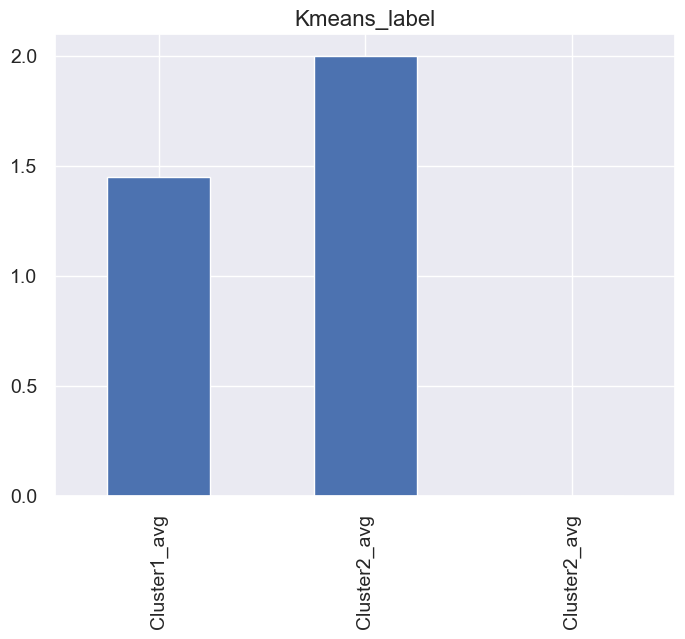

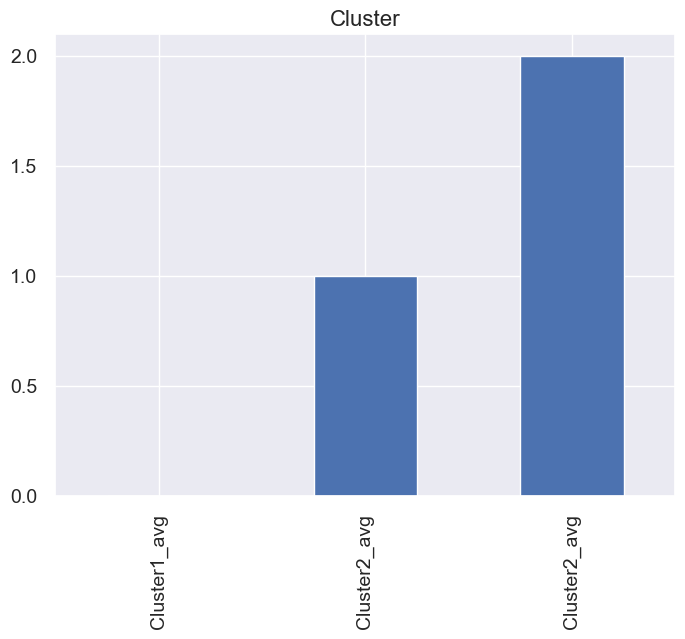

In [114]:
# Extract and plot one Column data .xs method
for i , row in avg_df.iterrows():
    fig = plt.subplots(figsize = (8,6))
    j = avg_df.xs(i ,axis = 0)
    plt.title(i, fontsize = 16, fontweight = 20)
    j.plot(kind = 'bar', fontsize = 14)
    plt.show()
    print()

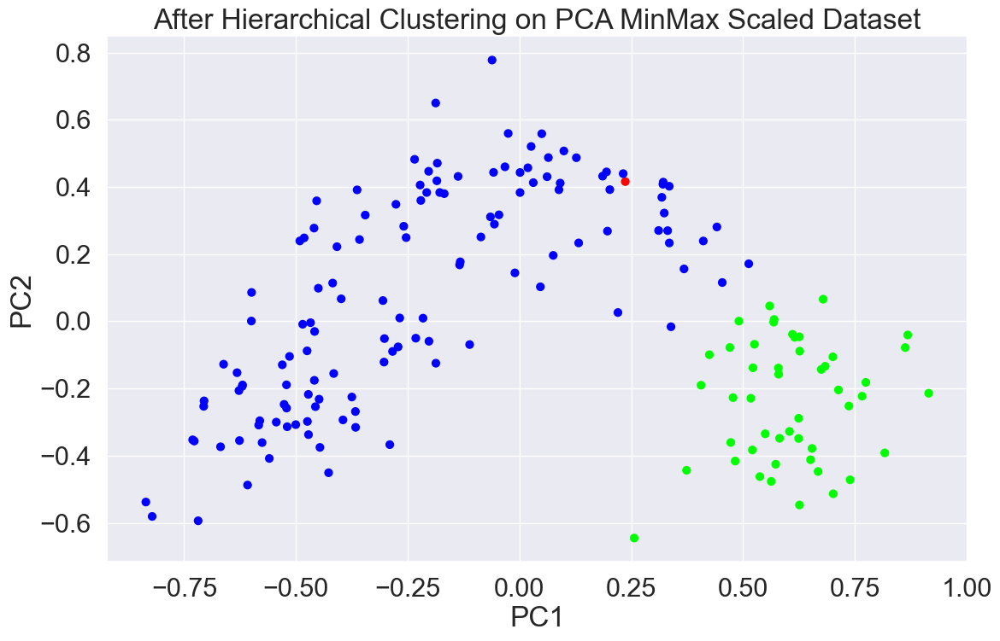

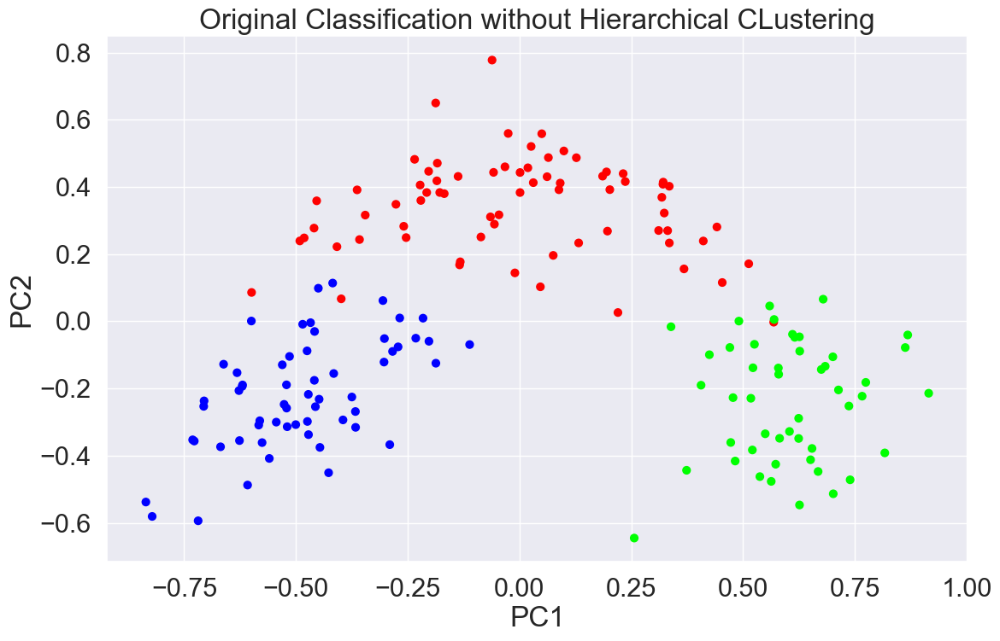

In [115]:
# Comparing Hierarchical Clusters with the Original Classified Dataset using "Type" Feature
# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = df['Hierarchical_labels'], cmap = "brg", s = 40)

# Aesthetics
plt.title('After Hierarchical Clustering on PCA MinMax Scaled Dataset')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

# Scatterplot
plt.scatter(pca_minmax_df.iloc[:,0], pca_minmax_df.iloc[:,1], c = data['Type'], cmap = "brg", s = 40)

# Aesthetics
plt.title('Original Classification without Hierarchical CLustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [116]:
# Group data by Clusters (K=3)
display('After Applying Hierarchical CLustering on  PCA MinMax Scaled Dataset',df.groupby('Hierarchical_labels').agg(['mean']),'Original Classified Dataset',data.groupby('Type').agg(['mean']))

'After Applying Hierarchical CLustering on  PCA MinMax Scaled Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,12.947054,1.956589,2.348062,18.813953,100.279070,2.525814,2.502248,0.327519,1.757442,4.206744,1.058341,2.957597,793.077519,1.449612
1,12.370000,0.940000,1.360000,10.600000,88.000000,1.980000,0.570000,0.280000,0.420000,1.950000,1.050000,1.820000,520.000000,2.000000
2,13.157708,3.386042,2.437083,21.510417,98.541667,1.681667,0.788542,0.455833,1.167708,7.410833,0.684375,1.698542,627.500000,0.000000


'Original Classified Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Type,,,,,,,,,,,,,,,
1,13.744746,2.010678,2.455593,17.037288,106.338983,2.840169,2.982373,0.290000,1.899322,5.528305,1.062034,3.157797,1115.711864,30.0,2.000000
2,12.278732,1.932676,2.244789,20.238028,94.549296,2.258873,2.080845,0.363662,1.630282,3.086620,1.056282,2.785352,519.507042,95.0,0.126761
3,13.153750,3.333750,2.437083,21.416667,99.312500,1.678750,0.781458,0.447500,1.153542,7.396250,0.682708,1.683542,629.895833,154.5,1.000000


In [117]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a DataFrame 'df' with your data
# Perform MinMax scaling
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Apply PCA to the scaled data
pca = PCA(n_components=3)  # Choose the number of components you want
pca_minmax_df = pca.fit_transform(scaled_data)


In [118]:
# Run Hierarchical Clustering.(Agglomerative Clustering) For PCA on MinMaxScaled Data
agg_clustering = AgglomerativeClustering(n_clusters = 3, linkage = 'average', affinity = 'l2')
y_pred_hie = agg_clustering.fit_predict(pca_minmax_df)
print(y_pred_hie.shape)
y_pred_hie

(178,)


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [119]:
# Cluster numbers

agg_clustering.n_clusters_

3

In [120]:
# Clustering Score

(sil(pca_minmax_df, agg_clustering.labels_)*100).round(3)

45.485

In [121]:
# Import necessary library
from sklearn.metrics import silhouette_score

# Calculate the silhouette score
silhouette_avg = silhouette_score(pca_minmax_df, y_pred_hie)

# Round the silhouette score to 3 decimal places
rounded_silhouette_score = round(silhouette_avg, 3)

# Print the rounded silhouette score
rounded_silhouette_score


0.455

In [122]:
# Putting Cluster lables into original dataset And analysis of the same
# Concating Labels with main dataset copy

df['Hierarchical_labels'] = agg_clustering.labels_
df.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label,Hierarchical_labels
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1,0


In [123]:
df.groupby('Hierarchical_labels').agg(['mean'])

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,12.951587,1.954444,2.353810,18.858730,100.269841,2.545000,2.530794,0.326032,1.780317,4.201746,1.064175,2.988333,800.436508,1.484127
1,13.157708,3.386042,2.437083,21.510417,98.541667,1.681667,0.788542,0.455833,1.167708,7.410833,0.684375,1.698542,627.500000,0.000000
2,12.660000,1.770000,1.920000,15.350000,97.500000,1.785000,1.120000,0.362500,0.702500,3.800000,0.872500,1.705000,493.000000,0.500000


Text(0.5, 1.0, 'PCA plot in 2D')

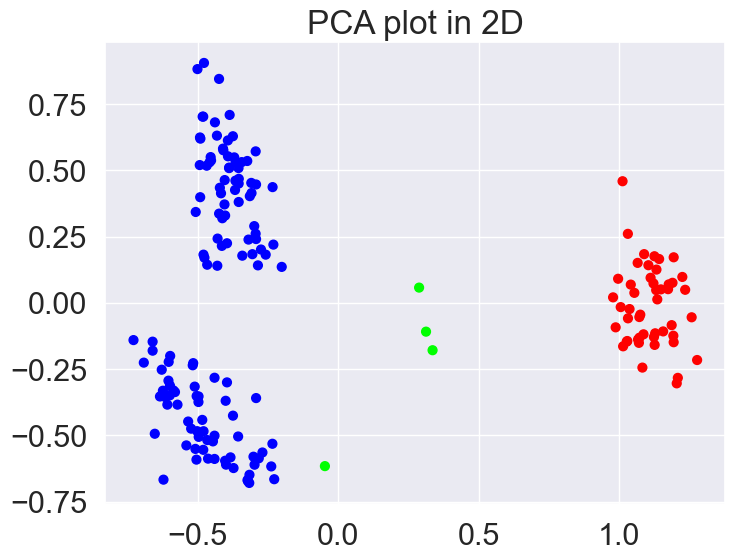

In [124]:
plt.figure(figsize=(8, 6))
# Scatterplot
plt.scatter(pca_minmax_df[:, 0], pca_minmax_df[:, 1], c=df['Hierarchical_labels'], cmap="brg", s=40)
# Aesthetics
plt.title('PCA plot in 2D')


In [125]:
import seaborn as sns  # Import Seaborn

# Rest of your code
aux = df1.columns.tolist()
aux[0:len(aux)-1]

sns.set(style="darkgrid", rc={'figure.figsize': (13, 8)}, font_scale=2)

# Rest of your code


C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mariyam qureshi\OneDrive\Documents\Lib\site-packages\seaborn\axisgrid.p

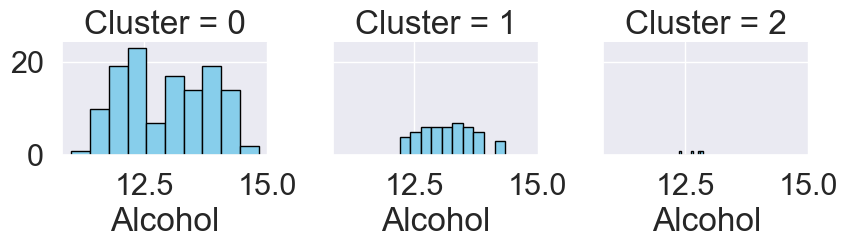

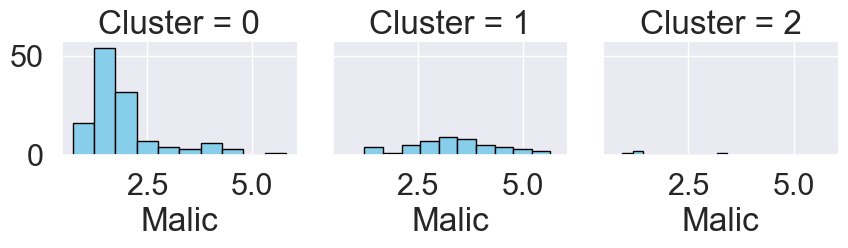

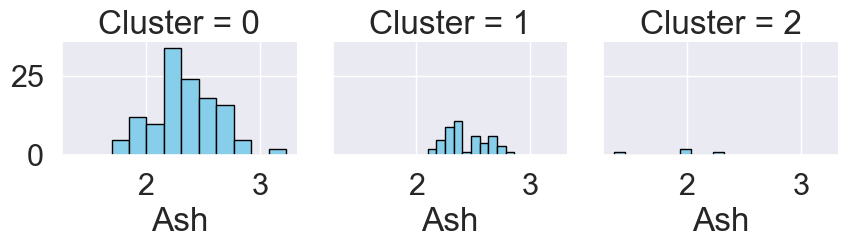

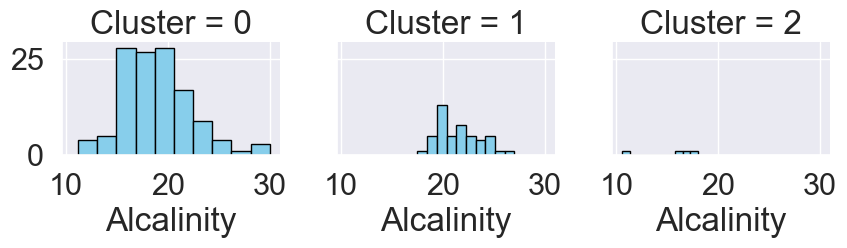

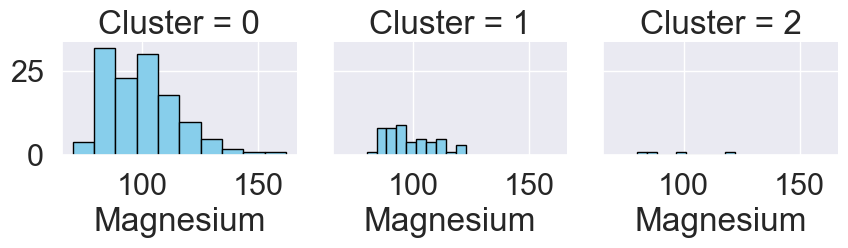

...

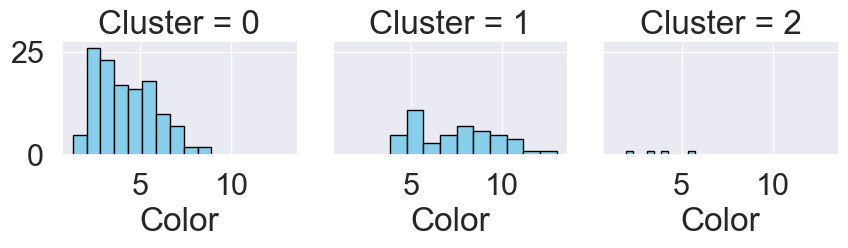

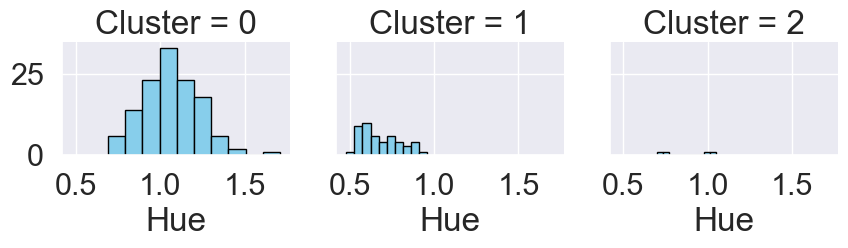

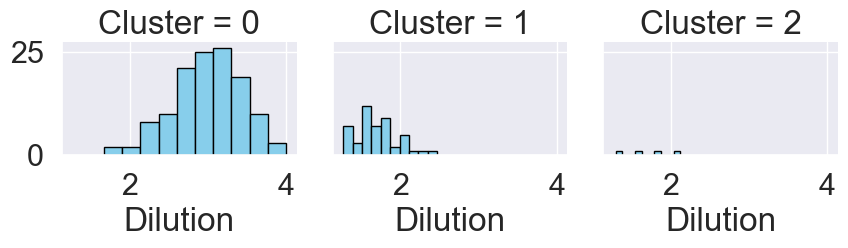

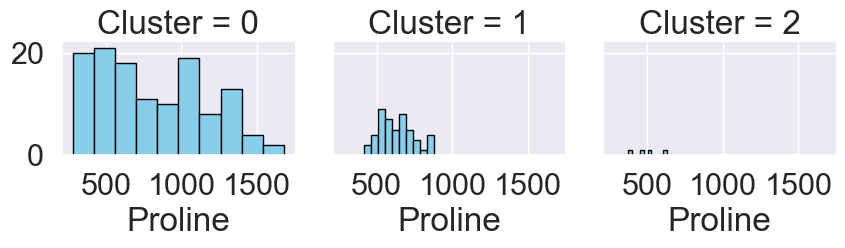

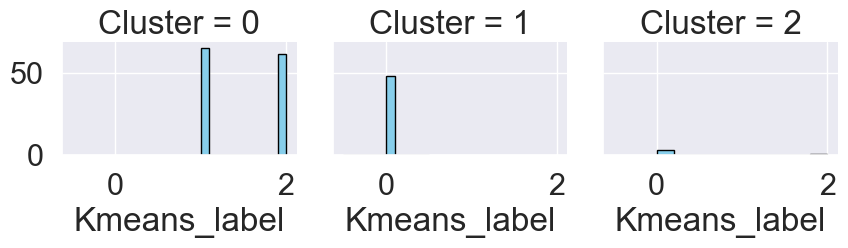

In [126]:
df1 = df.copy()
df1.rename({"Hierarchical_labels":'Cluster'}, axis = 1,inplace = True)

aux = df1.columns.tolist()
aux[0:len(aux)-1]

sns.set(style = "darkgrid", rc = {'figure.figsize':(13,8)}, font_scale = 2)

for cluster in aux[0:len(aux)-1]:
    grid = sns.FacetGrid(df1, col = "Cluster")
    grid.map(plt.hist, cluster, color = "skyblue", lw = 1, edgecolor = "black")

In [127]:
# Sorting elements based on cluster label assigned and taking average for insights.

cluster1 = pd.DataFrame(df1.loc[df1.Cluster == 0].mean(),columns = ['Cluster1_avg'])
cluster2 = pd.DataFrame(df1.loc[df1.Cluster == 1].mean(),columns = ['Cluster2_avg'])
cluster3 = pd.DataFrame(df1.loc[df1.Cluster == 2].mean(),columns = ['Cluster2_avg'])

In [128]:
avg_df = pd.concat([cluster1,cluster2,cluster3], axis = 1)
avg_df

,Cluster1_avg,Cluster2_avg,Cluster2_avg
Alcohol,12.951587,13.157708,12.6600
Malic,1.954444,3.386042,1.7700
Ash,2.353810,2.437083,1.9200
Alcalinity,18.858730,21.510417,15.3500
Magnesium,100.269841,98.541667,97.5000
Phenols,2.545000,1.681667,1.7850
Flavanoids,2.530794,0.788542,1.1200
Nonflavanoids,0.326032,0.455833,0.3625
Proanthocyanins,1.780317,1.167708,0.7025
Color,4.201746,7.410833,3.8000


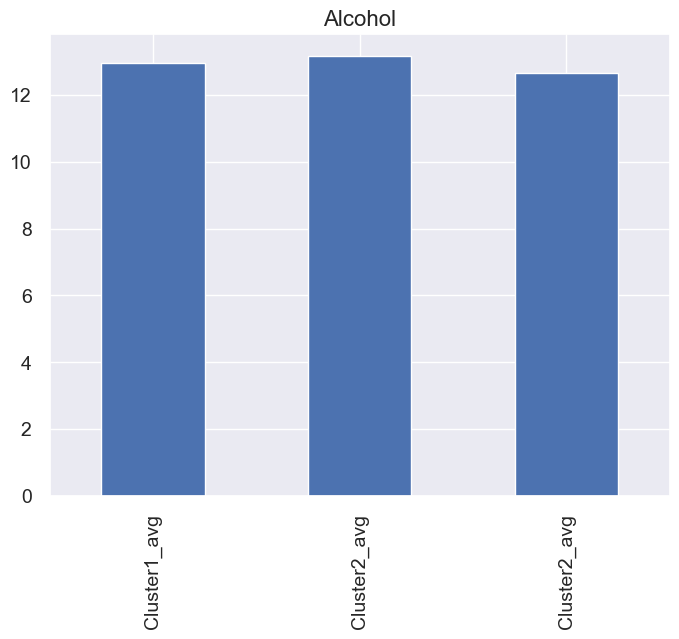

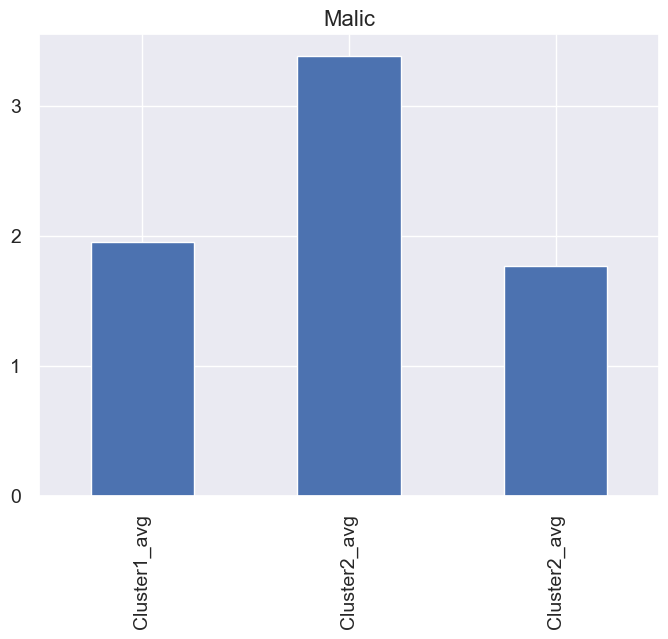

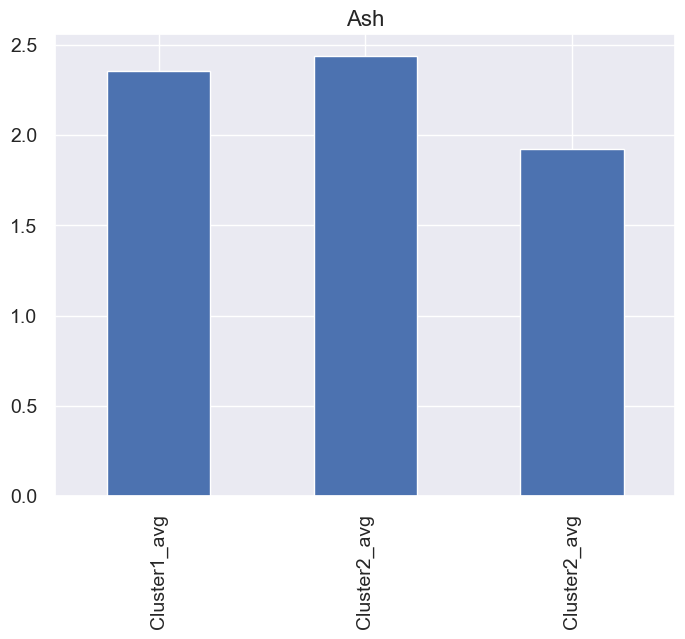

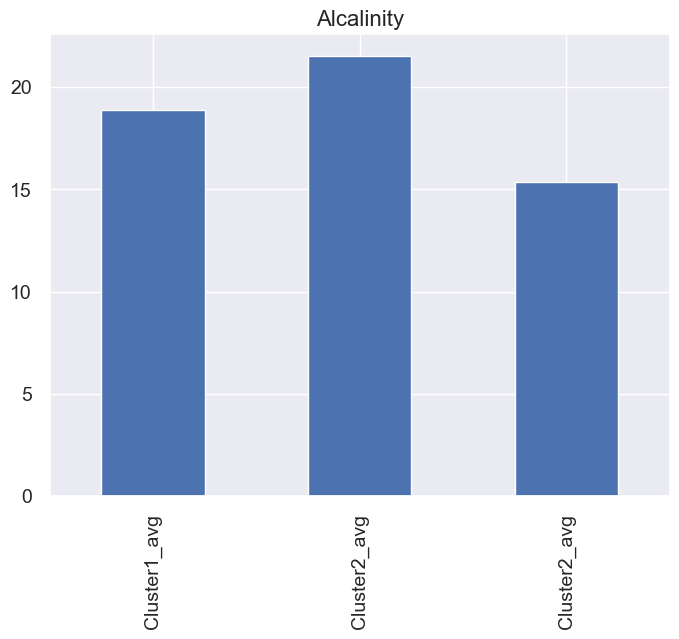

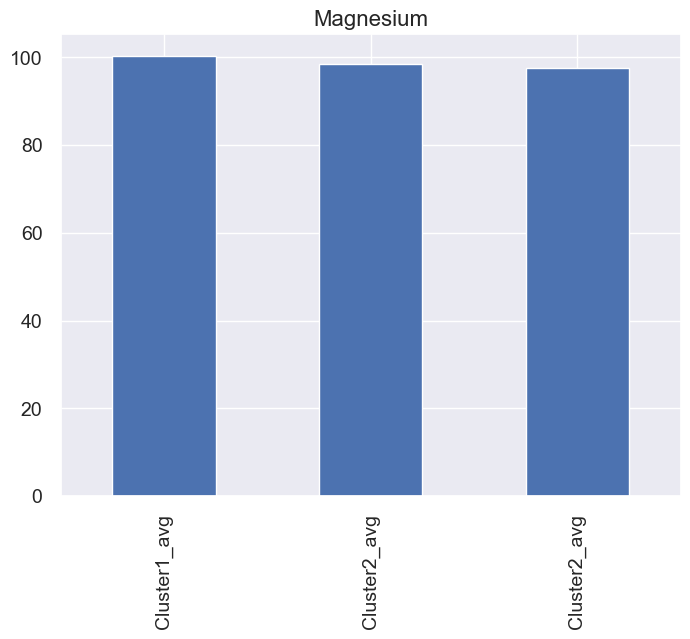

...

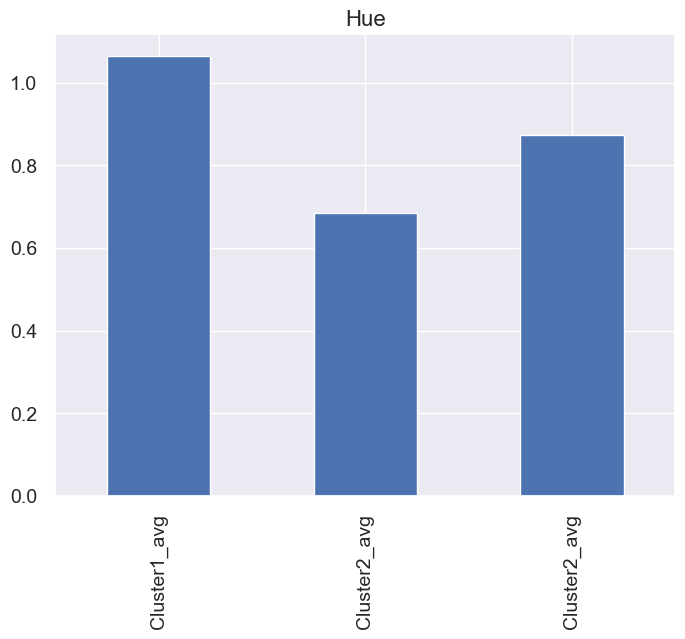

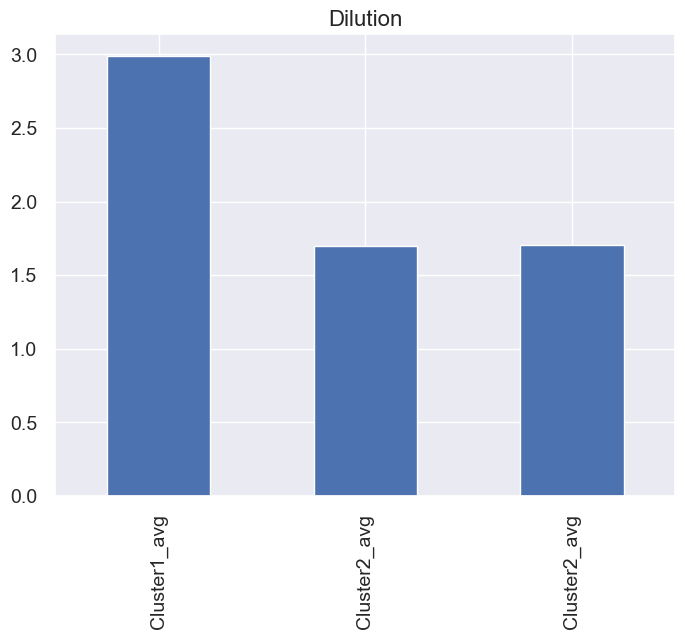

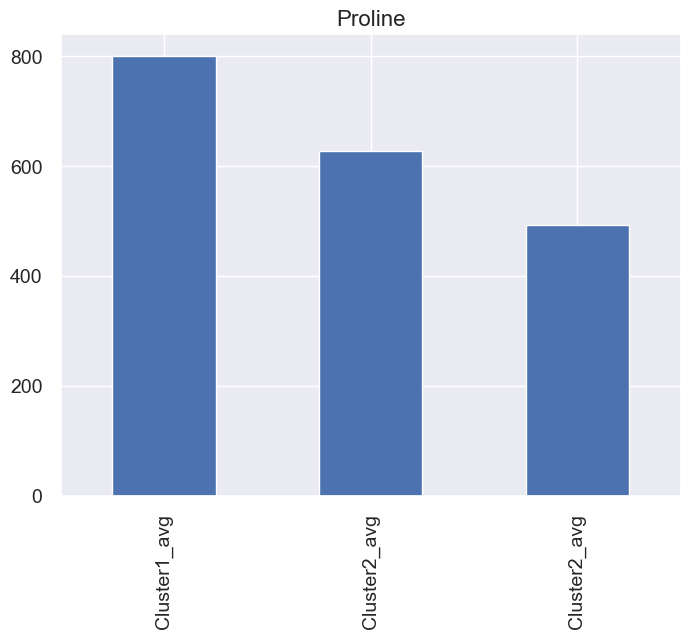

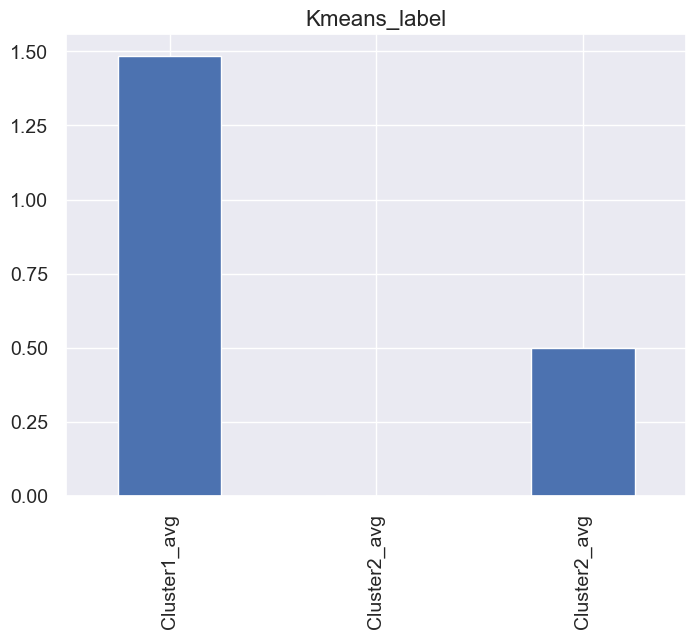

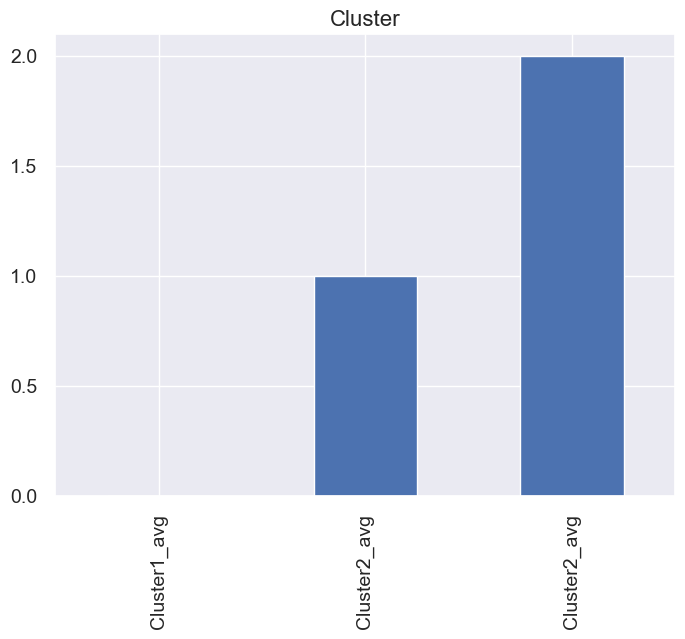

In [129]:
# Extract and plot one Column data .xs method
for i , row in avg_df.iterrows():
    fig = plt.subplots(figsize = (8,6))
    j = avg_df.xs(i ,axis = 0)
    plt.title(i, fontsize = 16, fontweight = 20)
    j.plot(kind = 'bar', fontsize = 14)
    plt.show()
    print()

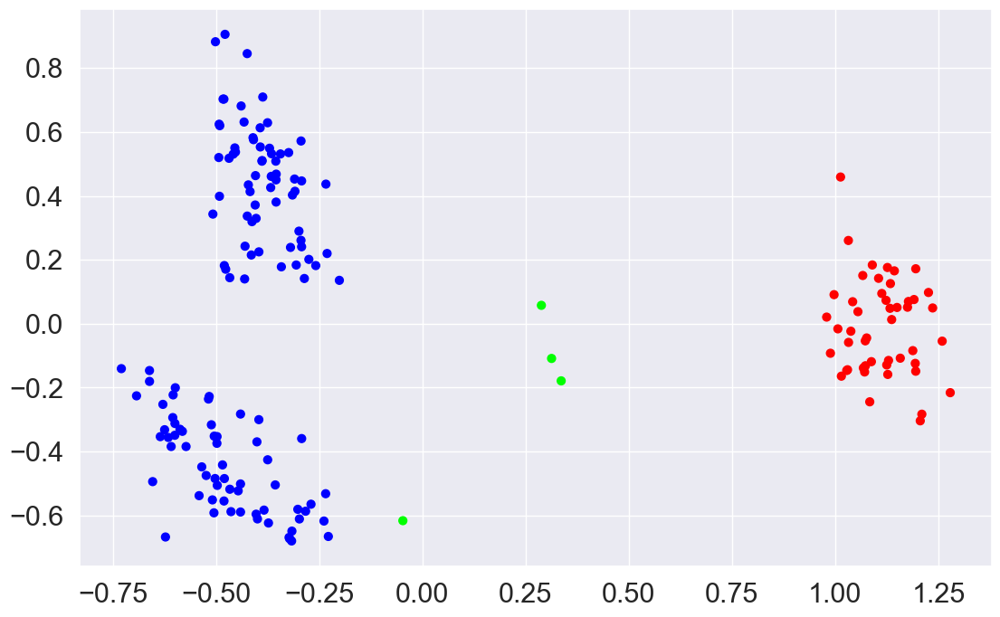

In [130]:
plt.scatter(pca_minmax_df[:, 0], pca_minmax_df[:, 1], c=df['Hierarchical_labels'], cmap="brg", s=40)


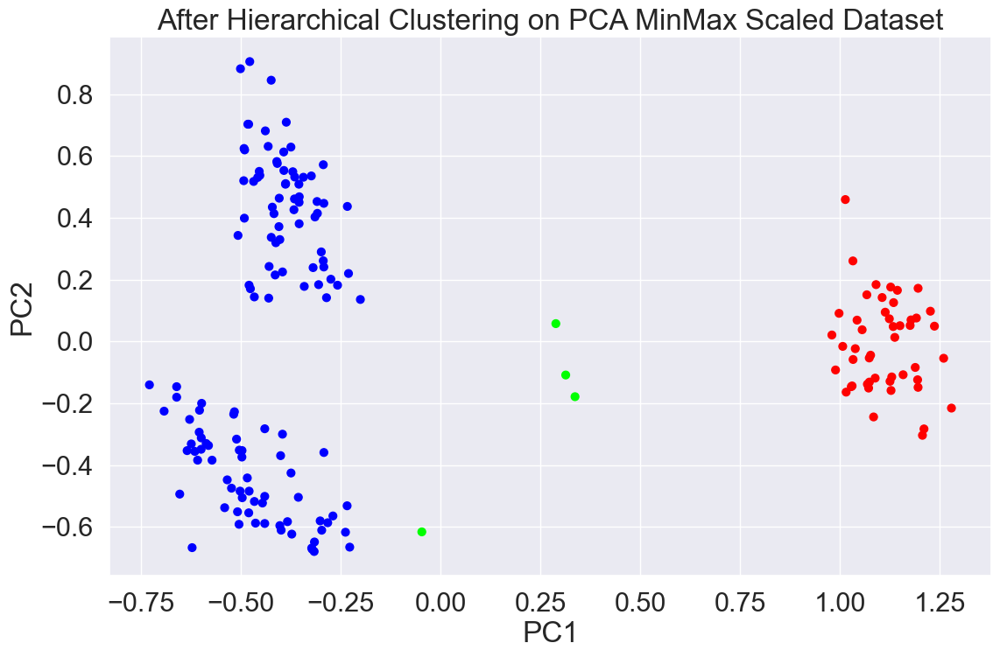

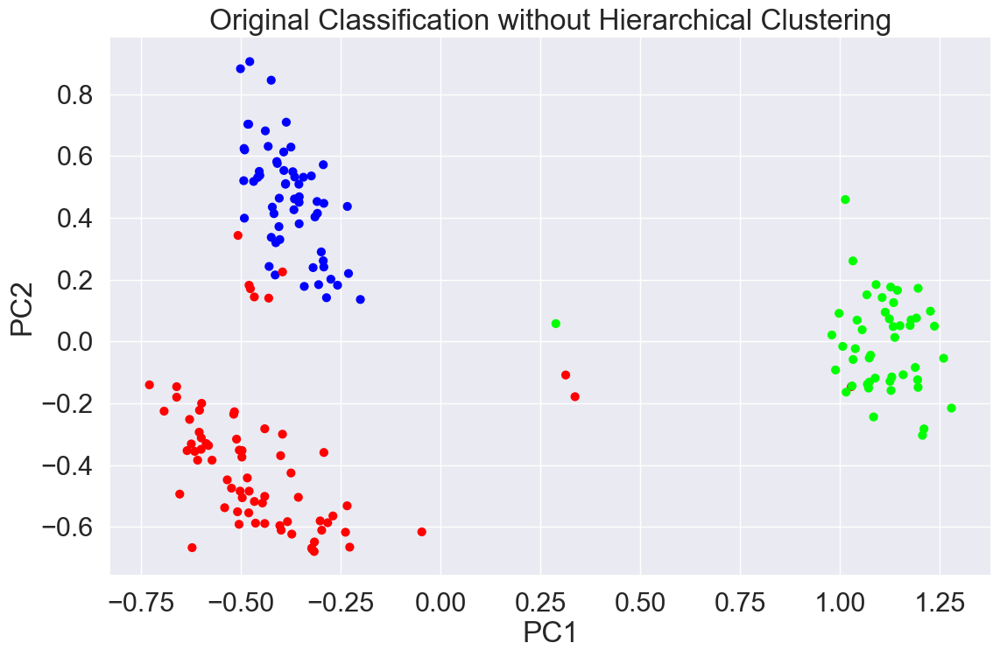

In [131]:
# Comparing Hierarchical Clusters with the Original Classified Dataset using "Type" Feature
# Scatterplot
plt.scatter(pca_minmax_df[:, 0], pca_minmax_df[:, 1], c=df['Hierarchical_labels'], cmap="brg", s=40)

# Aesthetics
plt.title('After Hierarchical Clustering on PCA MinMax Scaled Dataset')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

# Scatterplot
plt.scatter(pca_minmax_df[:, 0], pca_minmax_df[:, 1], c=data['Type'], cmap="brg", s=40)

# Aesthetics
plt.title('Original Classification without Hierarchical Clustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


In [132]:
# Group data by Hierarchical Clusters (K=3)
clustered_means = df.groupby('Hierarchical_labels').agg(['mean'])

# Group data by the original classification (Type)
original_means = data.groupby('Type').agg(['mean'])

# Display the means for both datasets
display('After Applying Hierarchical Clustering on PCA MinMax Scaled Dataset', clustered_means, 'Original Classified Dataset', original_means)


'After Applying Hierarchical Clustering on PCA MinMax Scaled Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,,,,
0,12.951587,1.954444,2.353810,18.858730,100.269841,2.545000,2.530794,0.326032,1.780317,4.201746,1.064175,2.988333,800.436508,1.484127
1,13.157708,3.386042,2.437083,21.510417,98.541667,1.681667,0.788542,0.455833,1.167708,7.410833,0.684375,1.698542,627.500000,0.000000
2,12.660000,1.770000,1.920000,15.350000,97.500000,1.785000,1.120000,0.362500,0.702500,3.800000,0.872500,1.705000,493.000000,0.500000


'Original Classified Dataset'

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,ID,Kmeans_label
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Type,,,,,,,,,,,,,,,
1,13.744746,2.010678,2.455593,17.037288,106.338983,2.840169,2.982373,0.290000,1.899322,5.528305,1.062034,3.157797,1115.711864,30.0,2.000000
2,12.278732,1.932676,2.244789,20.238028,94.549296,2.258873,2.080845,0.363662,1.630282,3.086620,1.056282,2.785352,519.507042,95.0,0.126761
3,13.153750,3.333750,2.437083,21.416667,99.312500,1.678750,0.781458,0.447500,1.153542,7.396250,0.682708,1.683542,629.895833,154.5,1.000000


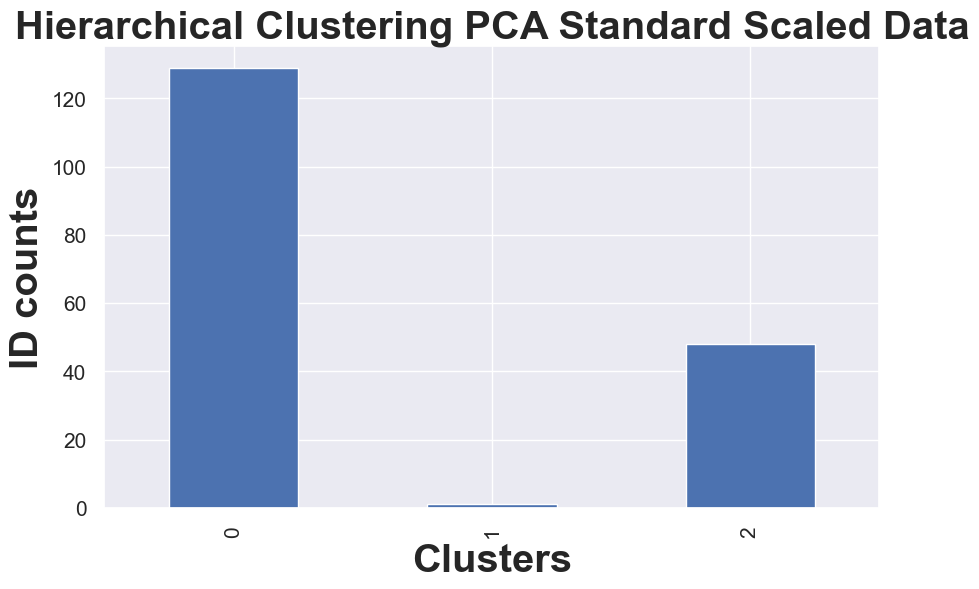

In [133]:
import matplotlib.pyplot as plt


# Create a bar plot
fig, ax = plt.subplots(figsize=(10, 6))
cluster_counts.plot(kind='bar')
plt.ylabel('ID Counts')
plt.title('Hierarchical Clustering PCA Standard Scaled Data', fontsize='large', fontweight='bold')
ax.set_xlabel('Clusters', fontsize='large', fontweight='bold')
ax.set_ylabel('ID counts', fontsize='large', fontweight='bold')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()


In [134]:
# I have applied EDA to analyze dataset.Discovered correlation between diff variables and found colinearity.
# Applied Standardazation & MinMaxScalar transformation on the data to use Principle componets analysis effectively.
# I have used & analyzed two clustering techniques here..i) KMeans ii) Hierarchical Clusterig
# By applying clustering on diff. PCA obtained with diff transformation data shows fluctuation in model score. So finally the Standard Scaler found less score so not used for further model building.